In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split, KFold, cross_val_predict
from sklearn.preprocessing import LabelEncoder
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from keras_preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense, Input, concatenate
from keras.callbacks import TensorBoard 
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score,  precision_score, recall_score, f1_score
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.neighbors import KNeighborsClassifier


In [2]:
corpus=[] #Crea lista corpus que contiene 
target=[] #Crea lista target que contiene 
edad=[] #Crea lista edad que contiene 
sexo=[] #Crea lista sexo que contiene 
severidad=[] #Crea lista severidad que contiene 

archivo=open("dataset_elpino.csv",encoding="utf-8")
header=archivo.readline().strip().split(";")
features=[] #Crea lista features que contiene 
for col in header: #recorre la cantidad de columnas en el csv
    col=col.split("-")[0].strip() 
    if col.startswith("Diag") or col.startswith("Proc"): #separa los diag de los proc.
        col=col.split(" ")
        col=col[0]+col[1]
    features.append(col) #Añade todas los headers de las columnas (diagnosticos, procedimientos)
for linea in archivo: 
    row=[] #crea una lista para almacenar la fila actual
    linea=linea.strip().split(";") #separa la lista por ;
    for i in range(len(linea)):
        col=linea[i].split("-")[0].strip()
        if i==67: # Si el índice "i" es 67 (columna 68).
            grd=col
            #target.append(grd[-1])
            target.append(grd) #almacena el grd de la fila actual
        elif i==66:
            sexo.append(1 if col=="Mujer" else 0) # almacena el sexo 1 si es mujer 0 si es hombre
        elif i==65:
            edad.append(int(col))#se alamacena la edad
        else:
            row.append(col) #se guardan el codigo de la columna correspondientes a la fila
    corpus.append(row)

In [3]:
df=pd.DataFrame(corpus,columns=features[:-3])  #crea una tabla de datos (un DataFrame) a partir de la información que le damos. ingresamos corpus (matris con los codigos de los diagnosticos ) y fetures (como queremos dividir las columnas)
df["GRD"]=target #Esto crea una nueva columna en el DataFrame df y la nombra "GRD".

In [4]:
dfsexo = pd.DataFrame({"Sexo": sexo, "GRD": target})

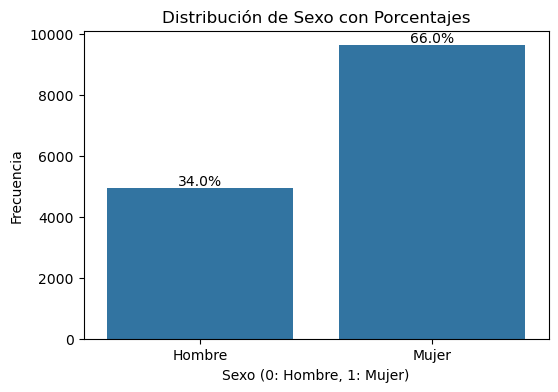

In [5]:

plt.figure(figsize=(6, 4))
ax = sns.countplot(x=sexo)
plt.title('Distribución de Sexo con Porcentajes')
plt.xlabel('Sexo (0: Hombre, 1: Mujer)')
plt.ylabel('Frecuencia')
plt.xticks([0, 1], ['Hombre', 'Mujer'])

total = len(sexo)
for p in ax.patches:
    porcentaje = f'{100 * p.get_height() / total:.1f}%'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.text(x, y, porcentaje, ha='center', va='bottom')

plt.show()

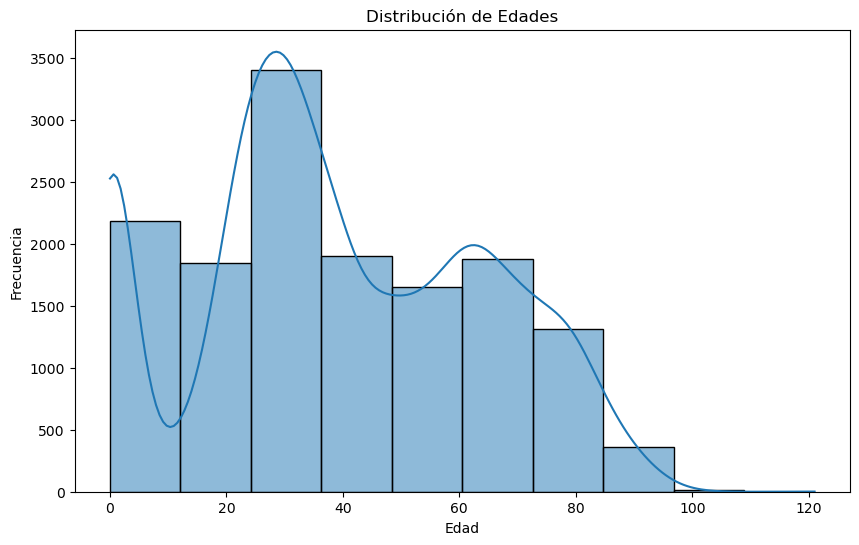

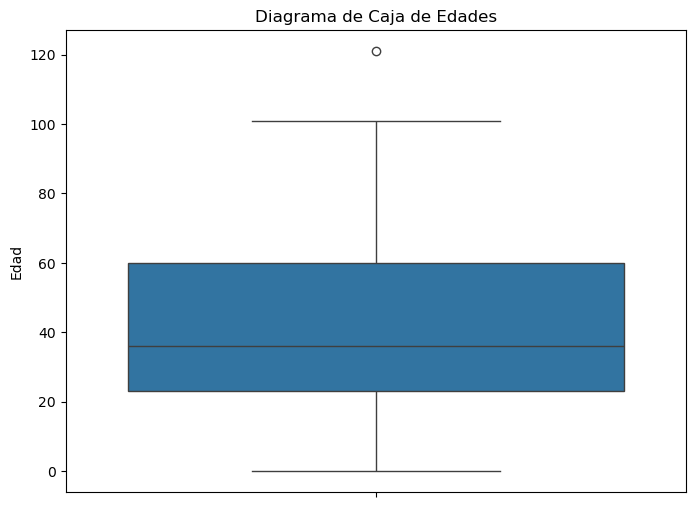

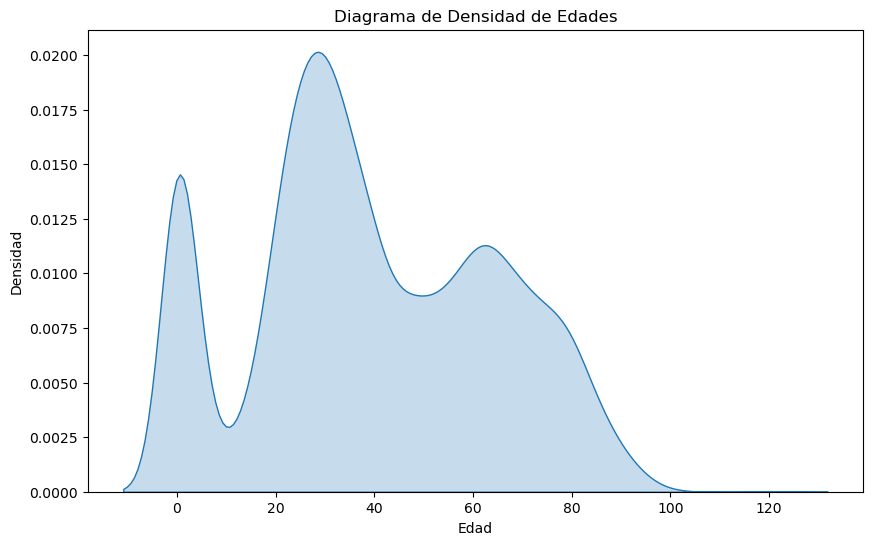

In [6]:
# Crear un histograma
plt.figure(figsize=(10, 6))
sns.histplot(edad, bins=10, kde=True)
plt.title('Distribución de Edades')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

# Crear un diagrama de caja (boxplot)
plt.figure(figsize=(8, 6))
sns.boxplot(y=edad)
plt.title('Diagrama de Caja de Edades')
plt.ylabel('Edad')
plt.show()

# Crear un diagrama de densidad (KDE)
plt.figure(figsize=(10, 6))
sns.kdeplot(edad, fill=True)
plt.title('Diagrama de Densidad de Edades')
plt.xlabel('Edad')
plt.ylabel('Densidad')
plt.show()

In [7]:
df["GRD"].value_counts()[:10] #Esto selecciona la columna llamada "GRD" del DataFrame df y cuenta cuántas veces aparece cada valor único en la columna "GRD". [:20] Esto es un "slice", Toma los primeros 20 elementos de la Serie resultante.


GRD
146101    813
146121    639
146131    538
158171    389
134161    325
071141    317
044153    287
061131    252
041023    248
146102    244
Name: count, dtype: int64

In [8]:
features_procedimientos=[] #crea una lista de procediminetos
features_diagnosticos=[] #crea una lista de diagnosticos
for j in range(1,36):  #recorre las columnas relacionadas al diagnostico del grd
    field="Diag"+str(j).zfill(2) #rellena el texto con el numero de la columna, ---.zfill(2) rellena la cadena de texto con ceros a la izquierda hasta que tenga una longitud de 2 caracteres. Por ejemplo, si j es 1, str(j) será "1", y .zfill(2) lo convertirá en "01". Si j es 10, str(j) será "10", y .zfill(2) lo dejará como "10".
    features_diagnosticos.append(field) #Esto agrega el valor de field a la lista features_diagnosticos.
for j in range(1,31): #recorre las columnas relacionadas al procedimiento del grd
    field="Proced"+str(j).zfill(2)#.rellena el texto con el numero de la columna
    features_procedimientos.append(field)#Esto agrega el valor de field a la lista features_procedimientos.


In [9]:
procedimientos={}#Esto crea un diccionario vacío llamado procedimientos. Este diccionario se utilizará para contar la frecuencia de cada código de procedimiento.
diagnosticos={}#Esto crea un diccionario vacío llamado diagnosticos. Este diccionario se utilizará para contar la frecuencia de cada código de diagnosticos.
for i, row in df.iterrows():#Esto inicia un bucle for que itera sobre cada fila del  data
    for j in range(1,36): #recorre las columas dianostico
        field="Diag"+str(j).zfill(2) #rellena el texto con el numero de la columna
        if row[field] not in diagnosticos:#esto verifica si el valor de la celda actual (el código de diagnóstico) ya existe como clave en el diccionario diagnosticos.
            diagnosticos[row[field]]=1 #Si el código de diagnóstico no existe en el diccionario, se agrega como clave con un valor de 1
        else:
            diagnosticos[row[field]]+=1#suma uno al contador de diagnosticos
    for j in range(1,31):#recorre las columas procedimientos
        field="Proced"+str(j).zfill(2) #rellena el texto con el numero de la columna
        if row[field] not in procedimientos:#esto verifica si el valor de la celda actual (el código de procedimientos) ya existe como clave en el diccionario procedimientos.
            procedimientos[row[field]]=1#Si el código de procedimientos no existe en el diccionario, se agrega como clave con un valor de 1
        else:
            procedimientos[row[field]]+=1#suma uno al contador de procedimientos
token_diagnosticos=list(diagnosticos.keys())#Esto crea una lista llamada token_diagnosticos que contiene todos los códigos de diagnóstico únicos encontrados en el DataFrame.
token_procedimientos=list(procedimientos.keys())#Esto crea una lista llamada token_procedimientos que contiene todos los códigos de procedimientos únicos encontrados en el DataFrame.
vocabulario=len(token_diagnosticos)+len(token_procedimientos)+1#Esto calcula el tamaño del vocabulario total, que es la suma del número de diagnósticos únicos, el número de procedimientos únicos
print("Diagnósticos: ",len(token_diagnosticos))
print("Procedimientos: ",len(token_procedimientos))
print("Vocabulario: ",vocabulario)

Diagnósticos:  3649
Procedimientos:  904
Vocabulario:  4554


In [10]:
token_rows=[]#Esto crea una lista vacía llamada token_rows
for i, row in df.iterrows():
    token_row=[]#Crea una lista vacía llamada token_row para almacenar los tokens numéricos de la fila actual.
    for j in range(1,36):#bucle entre las columnas de diagnostico
        field="Diag"+str(j).zfill(2)#rellena el texto con el numero de la columna
        token_row.append(1+token_diagnosticos.index(row[field])) #obtiene el código de diagnóstico de la celda actual, encuentra el índice del código de diagnóstico en la lista token_diagnosticos, suma 1 al índice encontrado. Esto asegura que los tokens de diagnóstico comiencen desde 1 en lugar de 0.agrega el token numérico a la lista token_row
    for j in range(1,31):#bucle entre las columnas de procedimientos
        field="Proced"+str(j).zfill(2)#rellena el texto con el numero de la columna
        token_row.append(1+377+token_procedimientos.index(row[field]))#obtiene el código de procedimientos de la celda actual, encuentra el índice del código de procedimientos en la lista token_diagnosticos,suma 1 y 377 al índice encontrado. El número 377 parece ser el total de codigos de diagnosticos unicos encontrados anteriormente. Esto se hace para que los tokens de procedimiento tengan valores distintos a los tokens de diagnóstico.
    token_rows.append(token_row)#Después de procesar todas las columnas de diagnóstico y procedimiento de una fila, esto agrega la lista token_row



Codigo 1 Red Neuronal

In [11]:

# Asumiendo que 'data' es tu DataFrame filtrado y 'token_rows' es tu lista de tokens numéricos

# Crear secuencias con diagnósticos y procedimientos
secuencias_tokens = [row[:65] for row in token_rows]  # Tomar los primeros 65 tokens (diagnósticos y procedimientos)

# Rellenar las secuencias para que tengan la misma longitud
max_longitud = max(len(seq) for seq in secuencias_tokens)
secuencias_padded = pad_sequences(secuencias_tokens, maxlen=max_longitud)

# Codificar la variable objetivo 'GRD' a numérico
le_grd = LabelEncoder()
target_encoded = le_grd.fit_transform(df['GRD'])
num_classes = len(np.unique(target_encoded))  # Asegurar el número correcto de clases


# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(secuencias_padded, target_encoded, test_size=0.2, random_state=42)
vocabulario_size = len(set(token for row in secuencias_tokens for token in row)) + 1  # +1 para el relleno



In [14]:
num_grd_unicos = df['GRD'].nunique()
print(f"El número de valores únicos en la columna 'GRD' es: {num_grd_unicos}")

El número de valores únicos en la columna 'GRD' es: 526


In [15]:

model = Sequential()
model.add(Embedding(vocabulario_size, 100, input_length=max_longitud))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(num_grd_unicos, activation='softmax')) # 10 neuronas para las 10 clases

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy']) # Usar sparse_categorical_crossentropy

# Configuración de TensorBoard
log_dir = "logs/fit/diagproc/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Entrenar el modelo con TensorBoard
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2, callbacks=[tensorboard_callback])

# Evaluar el modelo
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Loss: {loss}, Accuracy: {accuracy}')

# Imprimir información adicional
print("Valores únicos en y_train:", np.unique(y_train))
print("Valores únicos en y_test:", np.unique(y_test))

Epoch 1/10
292/292 [==============================] - 5s 15ms/step - loss: 4.0189 - accuracy: 0.2668 - val_loss: 3.0003 - val_accuracy: 0.4210
Epoch 2/10
292/292 [==============================] - 5s 18ms/step - loss: 2.2016 - accuracy: 0.5453 - val_loss: 2.0236 - val_accuracy: 0.5918
Epoch 3/10
292/292 [==============================] - 7s 25ms/step - loss: 1.1310 - accuracy: 0.7582 - val_loss: 1.6070 - val_accuracy: 0.6695
Epoch 4/10
292/292 [==============================] - 4s 14ms/step - loss: 0.4482 - accuracy: 0.9059 - val_loss: 1.5668 - val_accuracy: 0.6837
Epoch 5/10
292/292 [==============================] - 4s 15ms/step - loss: 0.1558 - accuracy: 0.9698 - val_loss: 1.5961 - val_accuracy: 0.6979
Epoch 6/10
292/292 [==============================] - 6s 20ms/step - loss: 0.0559 - accuracy: 0.9906 - val_loss: 1.6548 - val_accuracy: 0.6948
Epoch 7/10
292/292 [==============================] - 4s 12ms/step - loss: 0.0319 - accuracy: 0.9945 - val_loss: 1.6829 - val_accuracy: 0.7021

In [18]:
# Obtener las predicciones del modelo
y_pred = np.argmax(model.predict(X_test), axis=-1)

# Calcular la matriz de confusión usando y_test y y_pred
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz de confusión
plt.figure(figsize=(160, 120))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicciones')
plt.ylabel('Etiquetas Verdaderas')
plt.title('Matriz de Confusión (Red neuronal)') 
plt.savefig('matriz_confusion_red_neuronal.png') # Puedes cambiar el nombre y formato del archivo
plt.show()


# Imprimir el número total de pruebas realizadas
total_pruebas = np.sum(cm)
print(f"Número total de pruebas realizadas: {total_pruebas}")

#imprimir el numero total de filas analizadas, si la variable data existe.
try:
  print(f"Número total de filas analizadas: {len(df)}")
except NameError:
  print("La variable 'data' no está definida.")

92/92 [==============================] - 0s 3ms/step


Número total de pruebas realizadas: 2913
Número total de filas analizadas: 14561


Matriz de Confusión Binaria para la Clase 0:


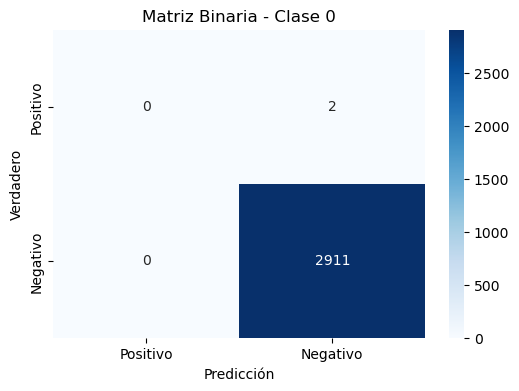

Métricas para la Clase 0:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 1:


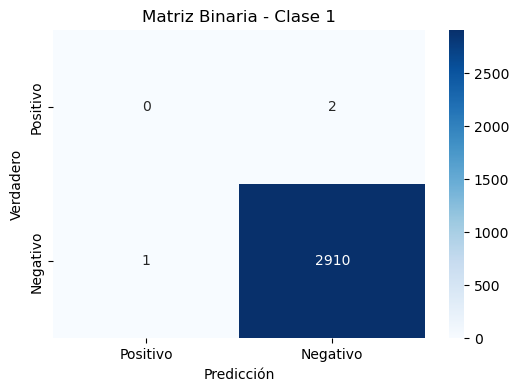

Métricas para la Clase 1:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 2:


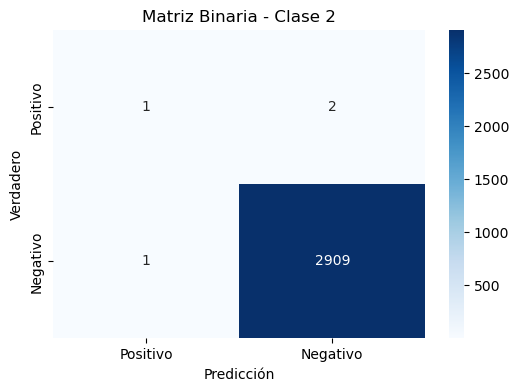

Métricas para la Clase 2:
  Precisión: 0.5000
  Recall: 0.3333
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 3:


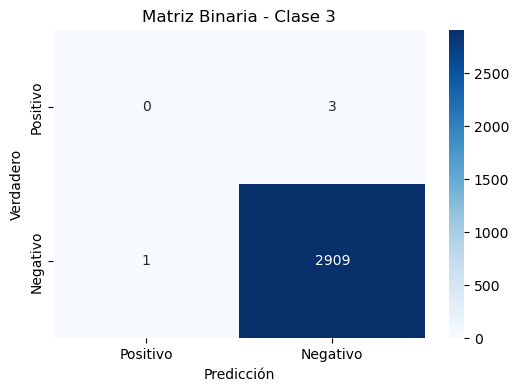

Métricas para la Clase 3:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 4:


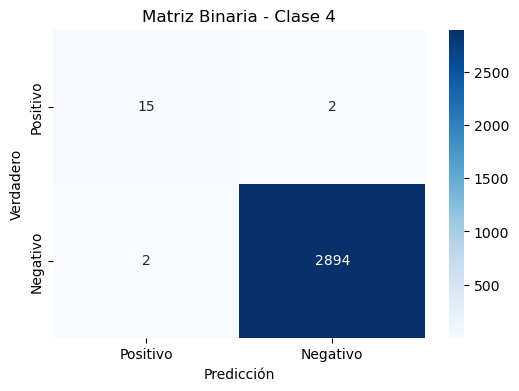

Métricas para la Clase 4:
  Precisión: 0.8824
  Recall: 0.8824
  F1-score: 0.8824
------------------------------
Matriz de Confusión Binaria para la Clase 5:


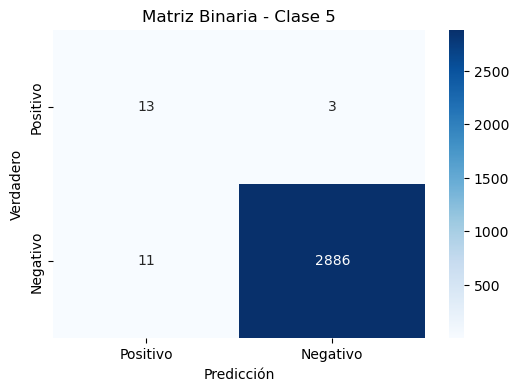

Métricas para la Clase 5:
  Precisión: 0.5417
  Recall: 0.8125
  F1-score: 0.6500
------------------------------
Matriz de Confusión Binaria para la Clase 6:


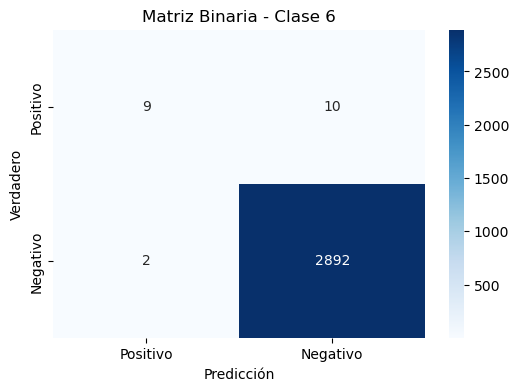

Métricas para la Clase 6:
  Precisión: 0.8182
  Recall: 0.4737
  F1-score: 0.6000
------------------------------
Matriz de Confusión Binaria para la Clase 7:


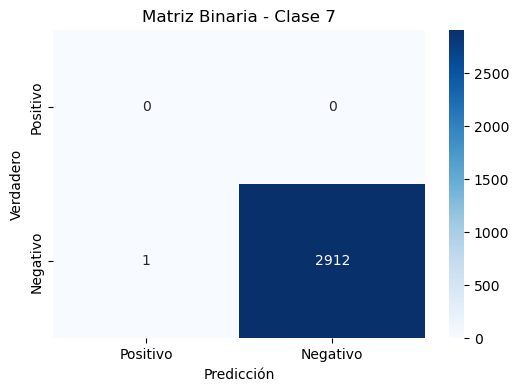

Métricas para la Clase 7:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 8:


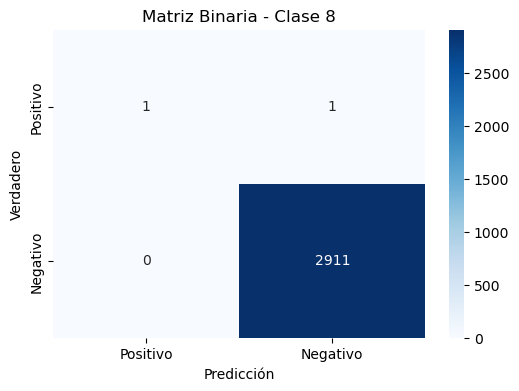

Métricas para la Clase 8:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 9:


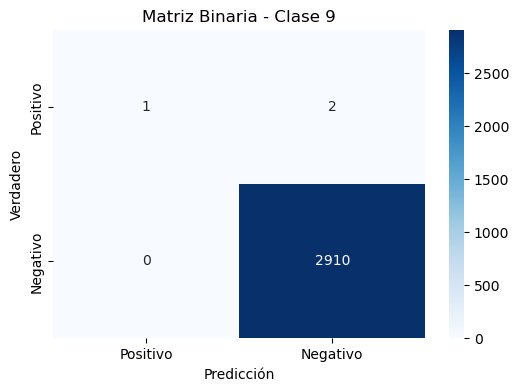

Métricas para la Clase 9:
  Precisión: 1.0000
  Recall: 0.3333
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 10:


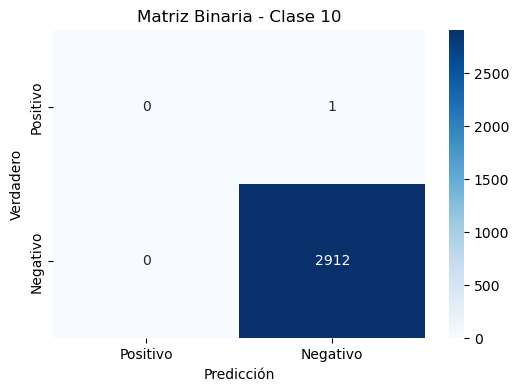

Métricas para la Clase 10:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 11:


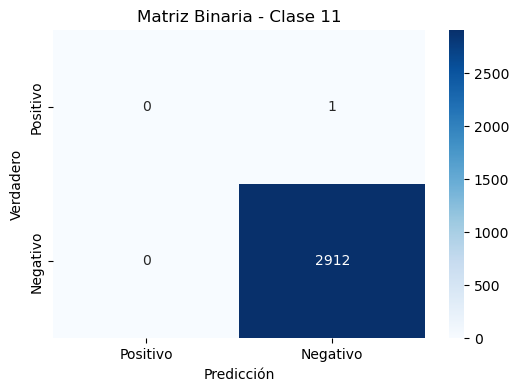

Métricas para la Clase 11:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 12:


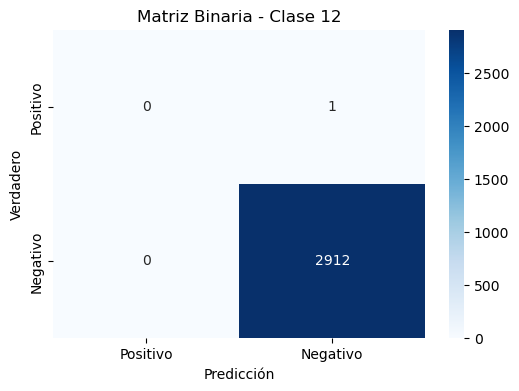

Métricas para la Clase 12:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 13:


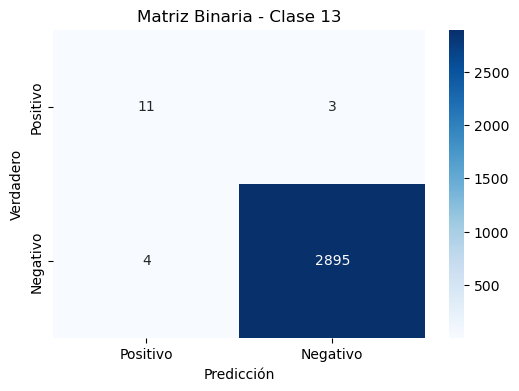

Métricas para la Clase 13:
  Precisión: 0.7333
  Recall: 0.7857
  F1-score: 0.7586
------------------------------
Matriz de Confusión Binaria para la Clase 14:


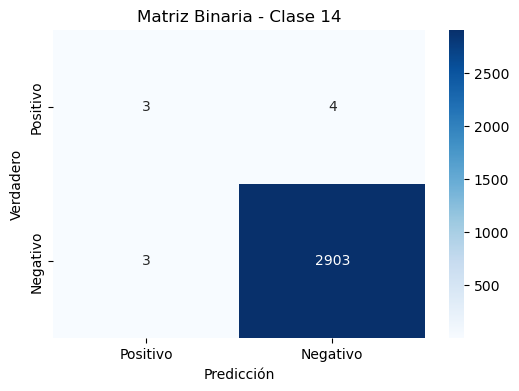

Métricas para la Clase 14:
  Precisión: 0.5000
  Recall: 0.4286
  F1-score: 0.4615
------------------------------
Matriz de Confusión Binaria para la Clase 15:


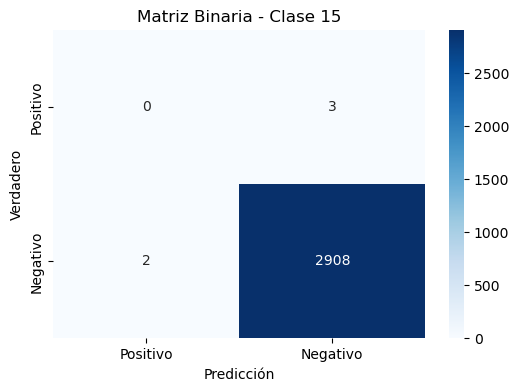

Métricas para la Clase 15:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 16:


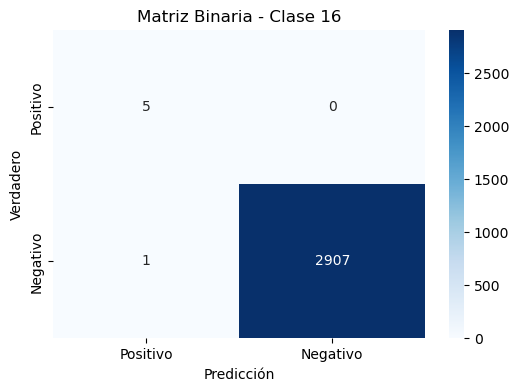

Métricas para la Clase 16:
  Precisión: 0.8333
  Recall: 1.0000
  F1-score: 0.9091
------------------------------
Matriz de Confusión Binaria para la Clase 17:


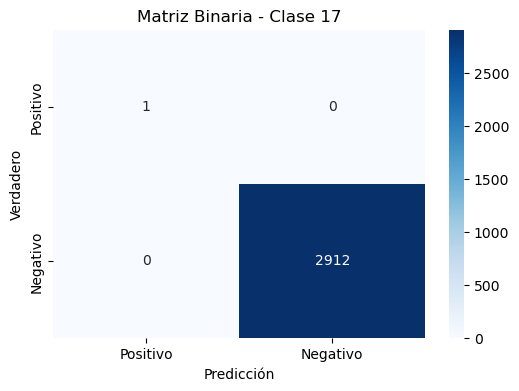

Métricas para la Clase 17:
  Precisión: 1.0000
  Recall: 1.0000
  F1-score: 1.0000
------------------------------
Matriz de Confusión Binaria para la Clase 18:


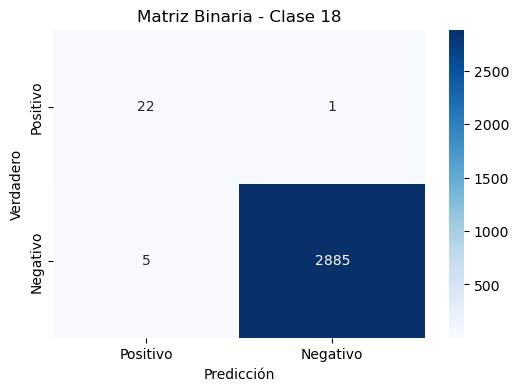

Métricas para la Clase 18:
  Precisión: 0.8148
  Recall: 0.9565
  F1-score: 0.8800
------------------------------
Matriz de Confusión Binaria para la Clase 19:


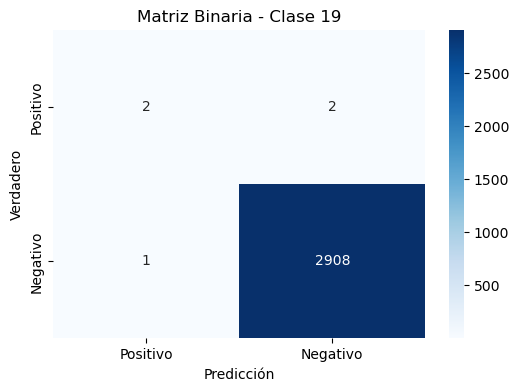

Métricas para la Clase 19:
  Precisión: 0.6667
  Recall: 0.5000
  F1-score: 0.5714
------------------------------
Matriz de Confusión Binaria para la Clase 20:


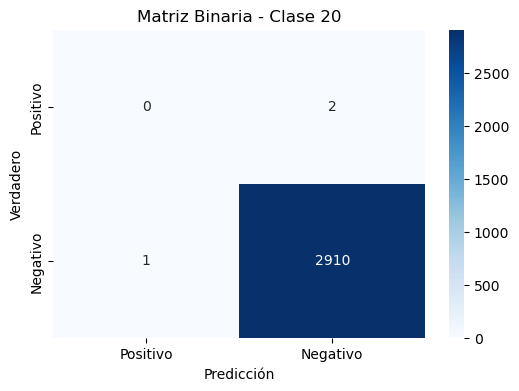

Métricas para la Clase 20:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 21:


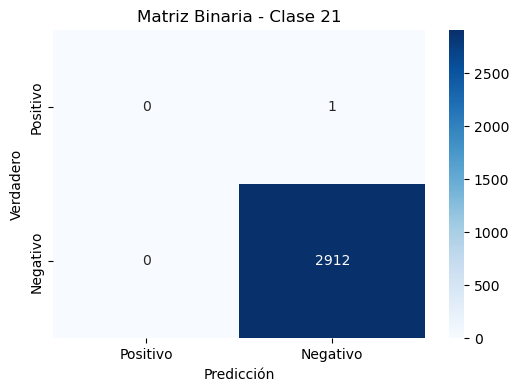

Métricas para la Clase 21:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 22:


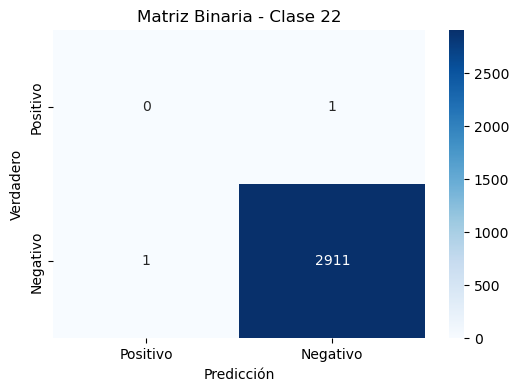

Métricas para la Clase 22:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 23:


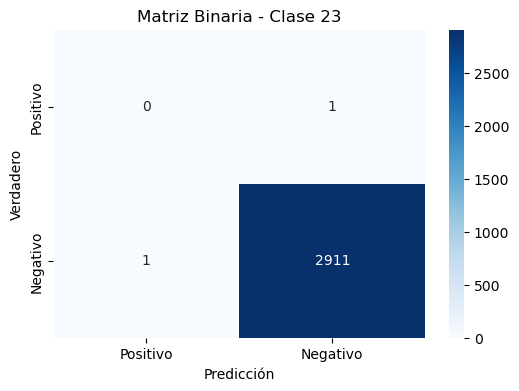

Métricas para la Clase 23:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 24:


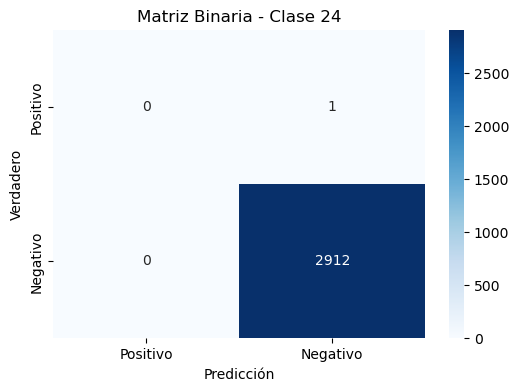

Métricas para la Clase 24:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 25:


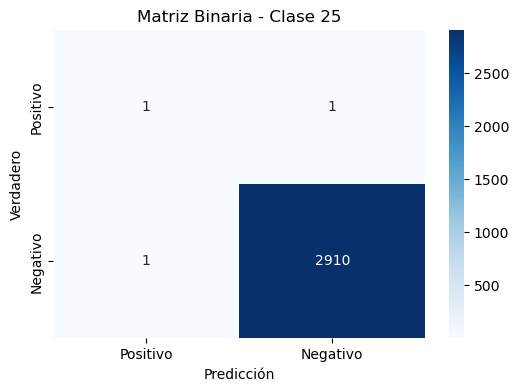

Métricas para la Clase 25:
  Precisión: 0.5000
  Recall: 0.5000
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 26:


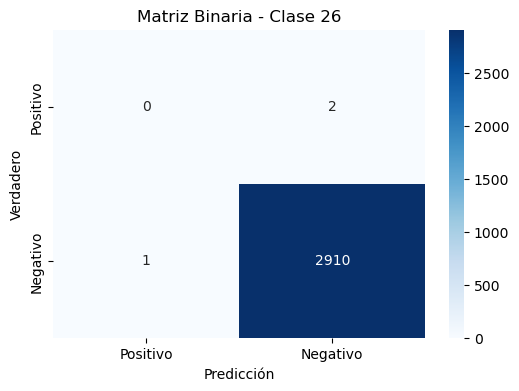

Métricas para la Clase 26:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 27:


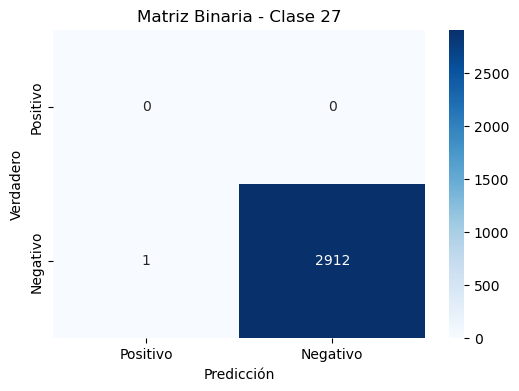

Métricas para la Clase 27:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 28:


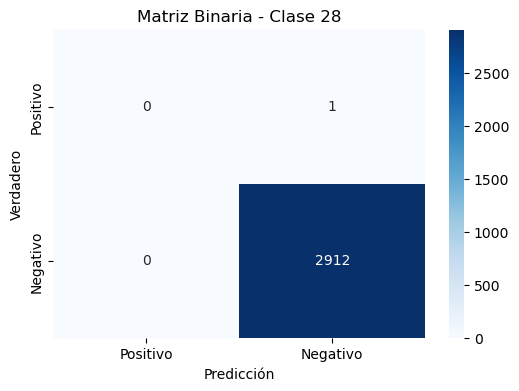

Métricas para la Clase 28:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 29:


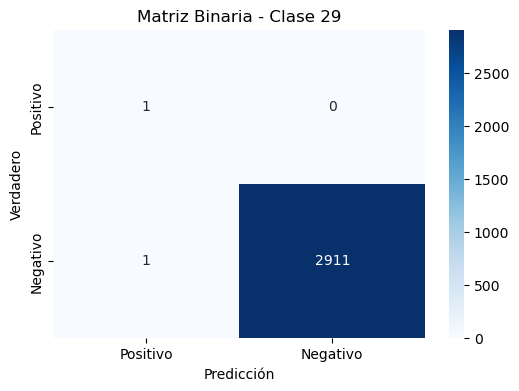

Métricas para la Clase 29:
  Precisión: 0.5000
  Recall: 1.0000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 30:


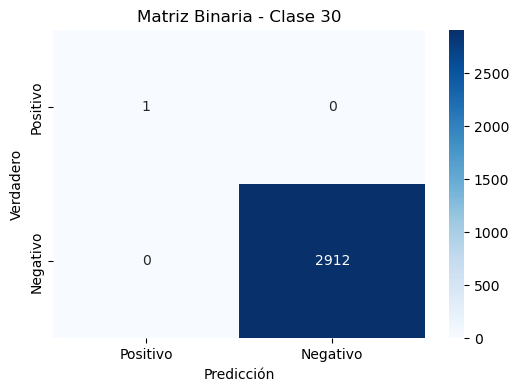

Métricas para la Clase 30:
  Precisión: 1.0000
  Recall: 1.0000
  F1-score: 1.0000
------------------------------
Matriz de Confusión Binaria para la Clase 31:


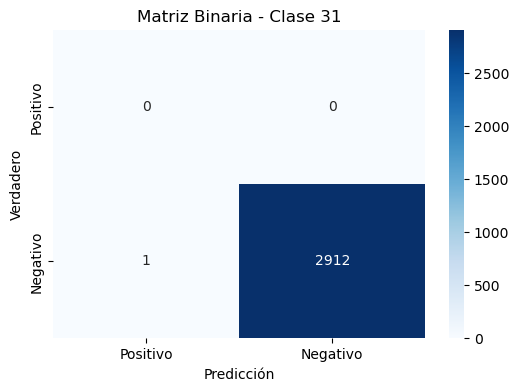

Métricas para la Clase 31:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 32:


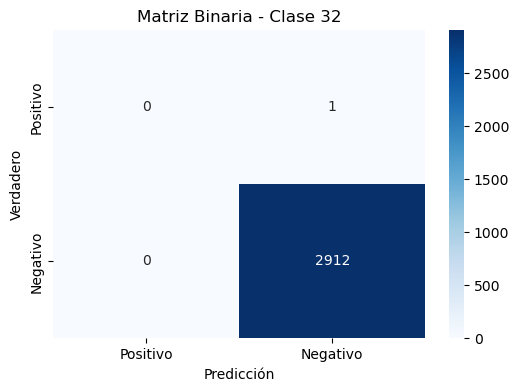

Métricas para la Clase 32:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 33:


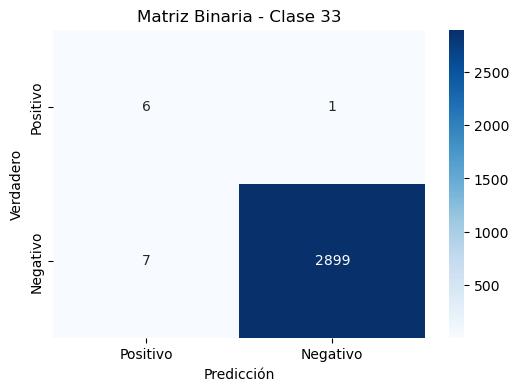

Métricas para la Clase 33:
  Precisión: 0.4615
  Recall: 0.8571
  F1-score: 0.6000
------------------------------
Matriz de Confusión Binaria para la Clase 34:


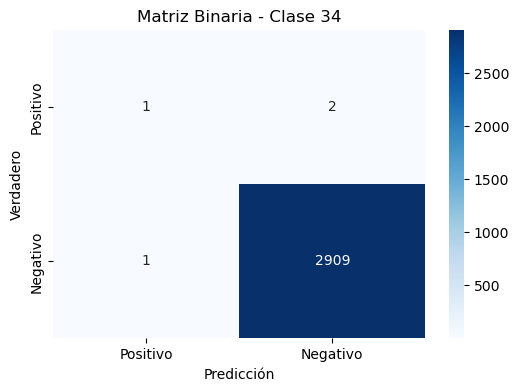

Métricas para la Clase 34:
  Precisión: 0.5000
  Recall: 0.3333
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 35:


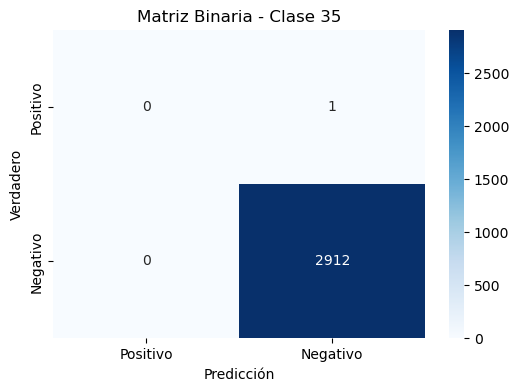

Métricas para la Clase 35:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 36:


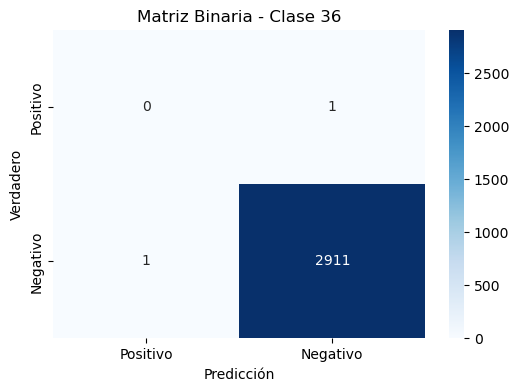

Métricas para la Clase 36:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 37:


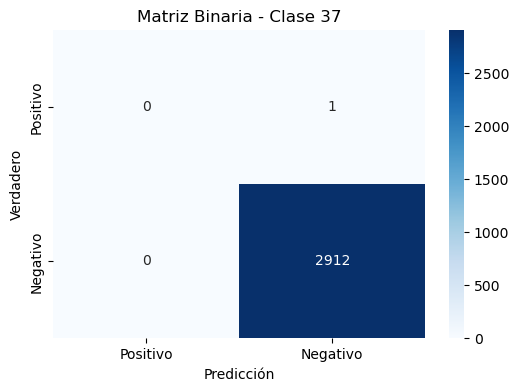

Métricas para la Clase 37:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 38:


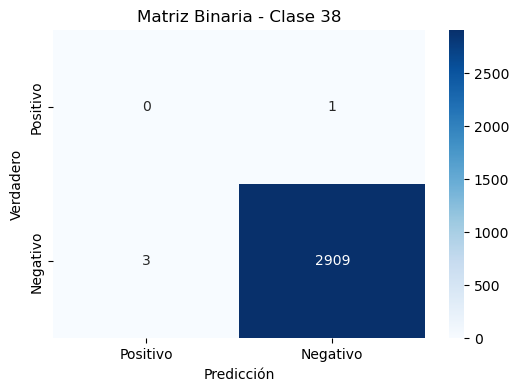

Métricas para la Clase 38:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 39:


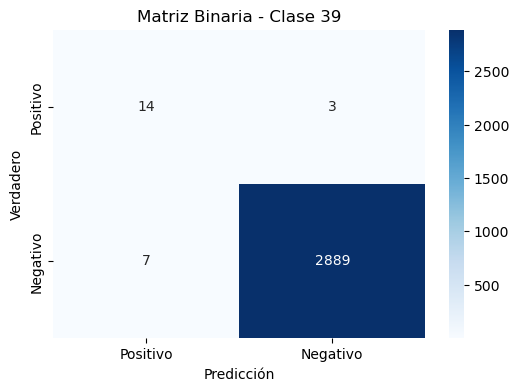

Métricas para la Clase 39:
  Precisión: 0.6667
  Recall: 0.8235
  F1-score: 0.7368
------------------------------
Matriz de Confusión Binaria para la Clase 40:


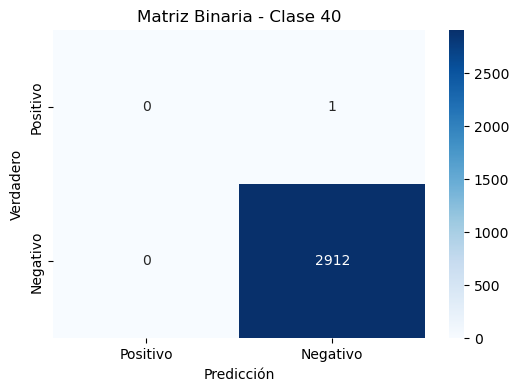

Métricas para la Clase 40:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 41:


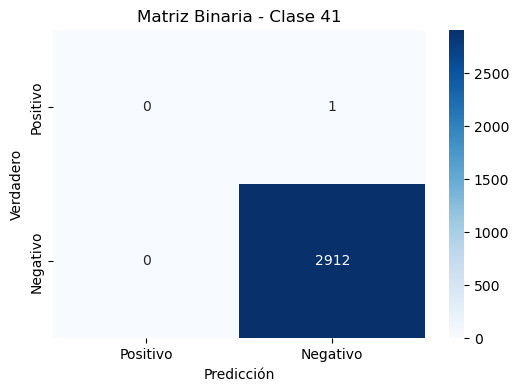

Métricas para la Clase 41:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 42:


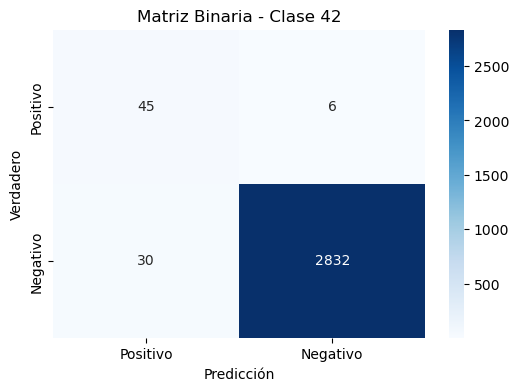

Métricas para la Clase 42:
  Precisión: 0.6000
  Recall: 0.8824
  F1-score: 0.7143
------------------------------
Matriz de Confusión Binaria para la Clase 43:


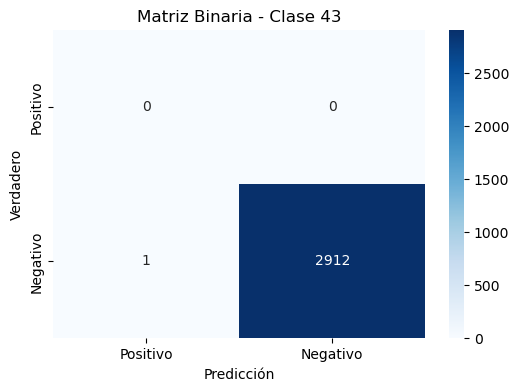

Métricas para la Clase 43:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 44:


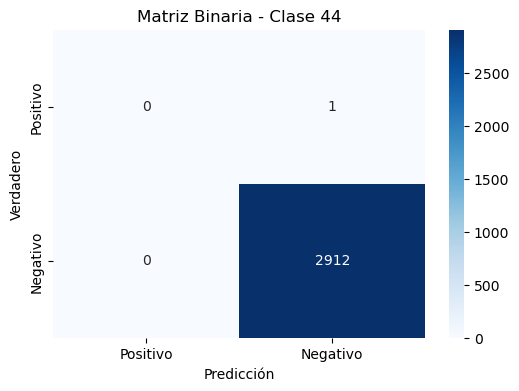

Métricas para la Clase 44:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 45:


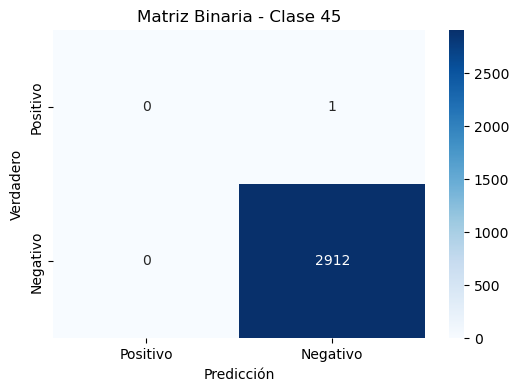

Métricas para la Clase 45:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 46:


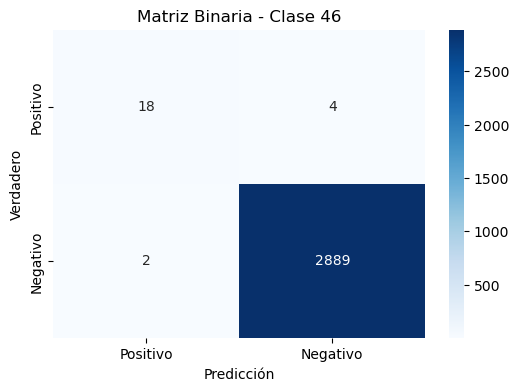

Métricas para la Clase 46:
  Precisión: 0.9000
  Recall: 0.8182
  F1-score: 0.8571
------------------------------
Matriz de Confusión Binaria para la Clase 47:


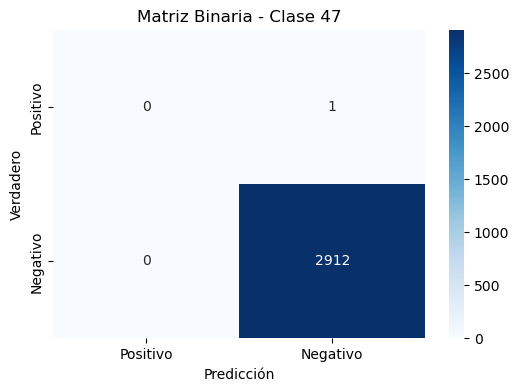

Métricas para la Clase 47:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 48:


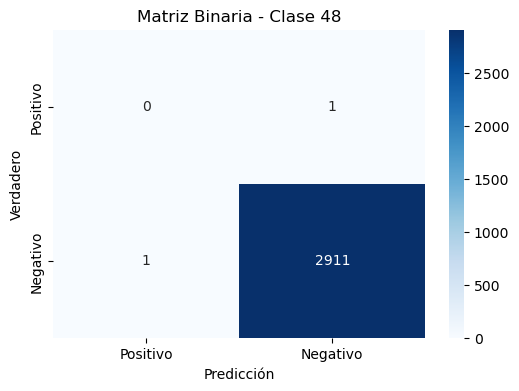

Métricas para la Clase 48:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 49:


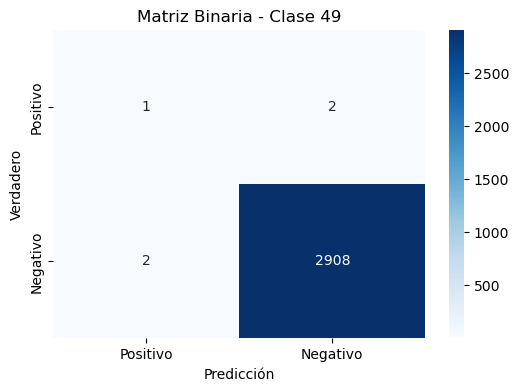

Métricas para la Clase 49:
  Precisión: 0.3333
  Recall: 0.3333
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 50:


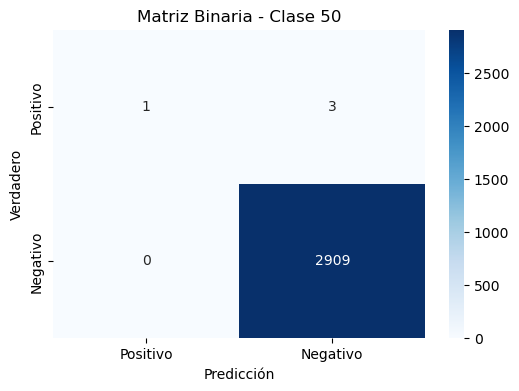

Métricas para la Clase 50:
  Precisión: 1.0000
  Recall: 0.2500
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 51:


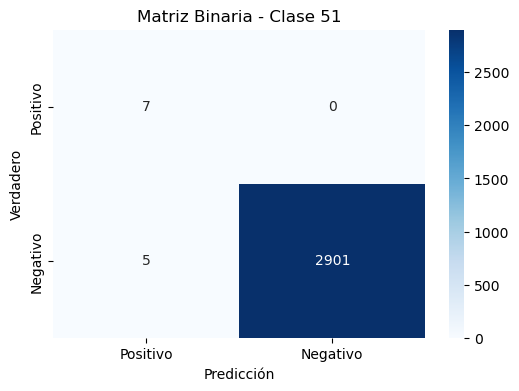

Métricas para la Clase 51:
  Precisión: 0.5833
  Recall: 1.0000
  F1-score: 0.7368
------------------------------
Matriz de Confusión Binaria para la Clase 52:


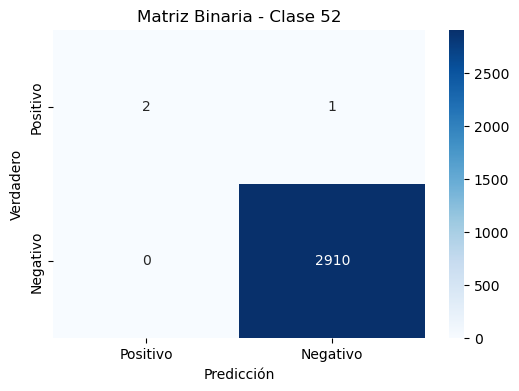

Métricas para la Clase 52:
  Precisión: 1.0000
  Recall: 0.6667
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 53:


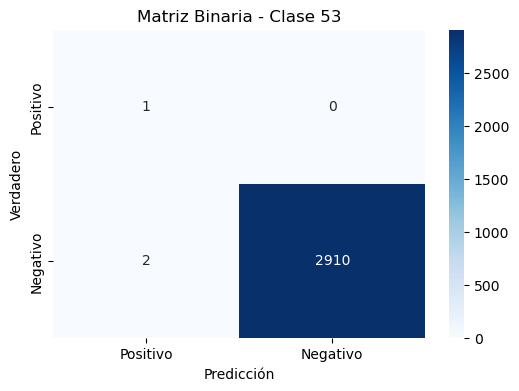

Métricas para la Clase 53:
  Precisión: 0.3333
  Recall: 1.0000
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 54:


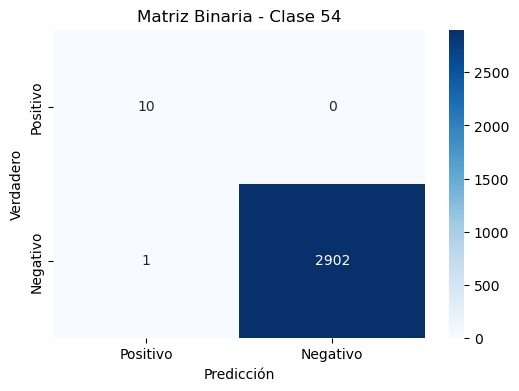

Métricas para la Clase 54:
  Precisión: 0.9091
  Recall: 1.0000
  F1-score: 0.9524
------------------------------
Matriz de Confusión Binaria para la Clase 55:


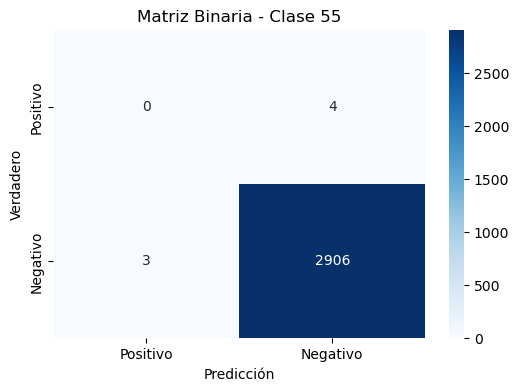

Métricas para la Clase 55:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 56:


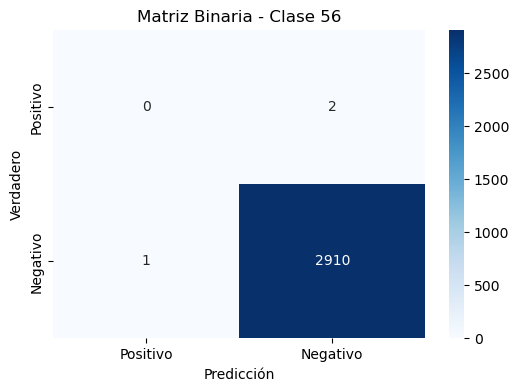

Métricas para la Clase 56:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 57:


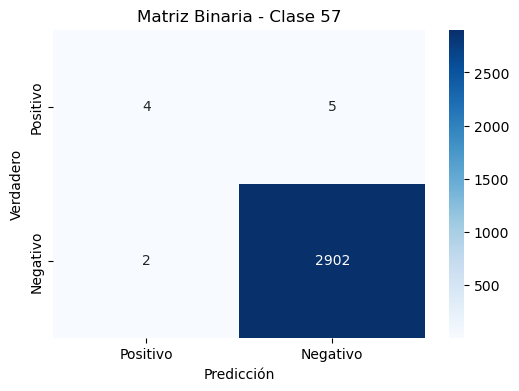

Métricas para la Clase 57:
  Precisión: 0.6667
  Recall: 0.4444
  F1-score: 0.5333
------------------------------
Matriz de Confusión Binaria para la Clase 58:


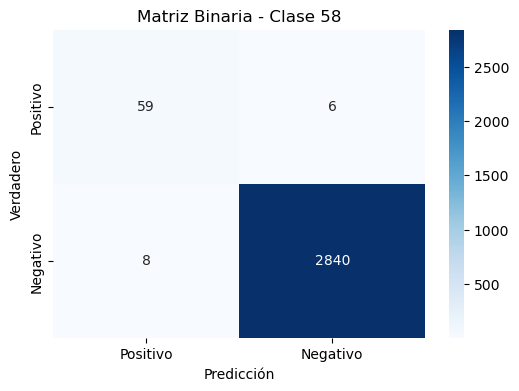

Métricas para la Clase 58:
  Precisión: 0.8806
  Recall: 0.9077
  F1-score: 0.8939
------------------------------
Matriz de Confusión Binaria para la Clase 59:


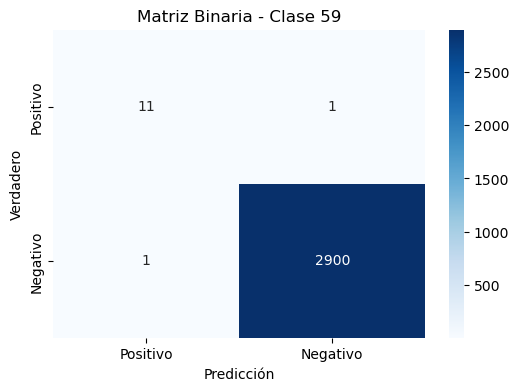

Métricas para la Clase 59:
  Precisión: 0.9167
  Recall: 0.9167
  F1-score: 0.9167
------------------------------
Matriz de Confusión Binaria para la Clase 60:


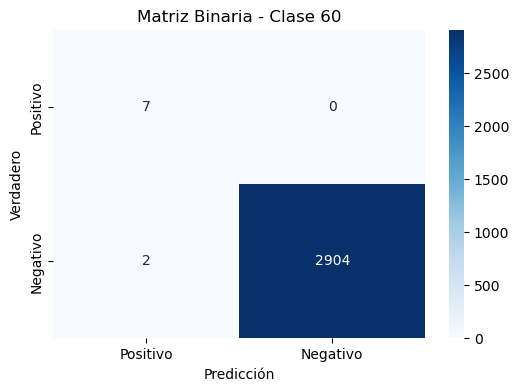

Métricas para la Clase 60:
  Precisión: 0.7778
  Recall: 1.0000
  F1-score: 0.8750
------------------------------
Matriz de Confusión Binaria para la Clase 61:


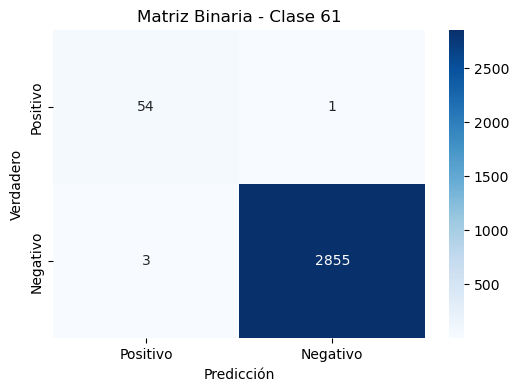

Métricas para la Clase 61:
  Precisión: 0.9474
  Recall: 0.9818
  F1-score: 0.9643
------------------------------
Matriz de Confusión Binaria para la Clase 62:


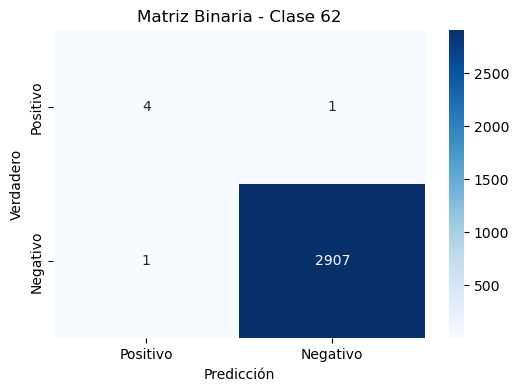

Métricas para la Clase 62:
  Precisión: 0.8000
  Recall: 0.8000
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 63:


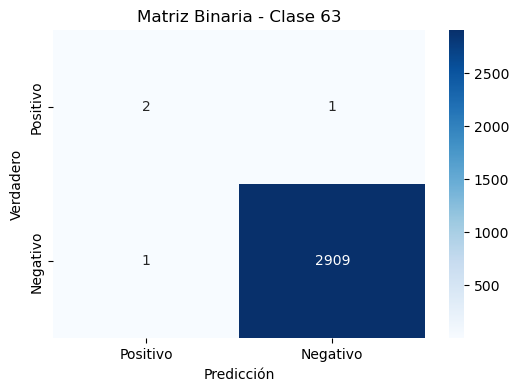

Métricas para la Clase 63:
  Precisión: 0.6667
  Recall: 0.6667
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 64:


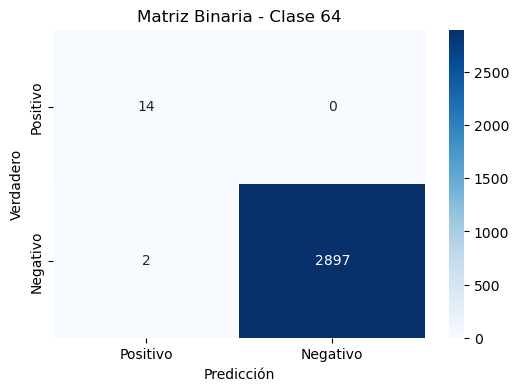

Métricas para la Clase 64:
  Precisión: 0.8750
  Recall: 1.0000
  F1-score: 0.9333
------------------------------
Matriz de Confusión Binaria para la Clase 65:


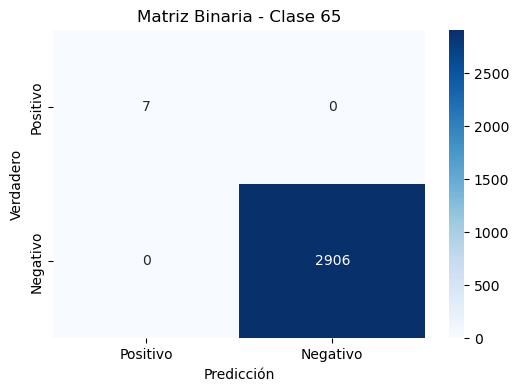

Métricas para la Clase 65:
  Precisión: 1.0000
  Recall: 1.0000
  F1-score: 1.0000
------------------------------
Matriz de Confusión Binaria para la Clase 66:


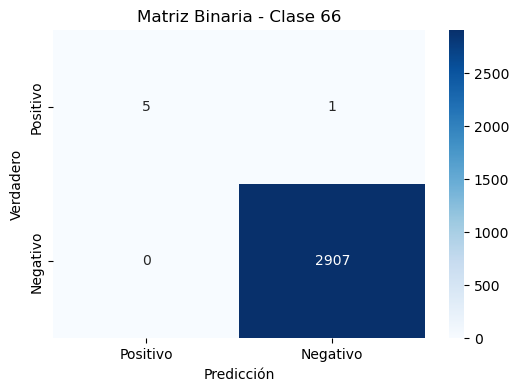

Métricas para la Clase 66:
  Precisión: 1.0000
  Recall: 0.8333
  F1-score: 0.9091
------------------------------
Matriz de Confusión Binaria para la Clase 67:


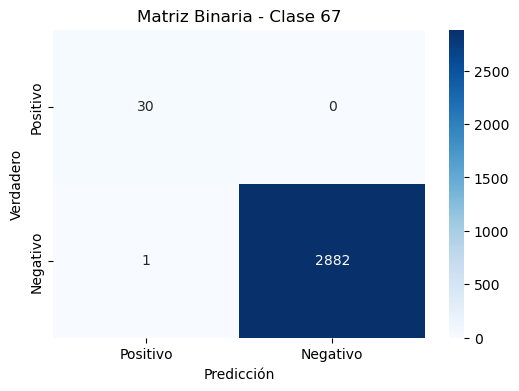

Métricas para la Clase 67:
  Precisión: 0.9677
  Recall: 1.0000
  F1-score: 0.9836
------------------------------
Matriz de Confusión Binaria para la Clase 68:


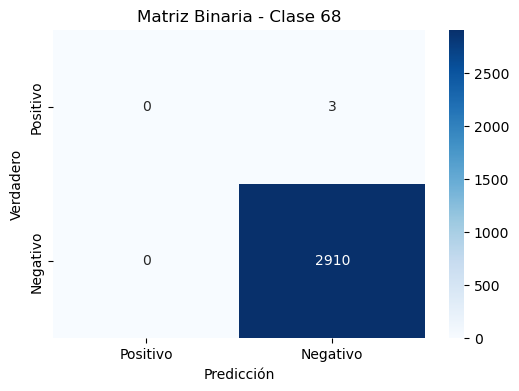

Métricas para la Clase 68:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 69:


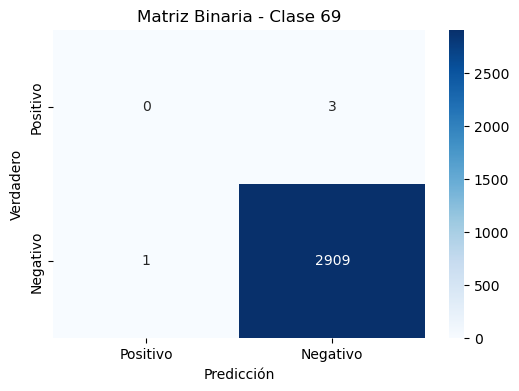

Métricas para la Clase 69:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 70:


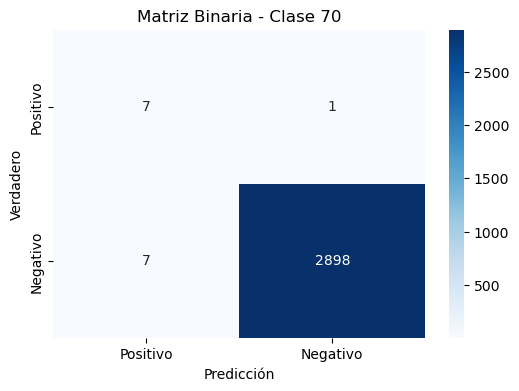

Métricas para la Clase 70:
  Precisión: 0.5000
  Recall: 0.8750
  F1-score: 0.6364
------------------------------
Matriz de Confusión Binaria para la Clase 71:


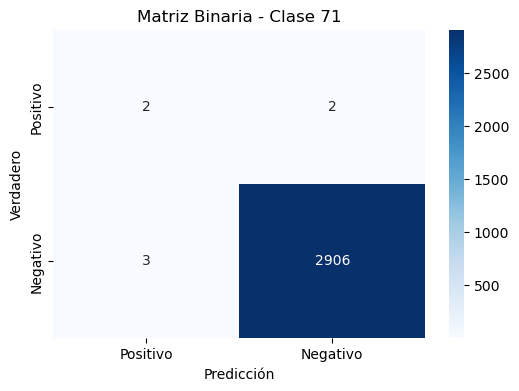

Métricas para la Clase 71:
  Precisión: 0.4000
  Recall: 0.5000
  F1-score: 0.4444
------------------------------
Matriz de Confusión Binaria para la Clase 72:


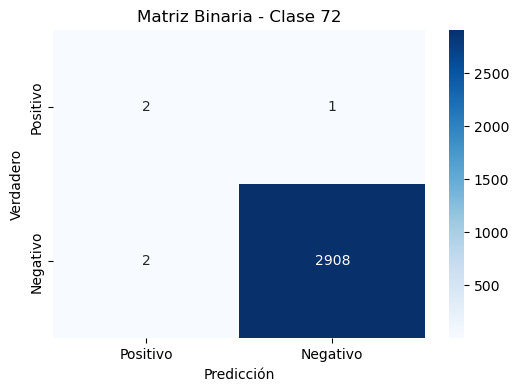

Métricas para la Clase 72:
  Precisión: 0.5000
  Recall: 0.6667
  F1-score: 0.5714
------------------------------
Matriz de Confusión Binaria para la Clase 73:


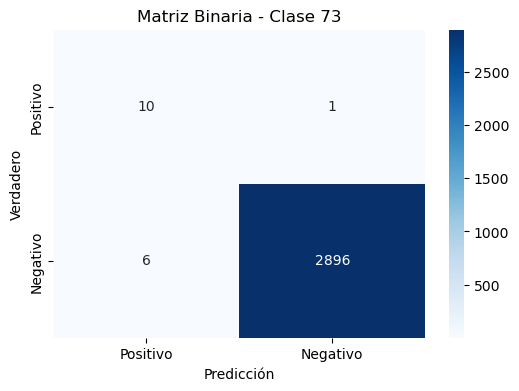

Métricas para la Clase 73:
  Precisión: 0.6250
  Recall: 0.9091
  F1-score: 0.7407
------------------------------
Matriz de Confusión Binaria para la Clase 74:


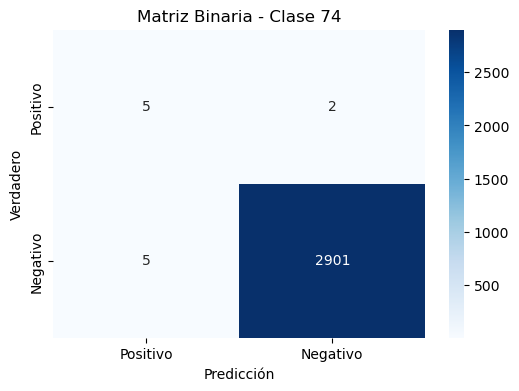

Métricas para la Clase 74:
  Precisión: 0.5000
  Recall: 0.7143
  F1-score: 0.5882
------------------------------
Matriz de Confusión Binaria para la Clase 75:


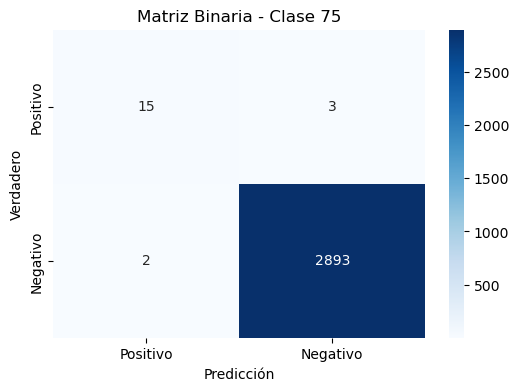

Métricas para la Clase 75:
  Precisión: 0.8824
  Recall: 0.8333
  F1-score: 0.8571
------------------------------
Matriz de Confusión Binaria para la Clase 76:


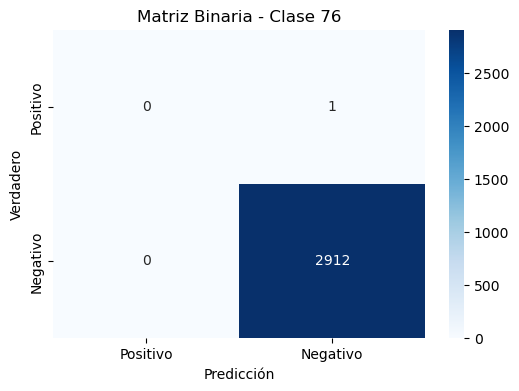

Métricas para la Clase 76:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 77:


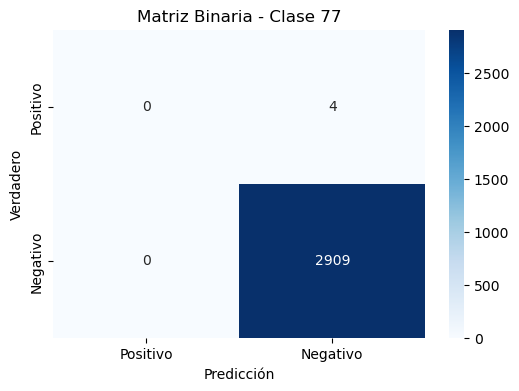

Métricas para la Clase 77:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 78:


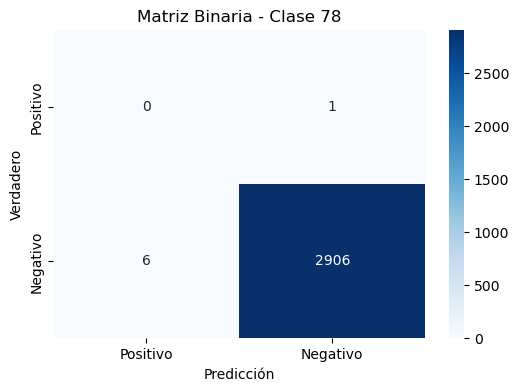

Métricas para la Clase 78:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 79:


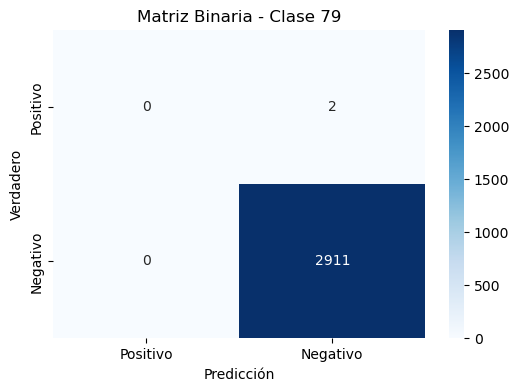

Métricas para la Clase 79:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 80:


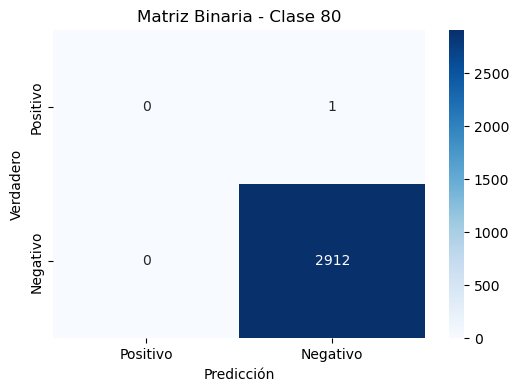

Métricas para la Clase 80:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 81:


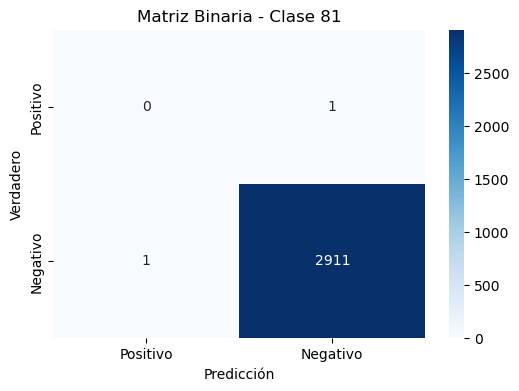

Métricas para la Clase 81:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 82:


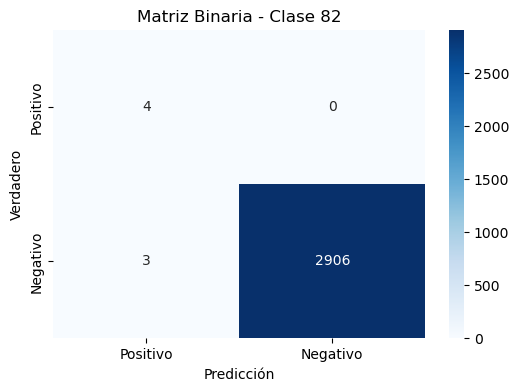

Métricas para la Clase 82:
  Precisión: 0.5714
  Recall: 1.0000
  F1-score: 0.7273
------------------------------
Matriz de Confusión Binaria para la Clase 83:


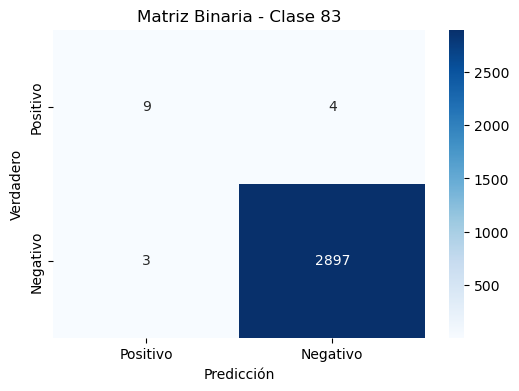

Métricas para la Clase 83:
  Precisión: 0.7500
  Recall: 0.6923
  F1-score: 0.7200
------------------------------
Matriz de Confusión Binaria para la Clase 84:


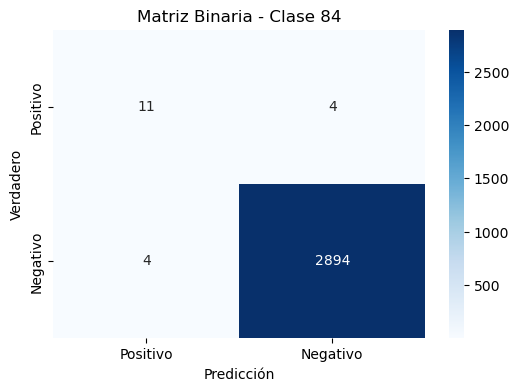

Métricas para la Clase 84:
  Precisión: 0.7333
  Recall: 0.7333
  F1-score: 0.7333
------------------------------
Matriz de Confusión Binaria para la Clase 85:


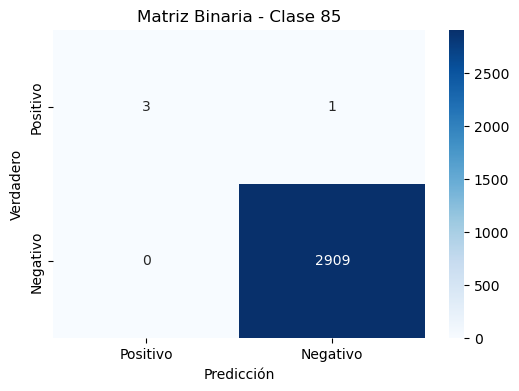

Métricas para la Clase 85:
  Precisión: 1.0000
  Recall: 0.7500
  F1-score: 0.8571
------------------------------
Matriz de Confusión Binaria para la Clase 86:


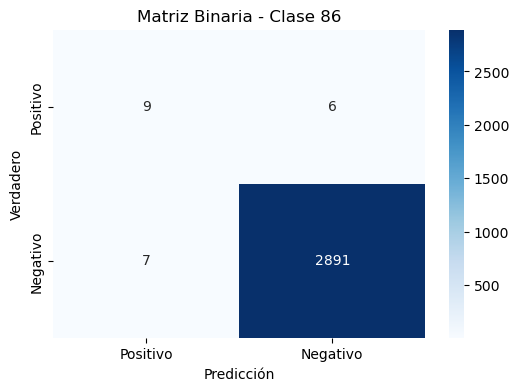

Métricas para la Clase 86:
  Precisión: 0.5625
  Recall: 0.6000
  F1-score: 0.5806
------------------------------
Matriz de Confusión Binaria para la Clase 87:


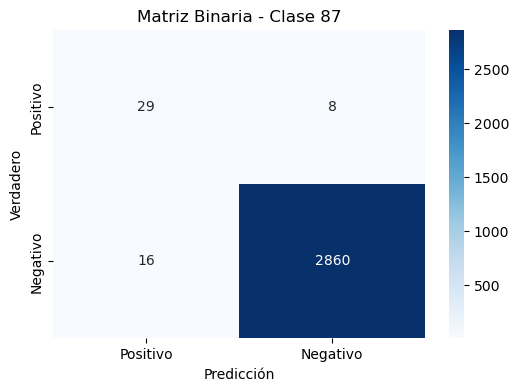

Métricas para la Clase 87:
  Precisión: 0.6444
  Recall: 0.7838
  F1-score: 0.7073
------------------------------
Matriz de Confusión Binaria para la Clase 88:


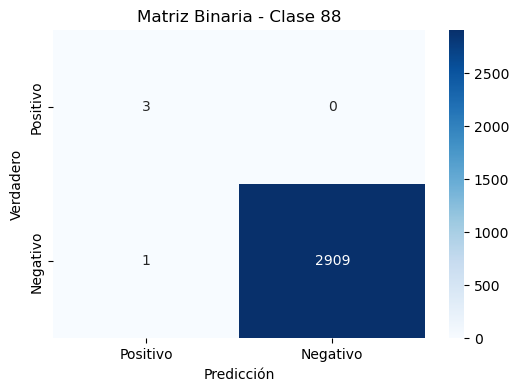

Métricas para la Clase 88:
  Precisión: 0.7500
  Recall: 1.0000
  F1-score: 0.8571
------------------------------
Matriz de Confusión Binaria para la Clase 89:


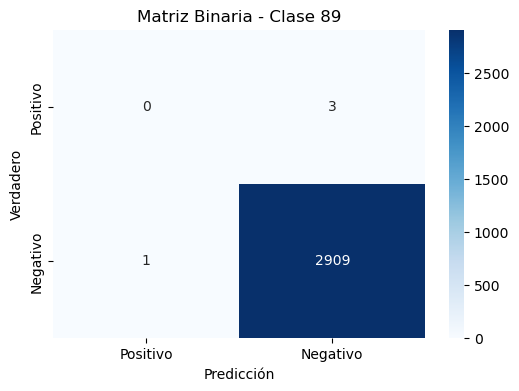

Métricas para la Clase 89:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 90:


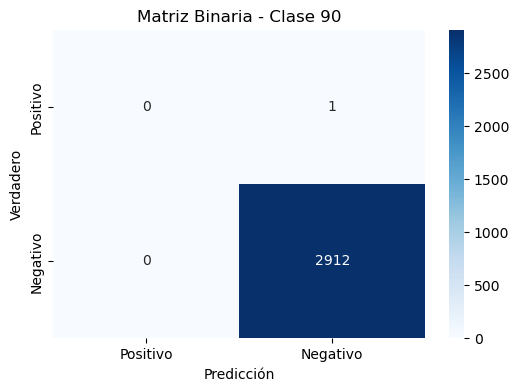

Métricas para la Clase 90:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 91:


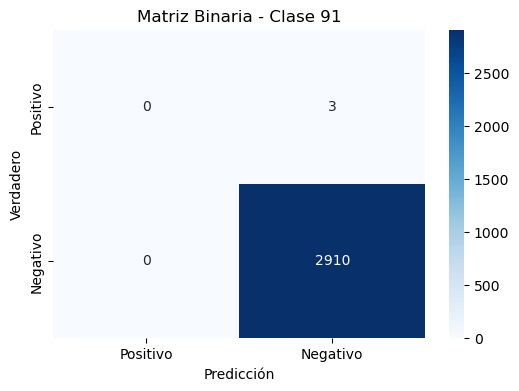

Métricas para la Clase 91:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 92:


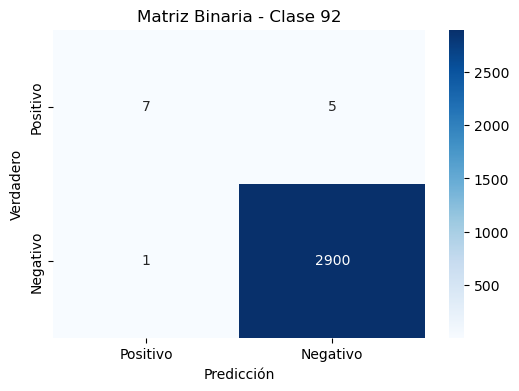

Métricas para la Clase 92:
  Precisión: 0.8750
  Recall: 0.5833
  F1-score: 0.7000
------------------------------
Matriz de Confusión Binaria para la Clase 93:


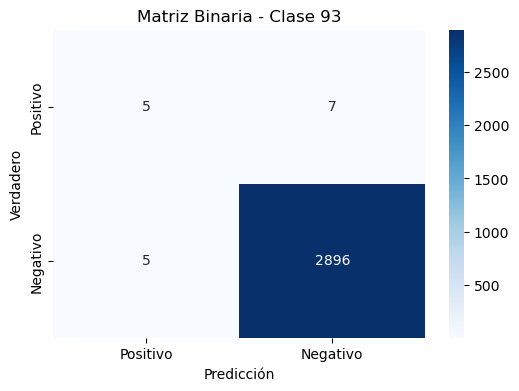

Métricas para la Clase 93:
  Precisión: 0.5000
  Recall: 0.4167
  F1-score: 0.4545
------------------------------
Matriz de Confusión Binaria para la Clase 94:


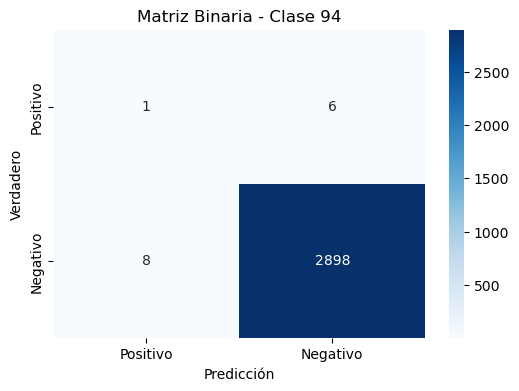

Métricas para la Clase 94:
  Precisión: 0.1111
  Recall: 0.1429
  F1-score: 0.1250
------------------------------
Matriz de Confusión Binaria para la Clase 95:


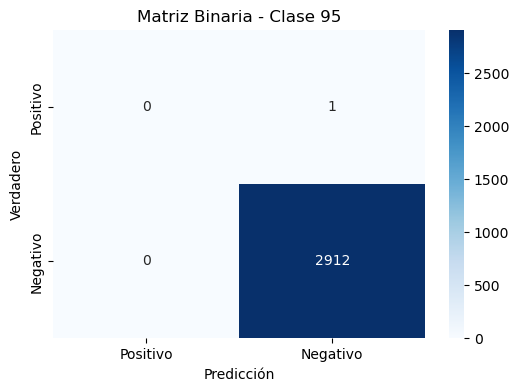

Métricas para la Clase 95:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 96:


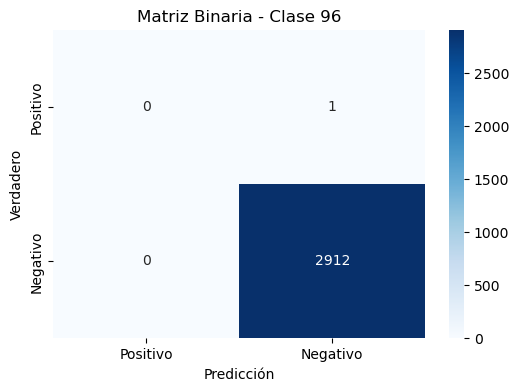

Métricas para la Clase 96:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 97:


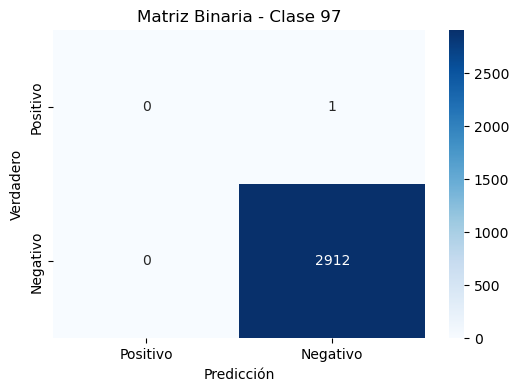

Métricas para la Clase 97:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 98:


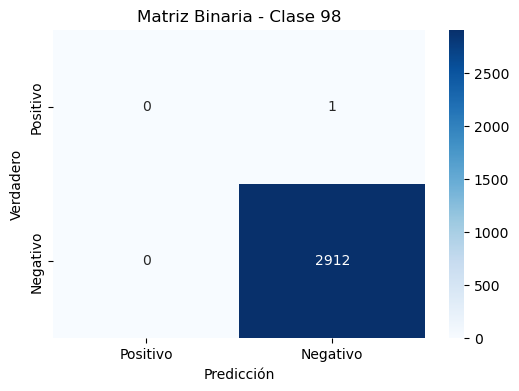

Métricas para la Clase 98:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 99:


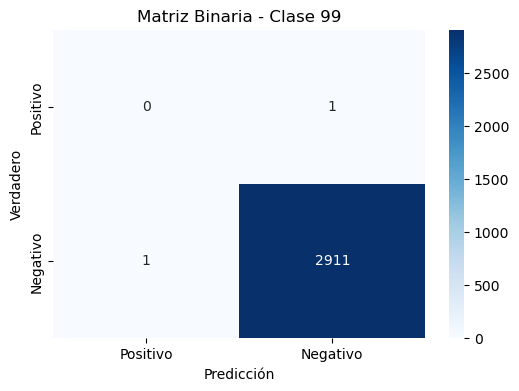

Métricas para la Clase 99:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 100:


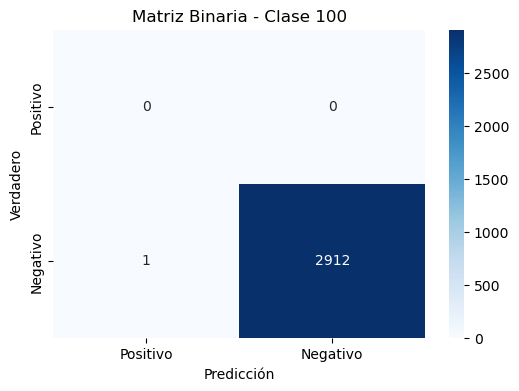

Métricas para la Clase 100:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 101:


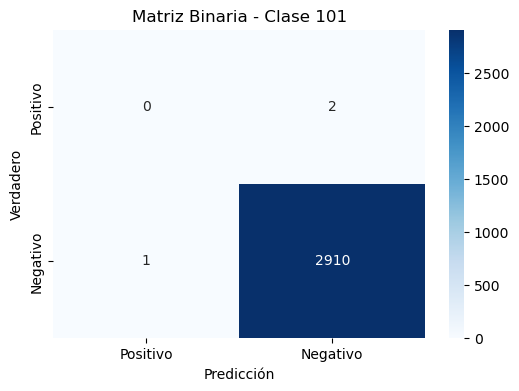

Métricas para la Clase 101:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 102:


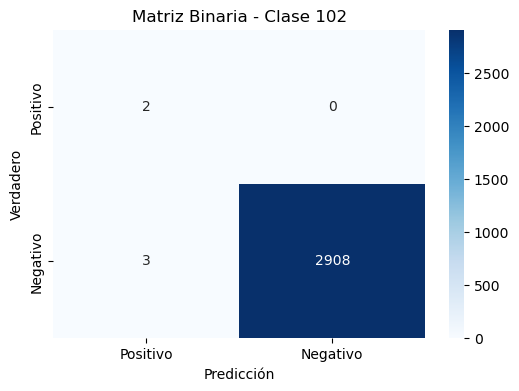

Métricas para la Clase 102:
  Precisión: 0.4000
  Recall: 1.0000
  F1-score: 0.5714
------------------------------
Matriz de Confusión Binaria para la Clase 103:


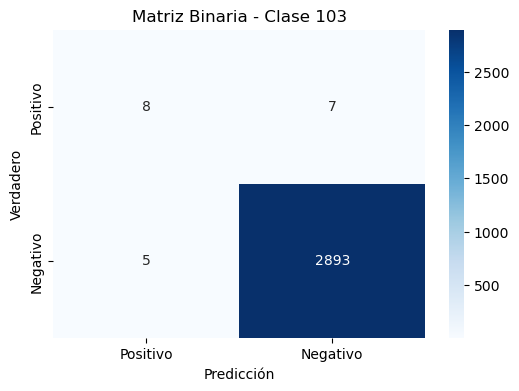

Métricas para la Clase 103:
  Precisión: 0.6154
  Recall: 0.5333
  F1-score: 0.5714
------------------------------
Matriz de Confusión Binaria para la Clase 104:


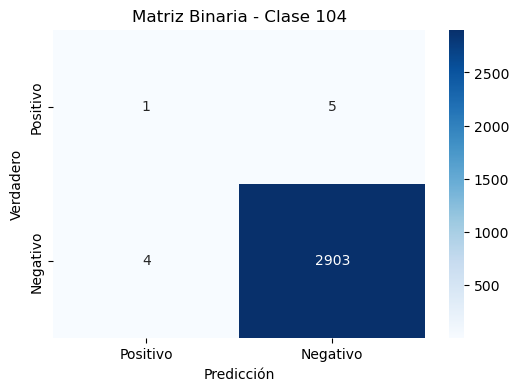

Métricas para la Clase 104:
  Precisión: 0.2000
  Recall: 0.1667
  F1-score: 0.1818
------------------------------
Matriz de Confusión Binaria para la Clase 105:


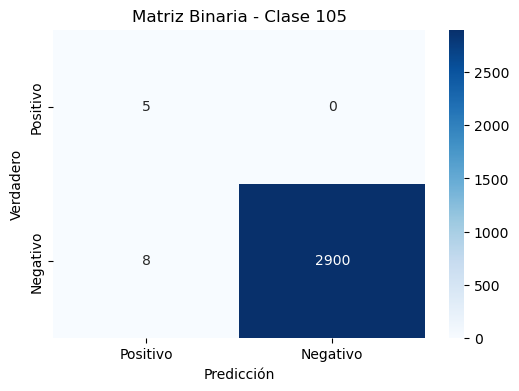

Métricas para la Clase 105:
  Precisión: 0.3846
  Recall: 1.0000
  F1-score: 0.5556
------------------------------
Matriz de Confusión Binaria para la Clase 106:


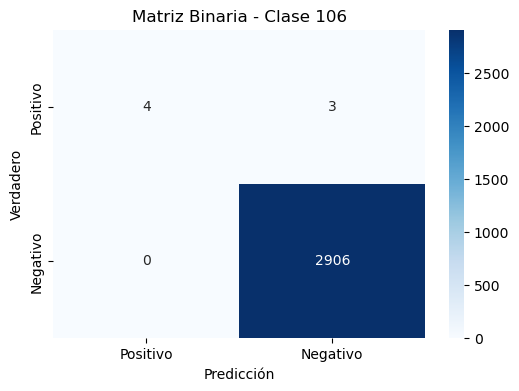

Métricas para la Clase 106:
  Precisión: 1.0000
  Recall: 0.5714
  F1-score: 0.7273
------------------------------
Matriz de Confusión Binaria para la Clase 107:


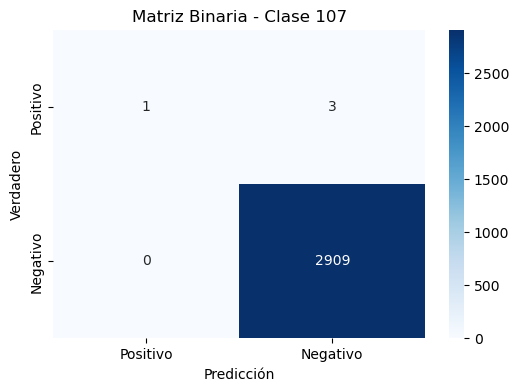

Métricas para la Clase 107:
  Precisión: 1.0000
  Recall: 0.2500
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 108:


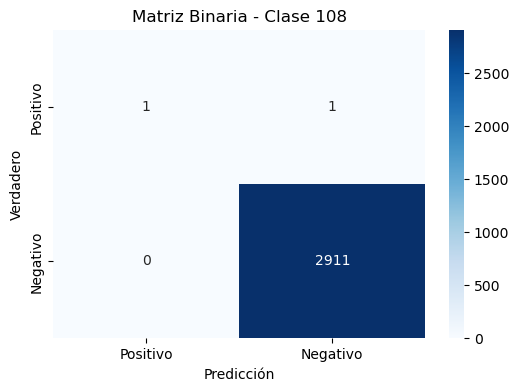

Métricas para la Clase 108:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 109:


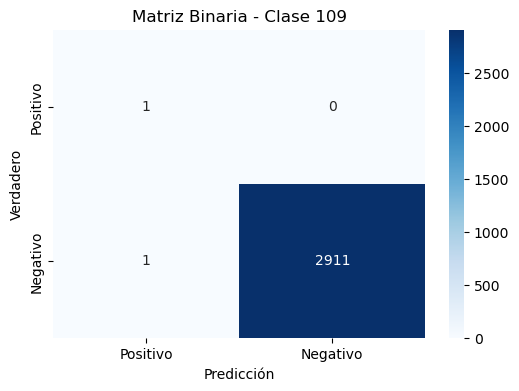

Métricas para la Clase 109:
  Precisión: 0.5000
  Recall: 1.0000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 110:


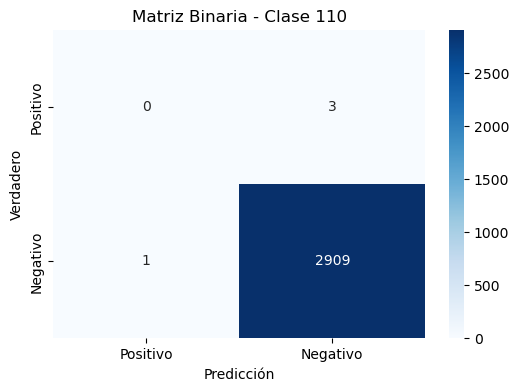

Métricas para la Clase 110:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 111:


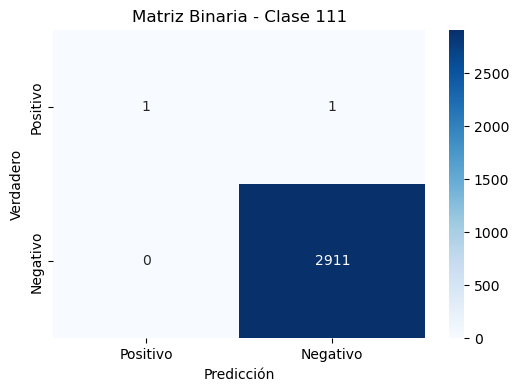

Métricas para la Clase 111:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 112:


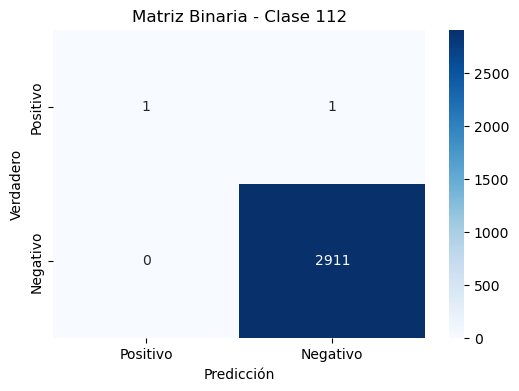

Métricas para la Clase 112:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 113:


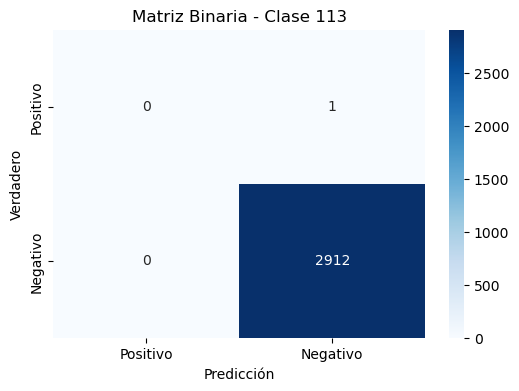

Métricas para la Clase 113:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 114:


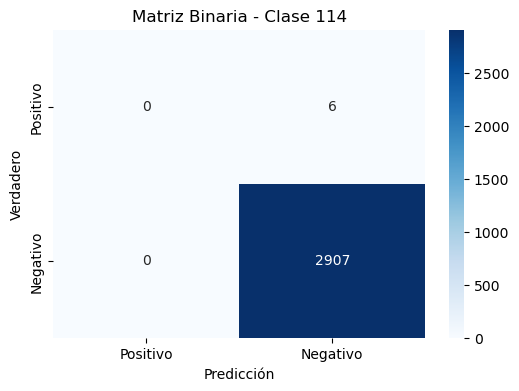

Métricas para la Clase 114:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 115:


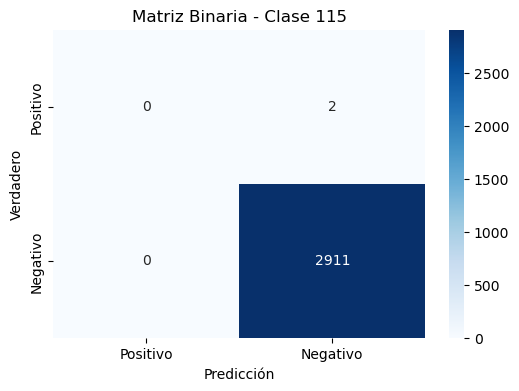

Métricas para la Clase 115:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 116:


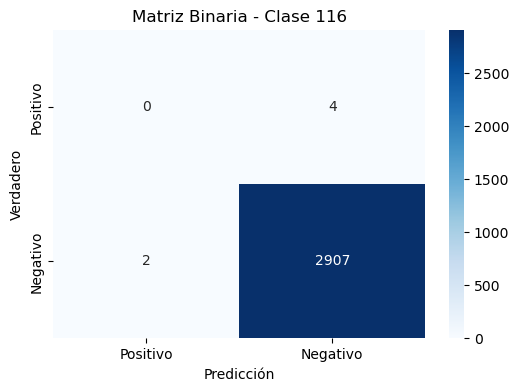

Métricas para la Clase 116:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 117:


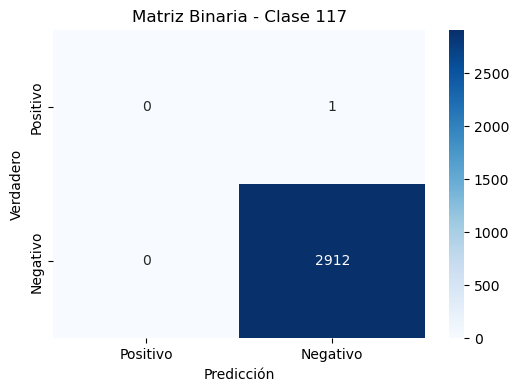

Métricas para la Clase 117:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 118:


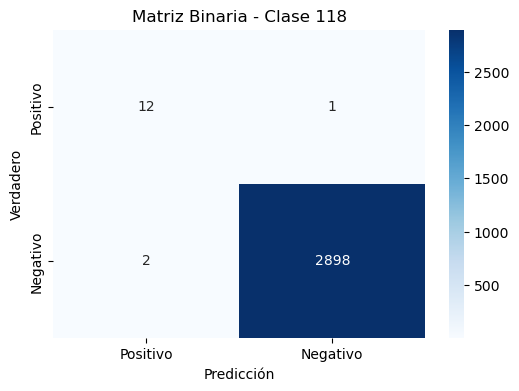

Métricas para la Clase 118:
  Precisión: 0.8571
  Recall: 0.9231
  F1-score: 0.8889
------------------------------
Matriz de Confusión Binaria para la Clase 119:


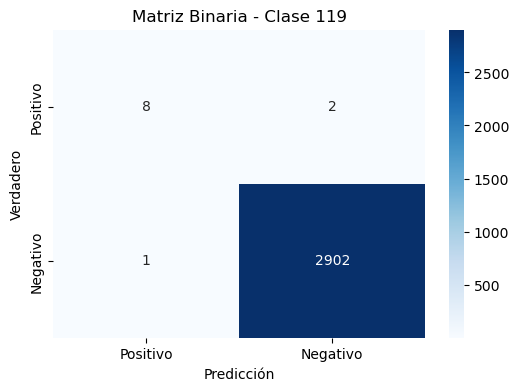

Métricas para la Clase 119:
  Precisión: 0.8889
  Recall: 0.8000
  F1-score: 0.8421
------------------------------
Matriz de Confusión Binaria para la Clase 120:


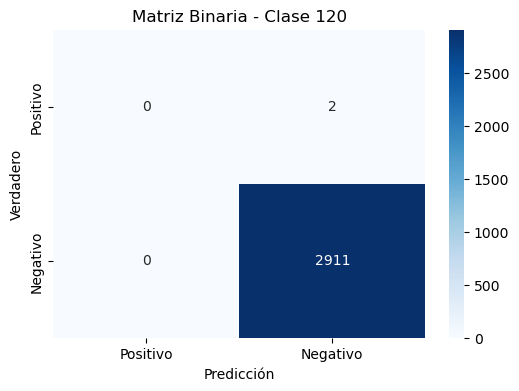

Métricas para la Clase 120:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 121:


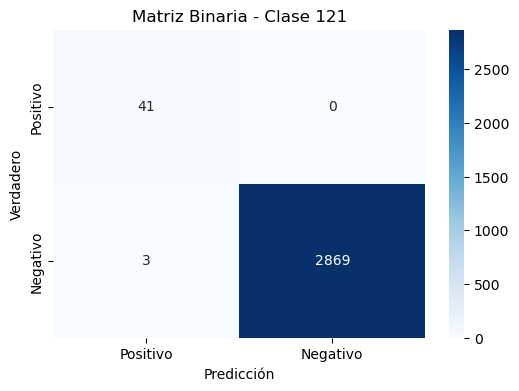

Métricas para la Clase 121:
  Precisión: 0.9318
  Recall: 1.0000
  F1-score: 0.9647
------------------------------
Matriz de Confusión Binaria para la Clase 122:


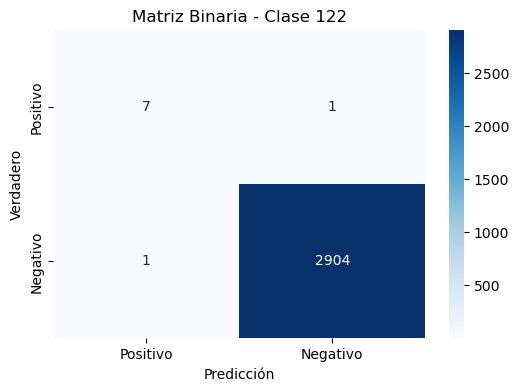

Métricas para la Clase 122:
  Precisión: 0.8750
  Recall: 0.8750
  F1-score: 0.8750
------------------------------
Matriz de Confusión Binaria para la Clase 123:


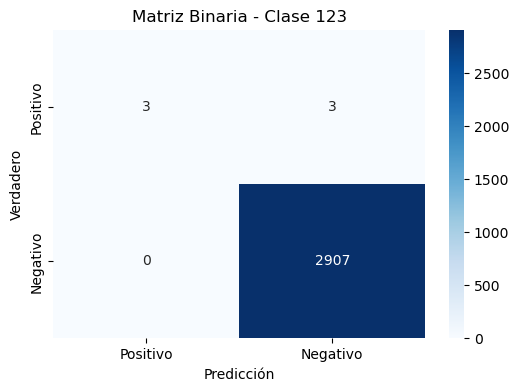

Métricas para la Clase 123:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 124:


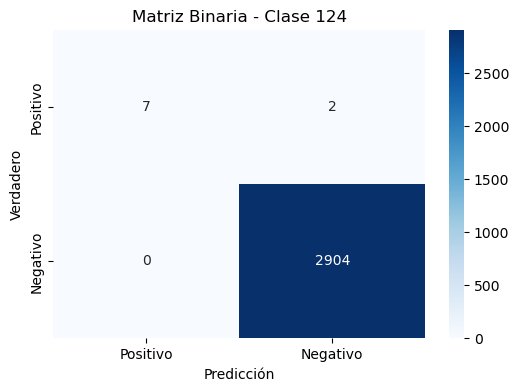

Métricas para la Clase 124:
  Precisión: 1.0000
  Recall: 0.7778
  F1-score: 0.8750
------------------------------
Matriz de Confusión Binaria para la Clase 125:


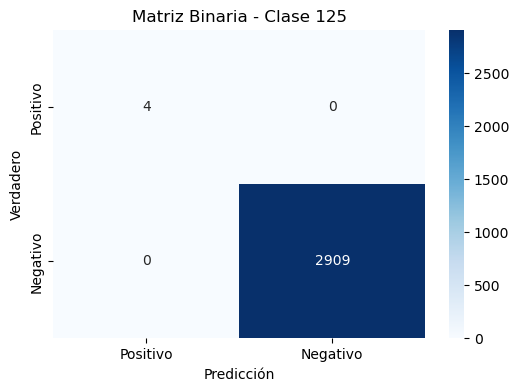

Métricas para la Clase 125:
  Precisión: 1.0000
  Recall: 1.0000
  F1-score: 1.0000
------------------------------
Matriz de Confusión Binaria para la Clase 126:


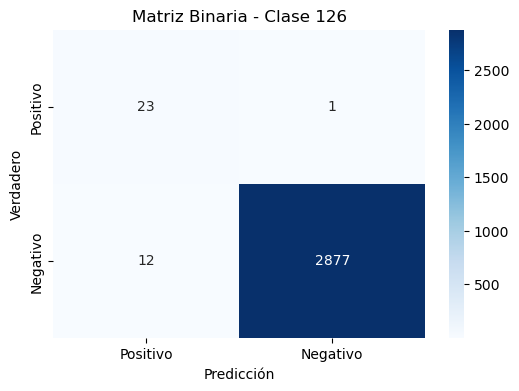

Métricas para la Clase 126:
  Precisión: 0.6571
  Recall: 0.9583
  F1-score: 0.7797
------------------------------
Matriz de Confusión Binaria para la Clase 127:


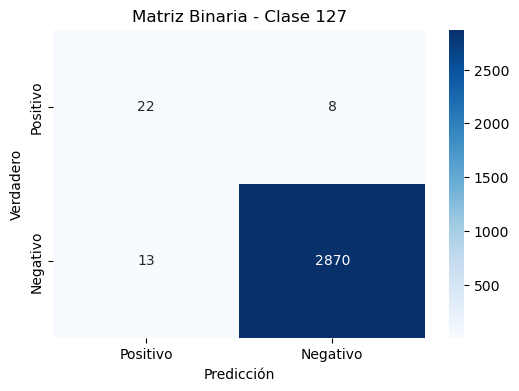

Métricas para la Clase 127:
  Precisión: 0.6286
  Recall: 0.7333
  F1-score: 0.6769
------------------------------
Matriz de Confusión Binaria para la Clase 128:


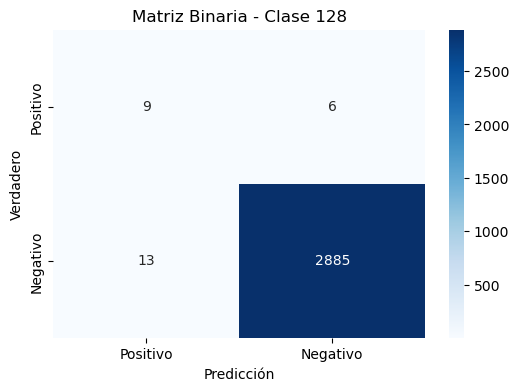

Métricas para la Clase 128:
  Precisión: 0.4091
  Recall: 0.6000
  F1-score: 0.4865
------------------------------
Matriz de Confusión Binaria para la Clase 129:


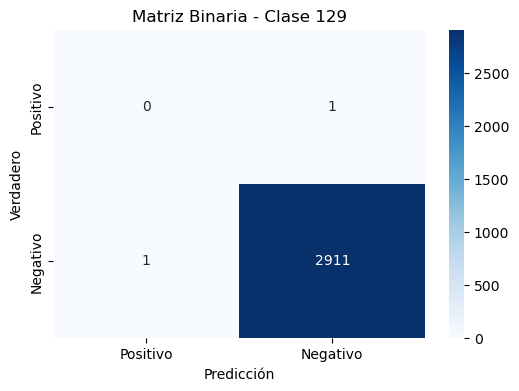

Métricas para la Clase 129:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 130:


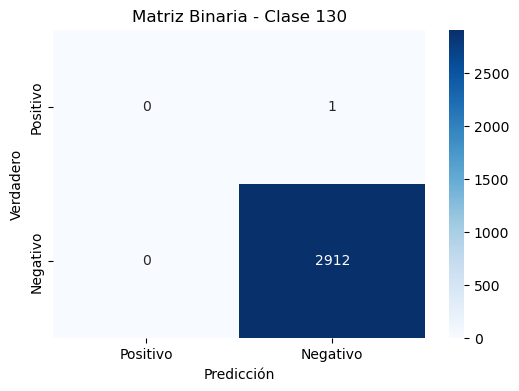

Métricas para la Clase 130:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 131:


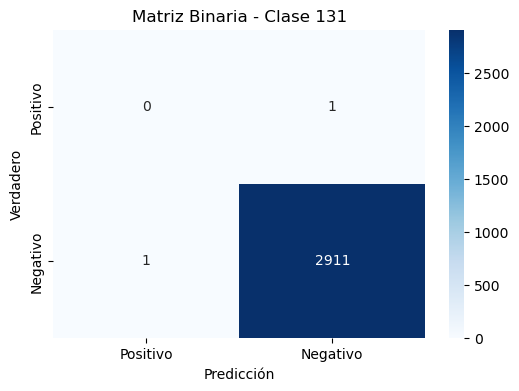

Métricas para la Clase 131:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 132:


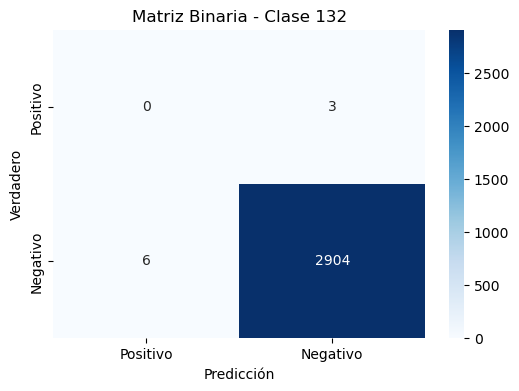

Métricas para la Clase 132:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 133:


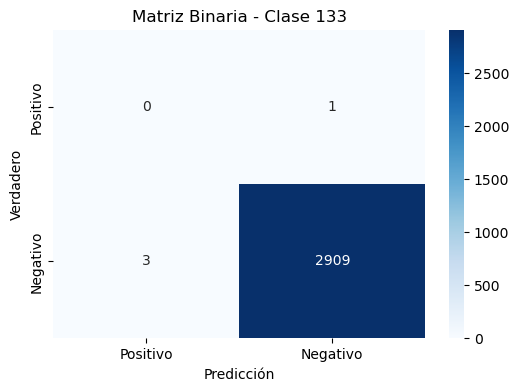

Métricas para la Clase 133:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 134:


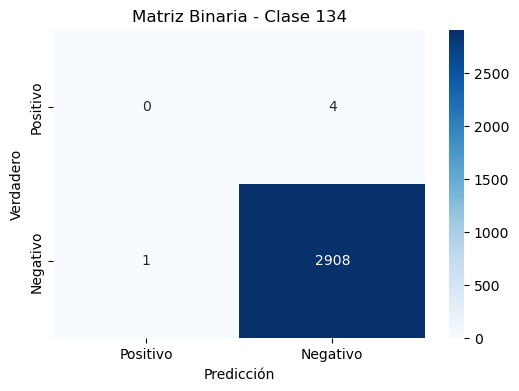

Métricas para la Clase 134:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 135:


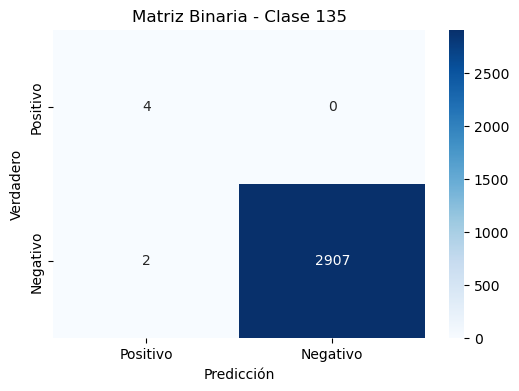

Métricas para la Clase 135:
  Precisión: 0.6667
  Recall: 1.0000
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 136:


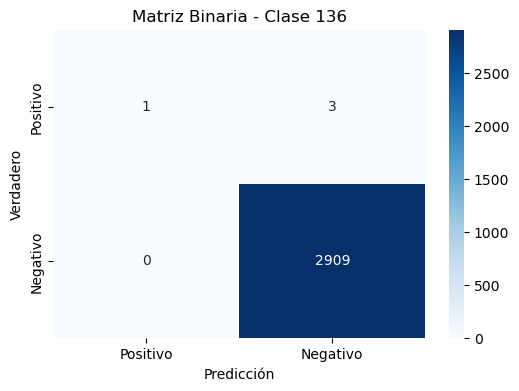

Métricas para la Clase 136:
  Precisión: 1.0000
  Recall: 0.2500
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 137:


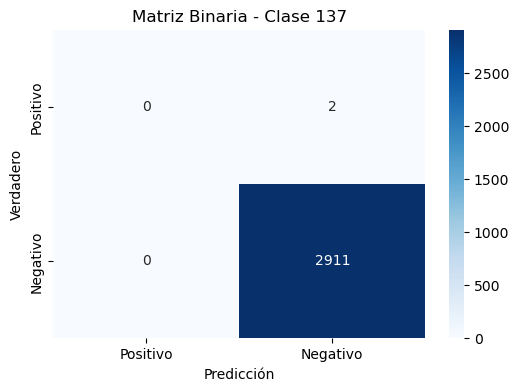

Métricas para la Clase 137:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 138:


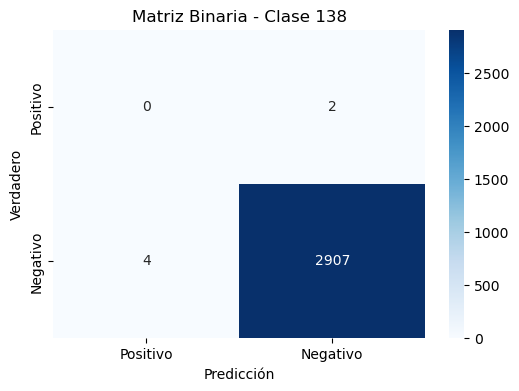

Métricas para la Clase 138:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 139:


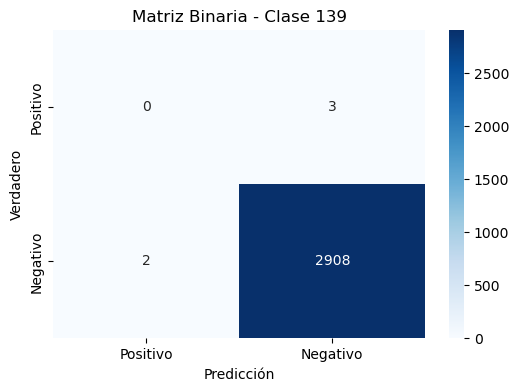

Métricas para la Clase 139:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 140:


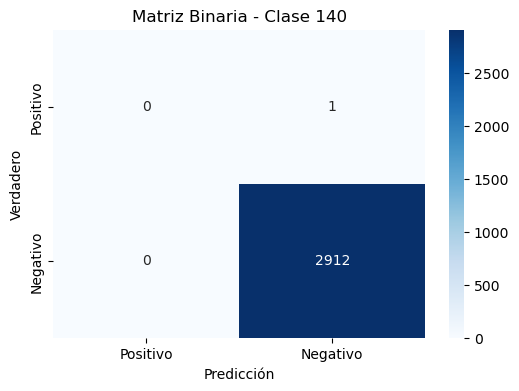

Métricas para la Clase 140:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 141:


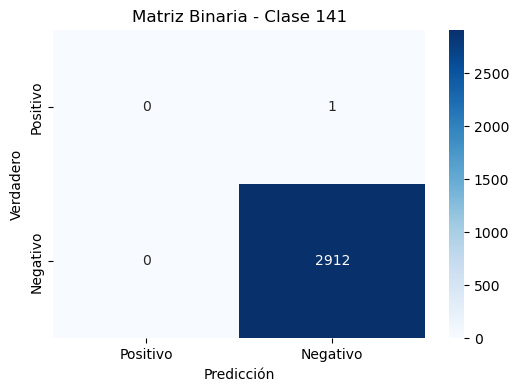

Métricas para la Clase 141:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 142:


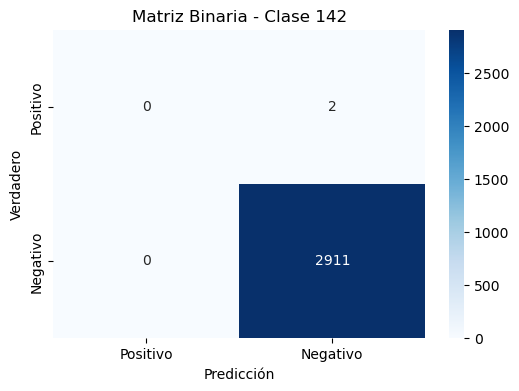

Métricas para la Clase 142:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 143:


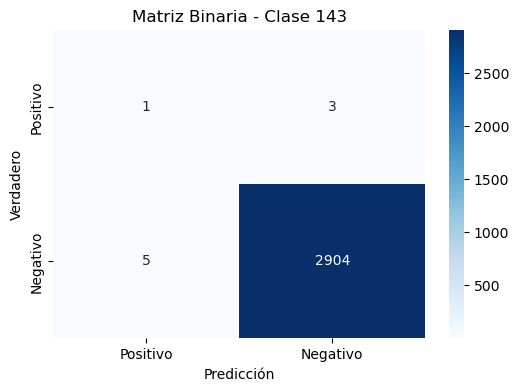

Métricas para la Clase 143:
  Precisión: 0.1667
  Recall: 0.2500
  F1-score: 0.2000
------------------------------
Matriz de Confusión Binaria para la Clase 144:


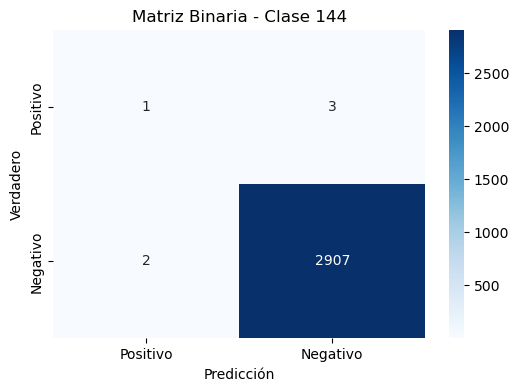

Métricas para la Clase 144:
  Precisión: 0.3333
  Recall: 0.2500
  F1-score: 0.2857
------------------------------
Matriz de Confusión Binaria para la Clase 145:


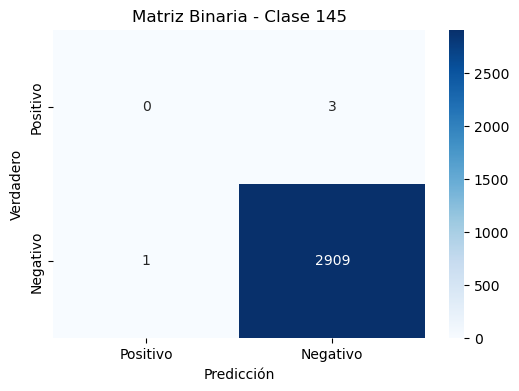

Métricas para la Clase 145:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 146:


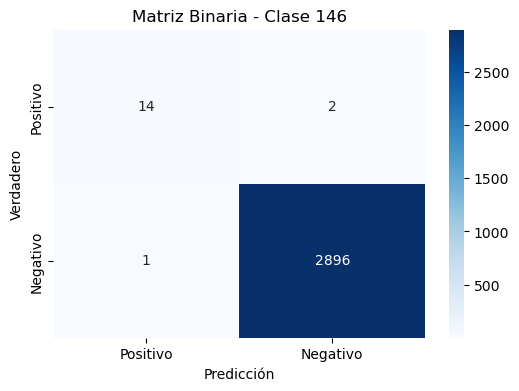

Métricas para la Clase 146:
  Precisión: 0.9333
  Recall: 0.8750
  F1-score: 0.9032
------------------------------
Matriz de Confusión Binaria para la Clase 147:


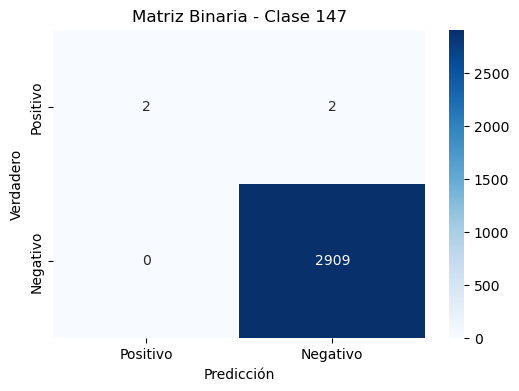

Métricas para la Clase 147:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 148:


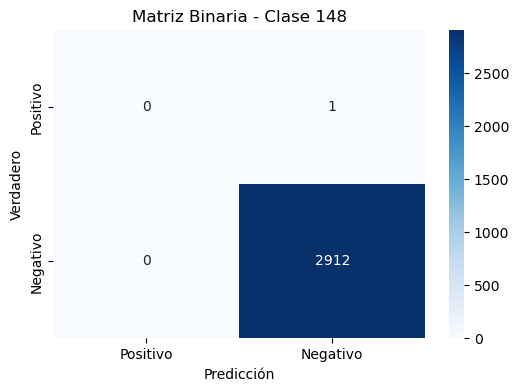

Métricas para la Clase 148:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 149:


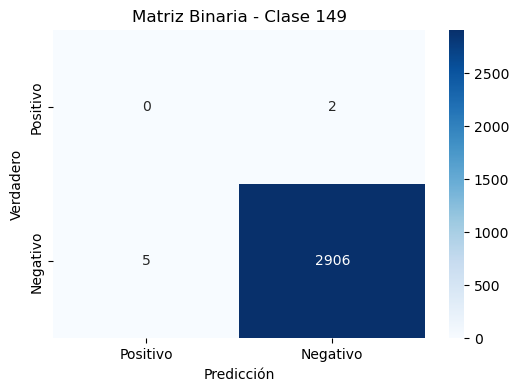

Métricas para la Clase 149:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 150:


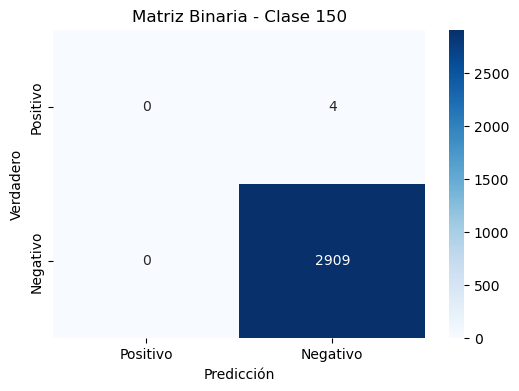

Métricas para la Clase 150:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 151:


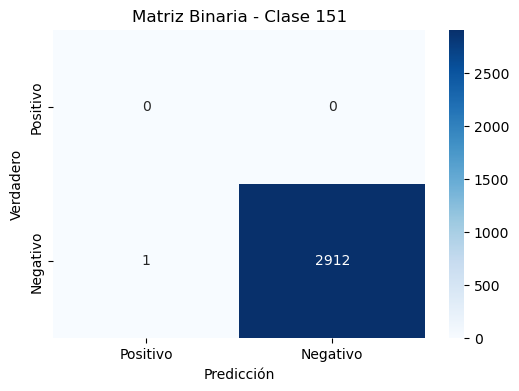

Métricas para la Clase 151:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 152:


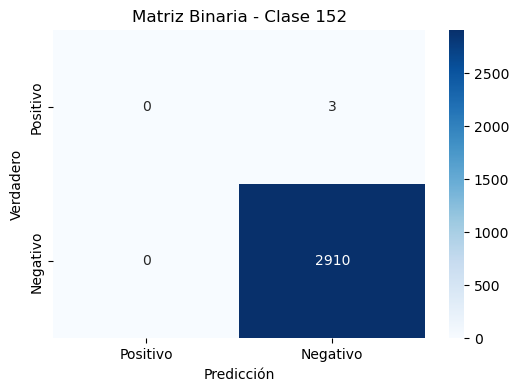

Métricas para la Clase 152:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 153:


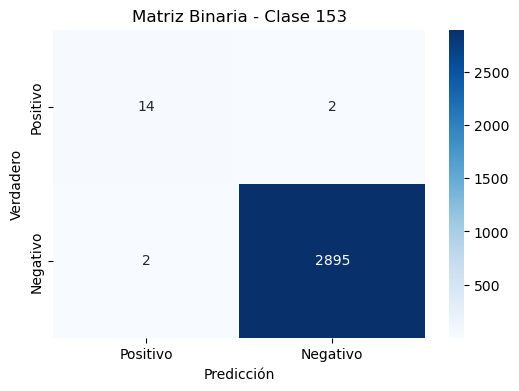

Métricas para la Clase 153:
  Precisión: 0.8750
  Recall: 0.8750
  F1-score: 0.8750
------------------------------
Matriz de Confusión Binaria para la Clase 154:


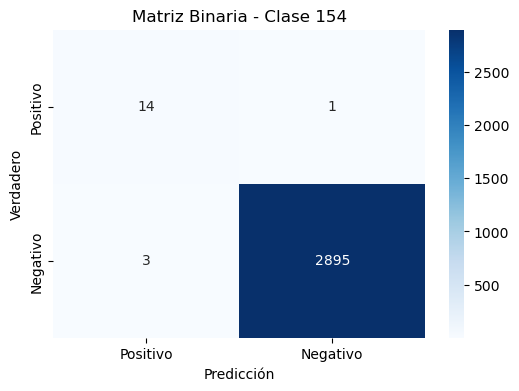

Métricas para la Clase 154:
  Precisión: 0.8235
  Recall: 0.9333
  F1-score: 0.8750
------------------------------
Matriz de Confusión Binaria para la Clase 155:


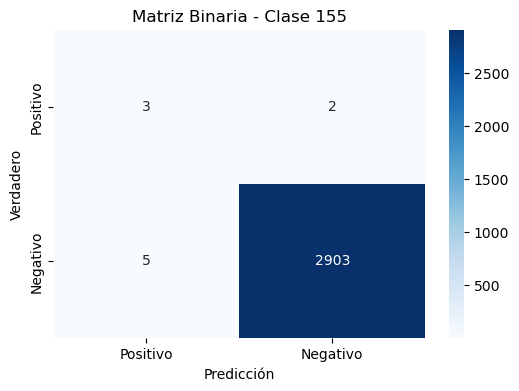

Métricas para la Clase 155:
  Precisión: 0.3750
  Recall: 0.6000
  F1-score: 0.4615
------------------------------
Matriz de Confusión Binaria para la Clase 156:


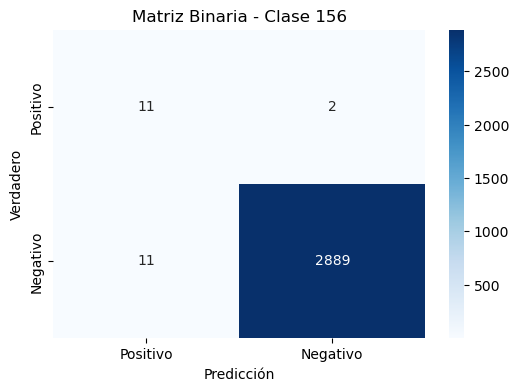

Métricas para la Clase 156:
  Precisión: 0.5000
  Recall: 0.8462
  F1-score: 0.6286
------------------------------
Matriz de Confusión Binaria para la Clase 157:


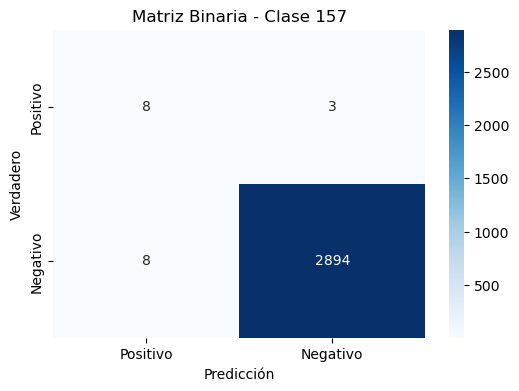

Métricas para la Clase 157:
  Precisión: 0.5000
  Recall: 0.7273
  F1-score: 0.5926
------------------------------
Matriz de Confusión Binaria para la Clase 158:


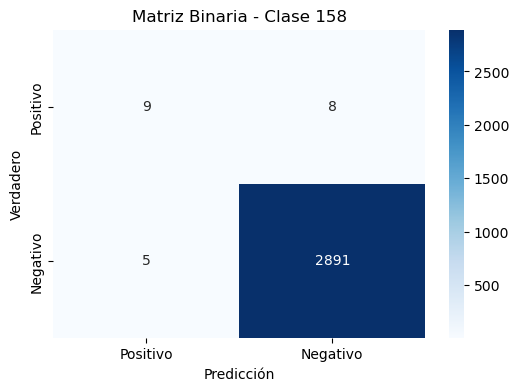

Métricas para la Clase 158:
  Precisión: 0.6429
  Recall: 0.5294
  F1-score: 0.5806
------------------------------
Matriz de Confusión Binaria para la Clase 159:


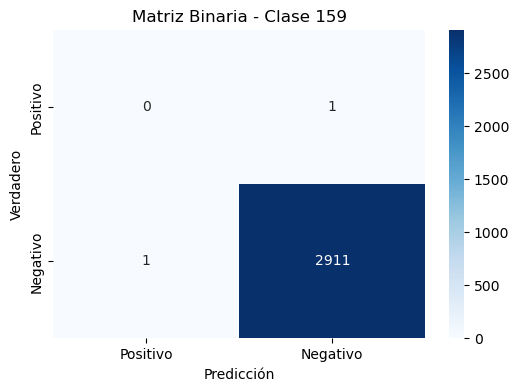

Métricas para la Clase 159:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 160:


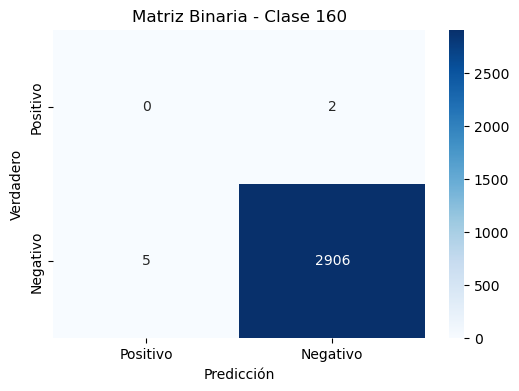

Métricas para la Clase 160:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 161:


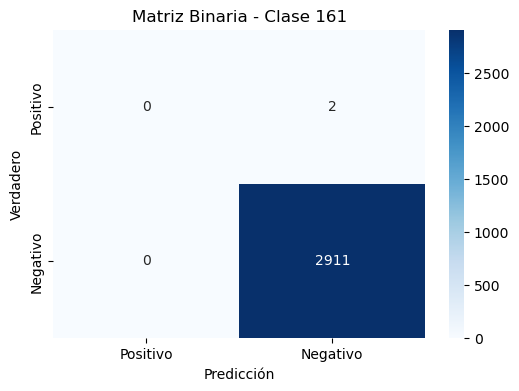

Métricas para la Clase 161:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 162:


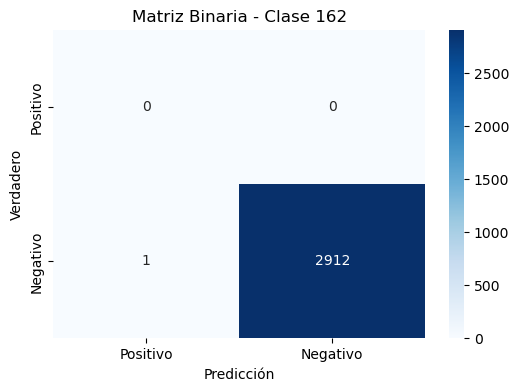

Métricas para la Clase 162:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 163:


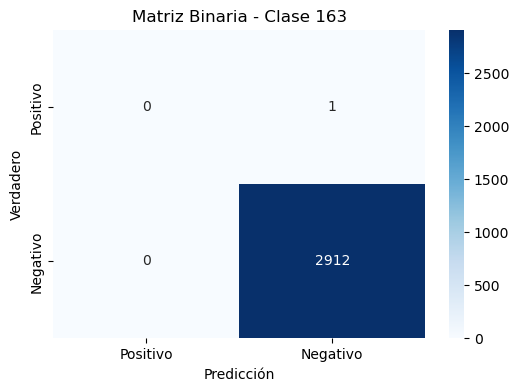

Métricas para la Clase 163:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 164:


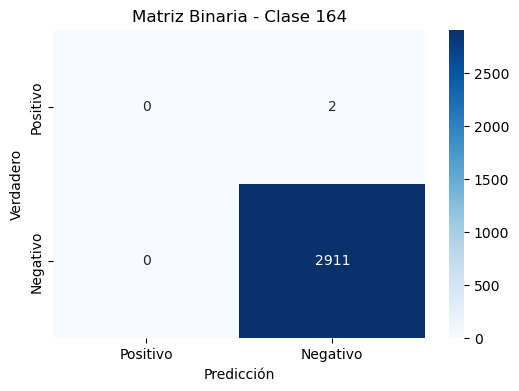

Métricas para la Clase 164:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 165:


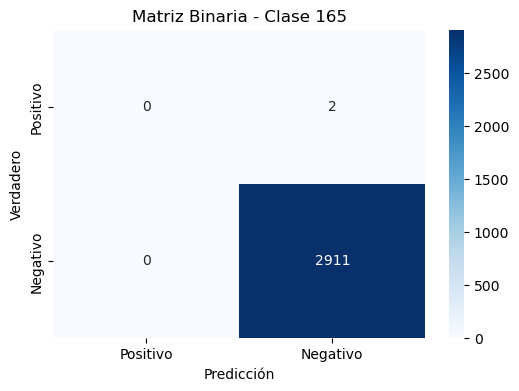

Métricas para la Clase 165:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 166:


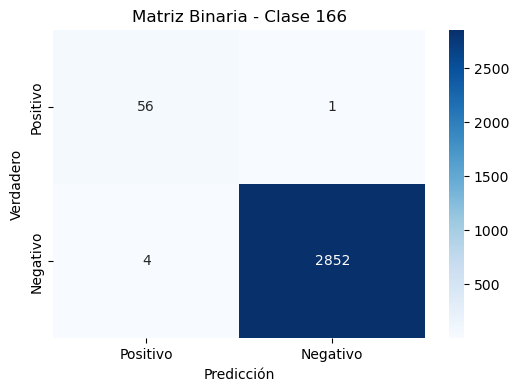

Métricas para la Clase 166:
  Precisión: 0.9333
  Recall: 0.9825
  F1-score: 0.9573
------------------------------
Matriz de Confusión Binaria para la Clase 167:


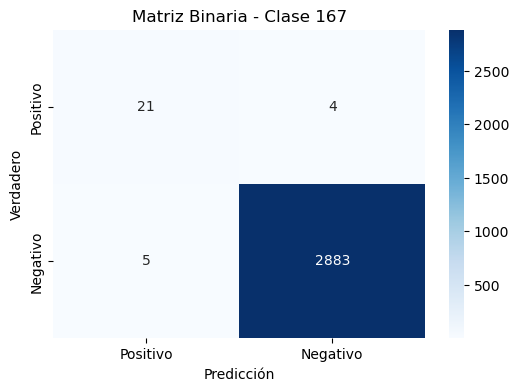

Métricas para la Clase 167:
  Precisión: 0.8077
  Recall: 0.8400
  F1-score: 0.8235
------------------------------
Matriz de Confusión Binaria para la Clase 168:


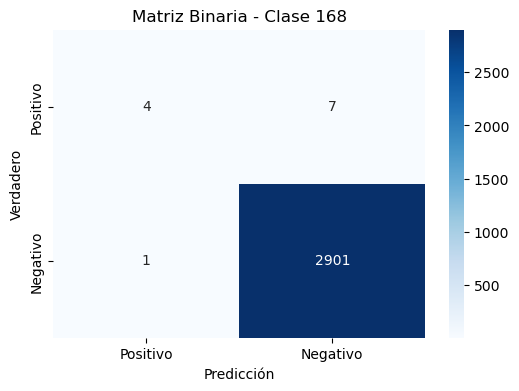

Métricas para la Clase 168:
  Precisión: 0.8000
  Recall: 0.3636
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 169:


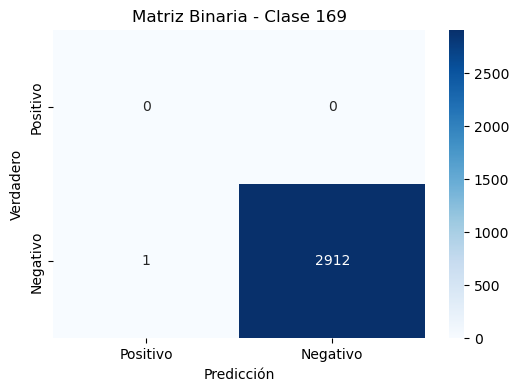

Métricas para la Clase 169:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 170:


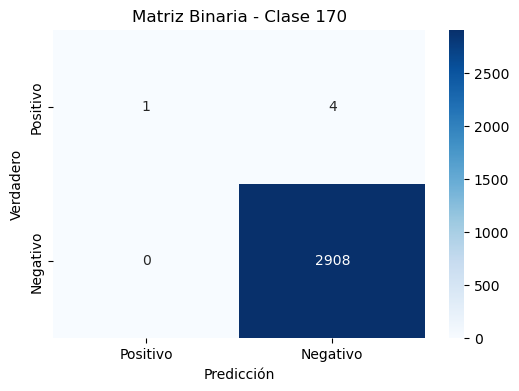

Métricas para la Clase 170:
  Precisión: 1.0000
  Recall: 0.2000
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 171:


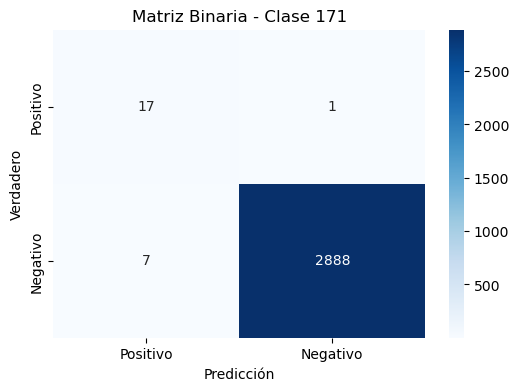

Métricas para la Clase 171:
  Precisión: 0.7083
  Recall: 0.9444
  F1-score: 0.8095
------------------------------
Matriz de Confusión Binaria para la Clase 172:


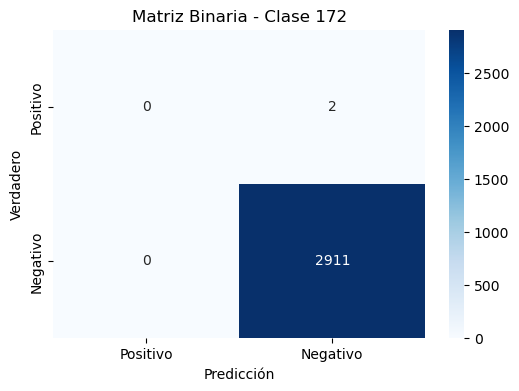

Métricas para la Clase 172:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 173:


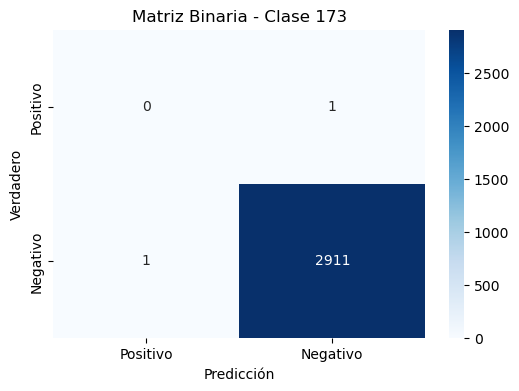

Métricas para la Clase 173:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 174:


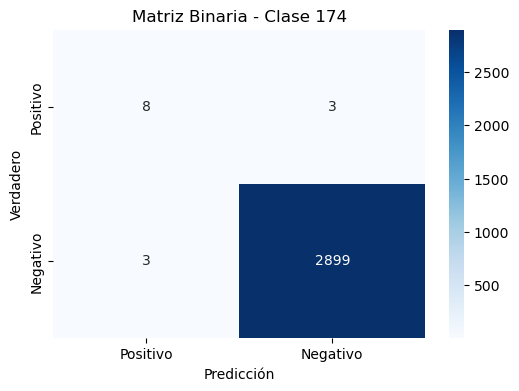

Métricas para la Clase 174:
  Precisión: 0.7273
  Recall: 0.7273
  F1-score: 0.7273
------------------------------
Matriz de Confusión Binaria para la Clase 175:


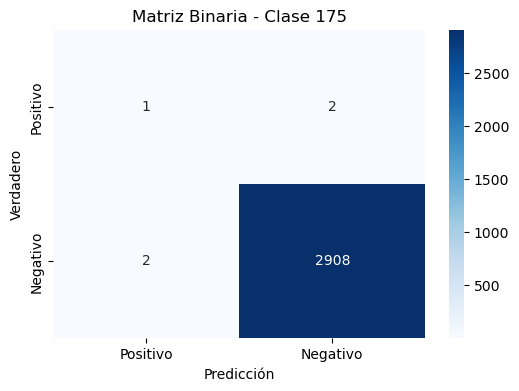

Métricas para la Clase 175:
  Precisión: 0.3333
  Recall: 0.3333
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 176:


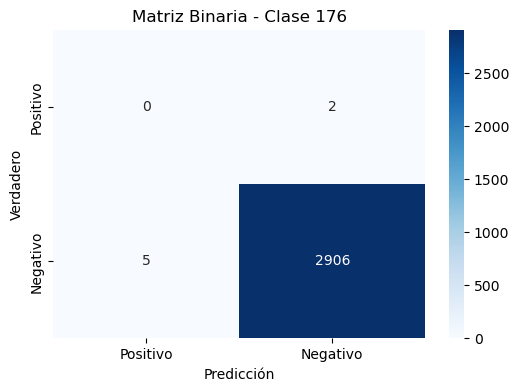

Métricas para la Clase 176:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 177:


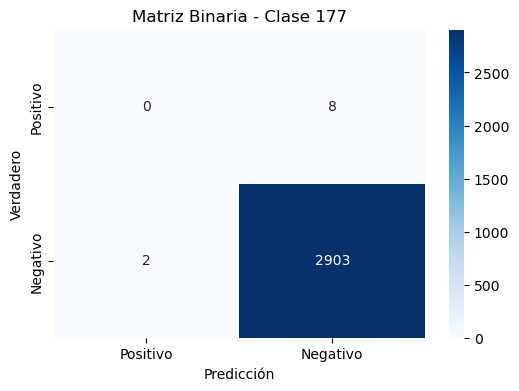

Métricas para la Clase 177:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 178:


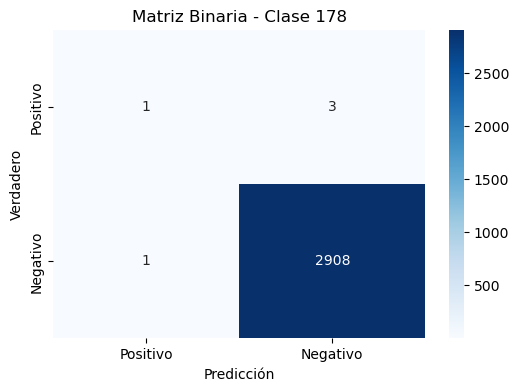

Métricas para la Clase 178:
  Precisión: 0.5000
  Recall: 0.2500
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 179:


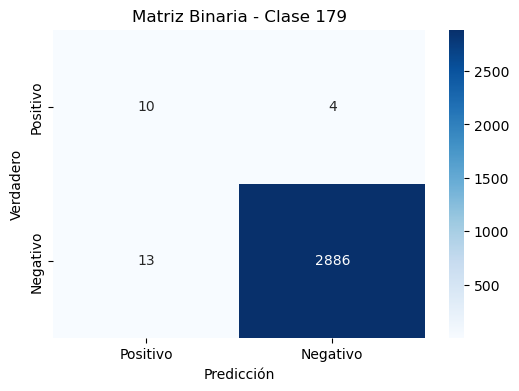

Métricas para la Clase 179:
  Precisión: 0.4348
  Recall: 0.7143
  F1-score: 0.5405
------------------------------
Matriz de Confusión Binaria para la Clase 180:


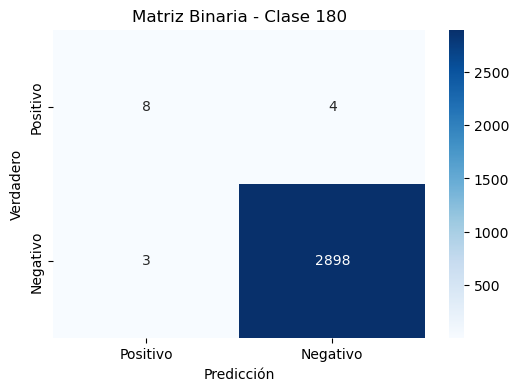

Métricas para la Clase 180:
  Precisión: 0.7273
  Recall: 0.6667
  F1-score: 0.6957
------------------------------
Matriz de Confusión Binaria para la Clase 181:


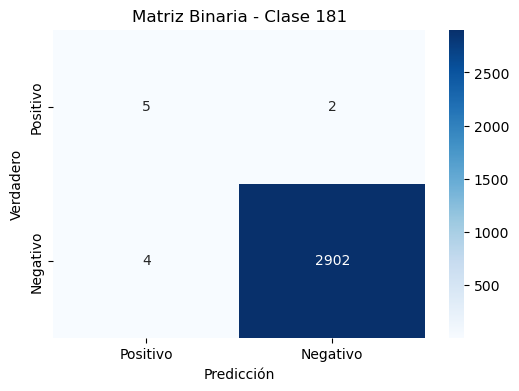

Métricas para la Clase 181:
  Precisión: 0.5556
  Recall: 0.7143
  F1-score: 0.6250
------------------------------
Matriz de Confusión Binaria para la Clase 182:


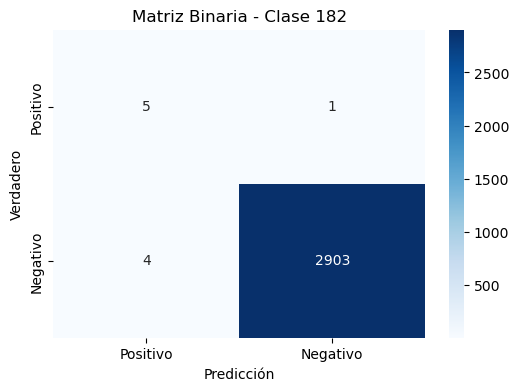

Métricas para la Clase 182:
  Precisión: 0.5556
  Recall: 0.8333
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 183:


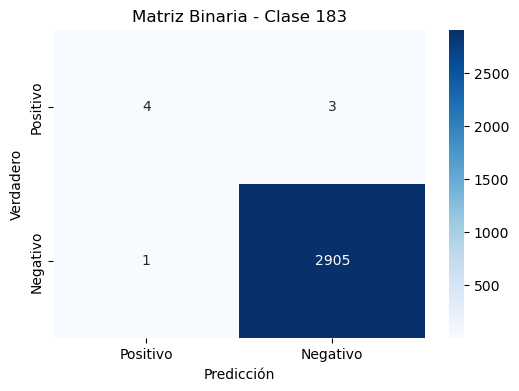

Métricas para la Clase 183:
  Precisión: 0.8000
  Recall: 0.5714
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 184:


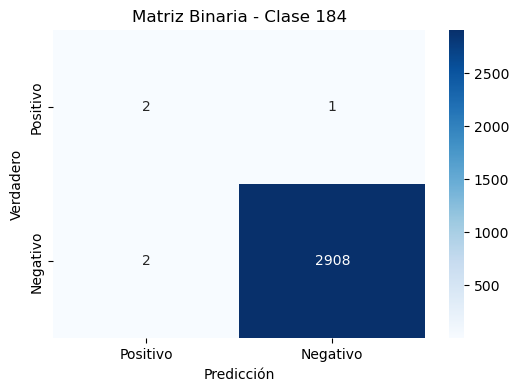

Métricas para la Clase 184:
  Precisión: 0.5000
  Recall: 0.6667
  F1-score: 0.5714
------------------------------
Matriz de Confusión Binaria para la Clase 185:


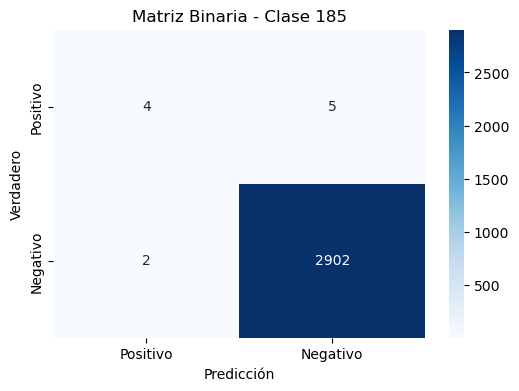

Métricas para la Clase 185:
  Precisión: 0.6667
  Recall: 0.4444
  F1-score: 0.5333
------------------------------
Matriz de Confusión Binaria para la Clase 186:


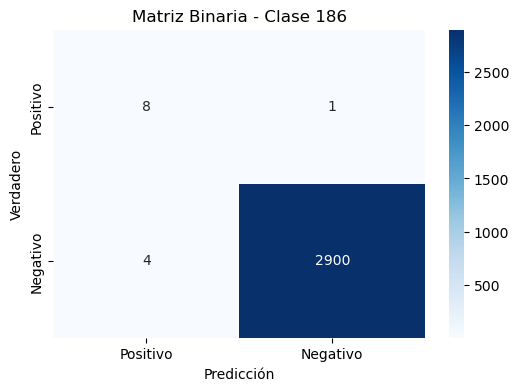

Métricas para la Clase 186:
  Precisión: 0.6667
  Recall: 0.8889
  F1-score: 0.7619
------------------------------
Matriz de Confusión Binaria para la Clase 187:


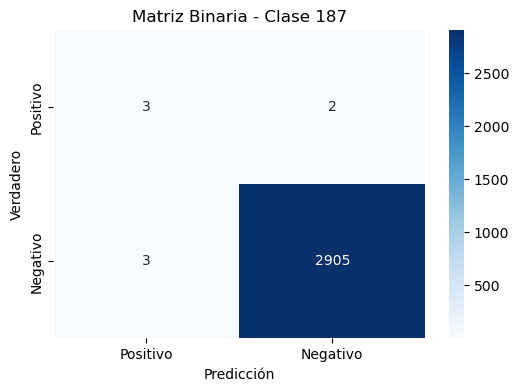

Métricas para la Clase 187:
  Precisión: 0.5000
  Recall: 0.6000
  F1-score: 0.5455
------------------------------
Matriz de Confusión Binaria para la Clase 188:


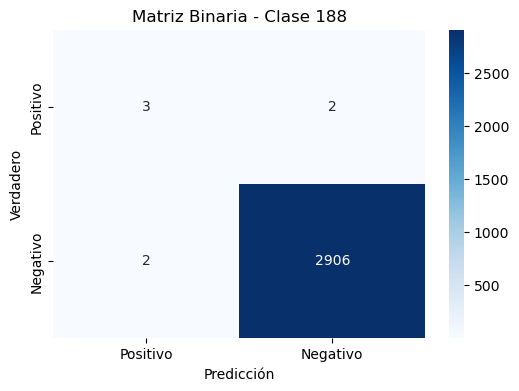

Métricas para la Clase 188:
  Precisión: 0.6000
  Recall: 0.6000
  F1-score: 0.6000
------------------------------
Matriz de Confusión Binaria para la Clase 189:


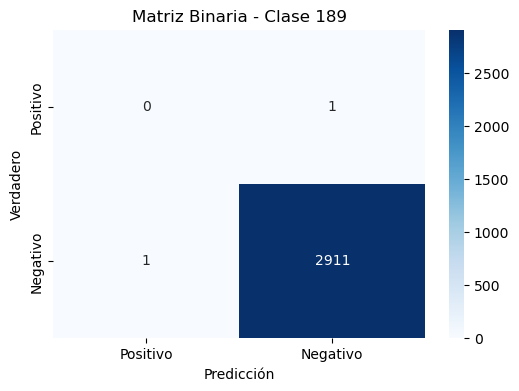

Métricas para la Clase 189:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 190:


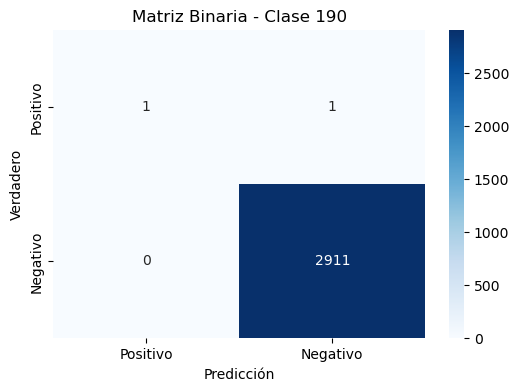

Métricas para la Clase 190:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 191:


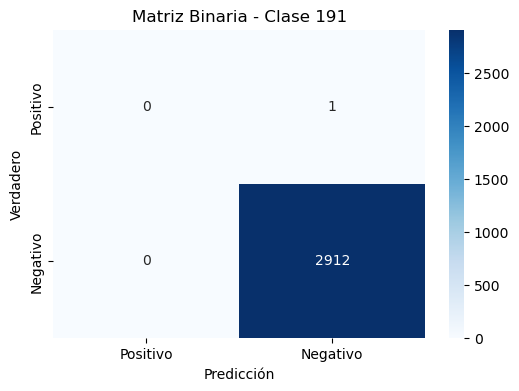

Métricas para la Clase 191:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 192:


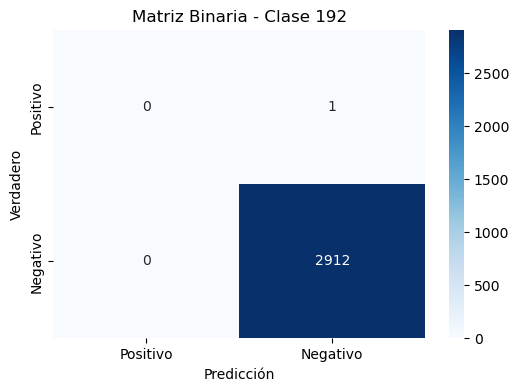

Métricas para la Clase 192:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 193:


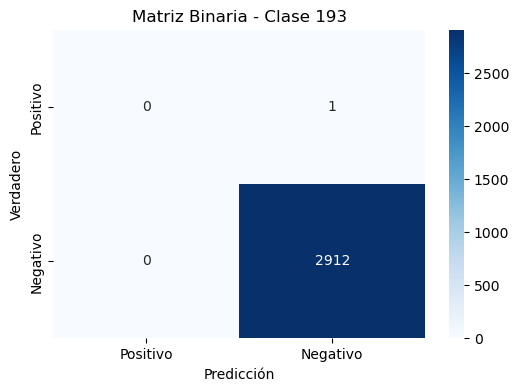

Métricas para la Clase 193:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 194:


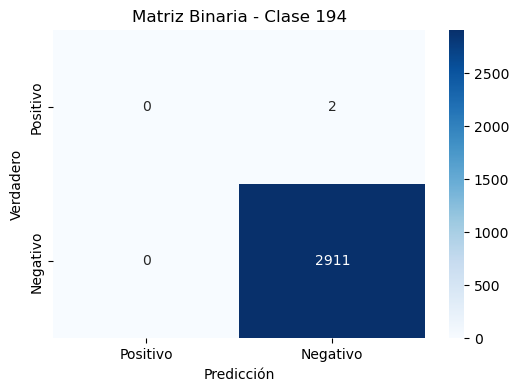

Métricas para la Clase 194:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 195:


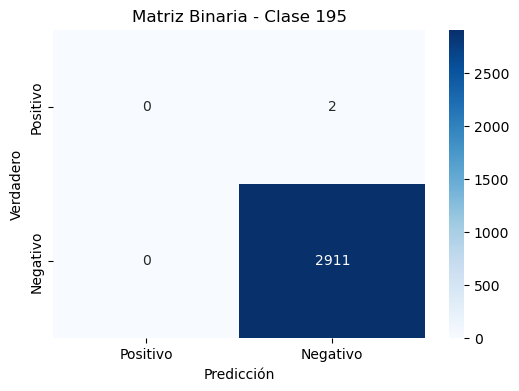

Métricas para la Clase 195:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 196:


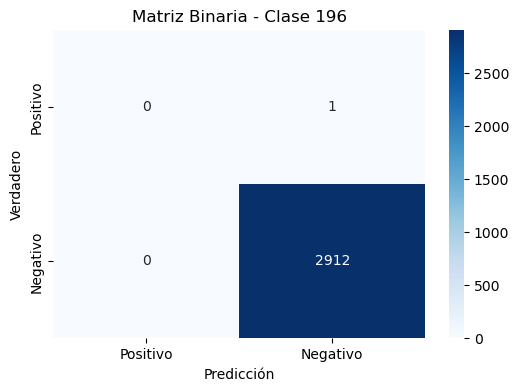

Métricas para la Clase 196:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 197:


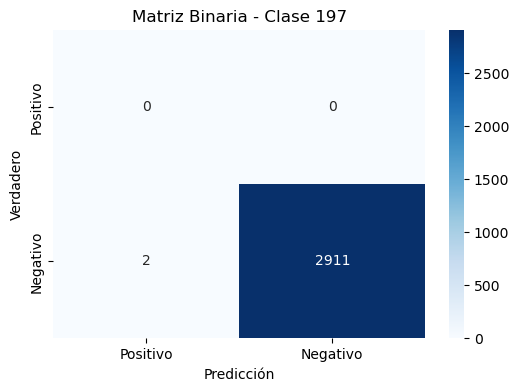

Métricas para la Clase 197:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 198:


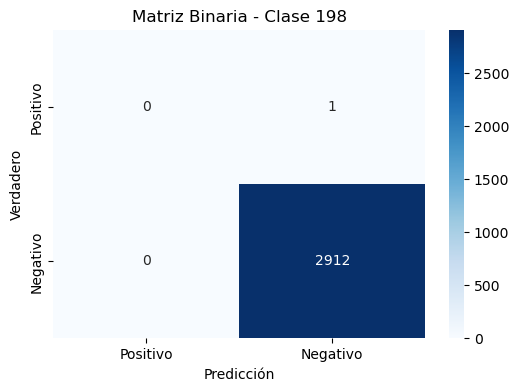

Métricas para la Clase 198:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 199:


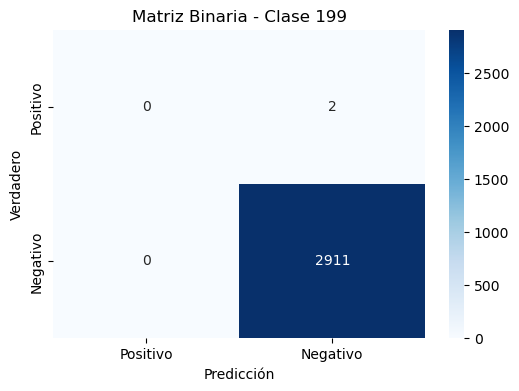

Métricas para la Clase 199:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 200:


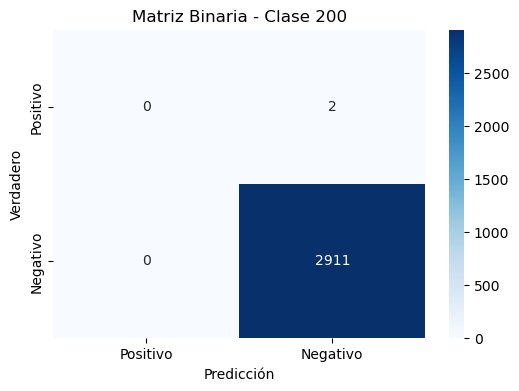

Métricas para la Clase 200:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 201:


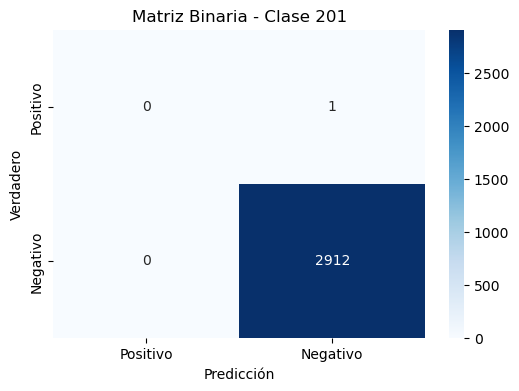

Métricas para la Clase 201:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 202:


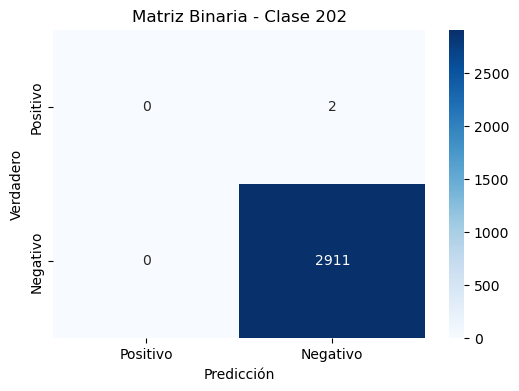

Métricas para la Clase 202:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 203:


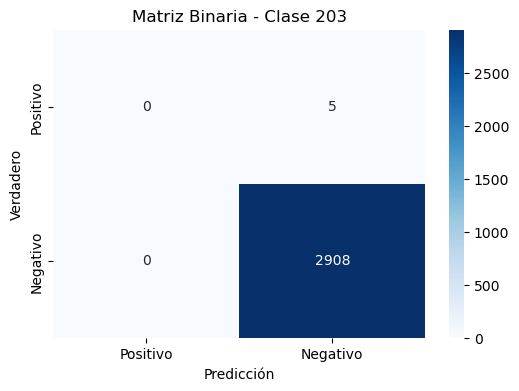

Métricas para la Clase 203:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 204:


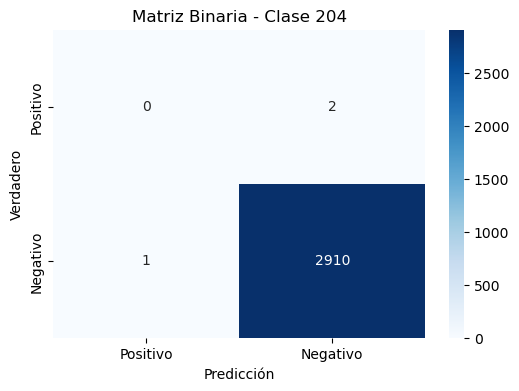

Métricas para la Clase 204:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 205:


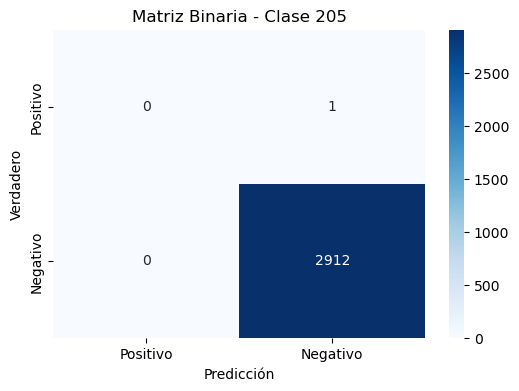

Métricas para la Clase 205:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 206:


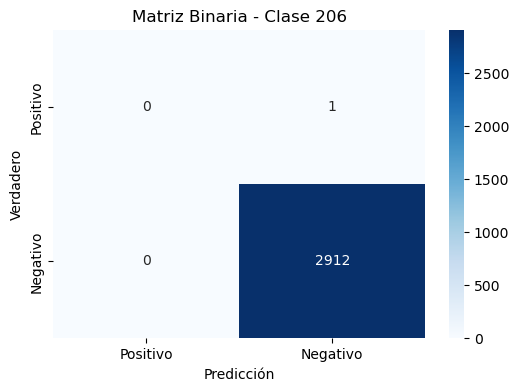

Métricas para la Clase 206:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 207:


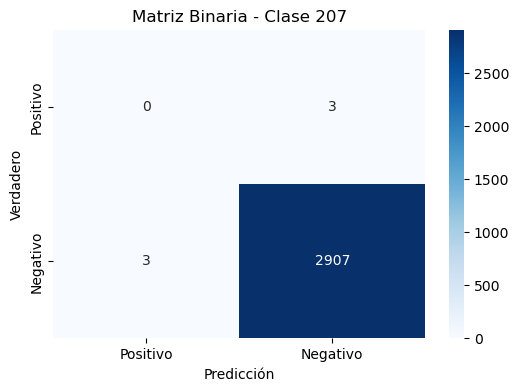

Métricas para la Clase 207:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 208:


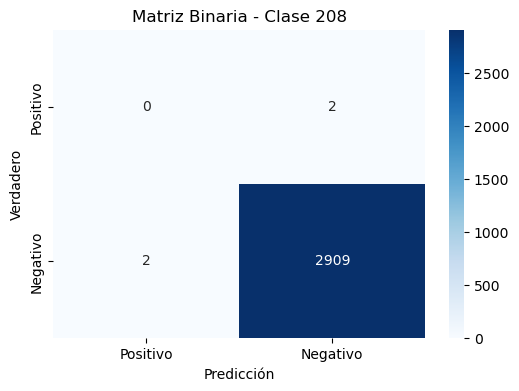

Métricas para la Clase 208:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 209:


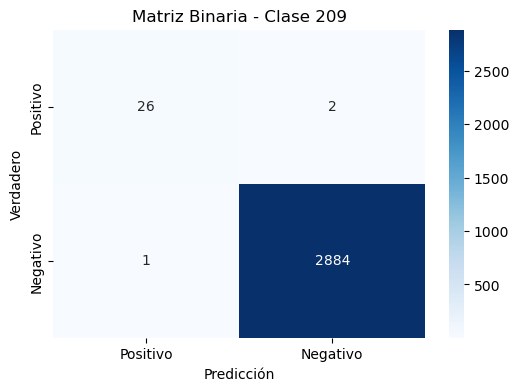

Métricas para la Clase 209:
  Precisión: 0.9630
  Recall: 0.9286
  F1-score: 0.9455
------------------------------
Matriz de Confusión Binaria para la Clase 210:


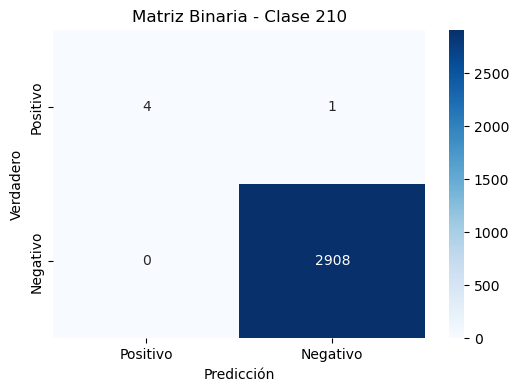

Métricas para la Clase 210:
  Precisión: 1.0000
  Recall: 0.8000
  F1-score: 0.8889
------------------------------
Matriz de Confusión Binaria para la Clase 211:


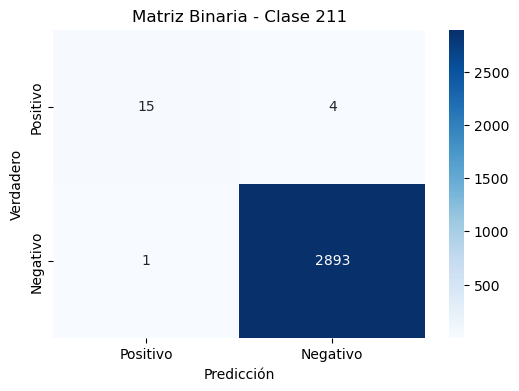

Métricas para la Clase 211:
  Precisión: 0.9375
  Recall: 0.7895
  F1-score: 0.8571
------------------------------
Matriz de Confusión Binaria para la Clase 212:


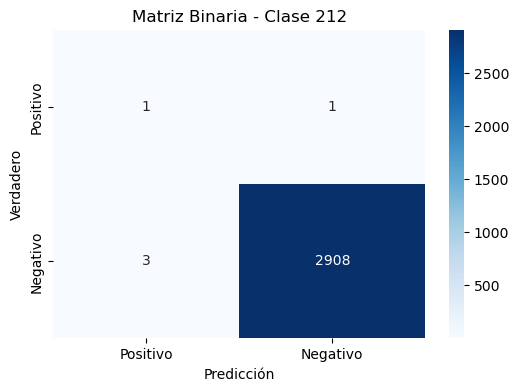

Métricas para la Clase 212:
  Precisión: 0.2500
  Recall: 0.5000
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 213:


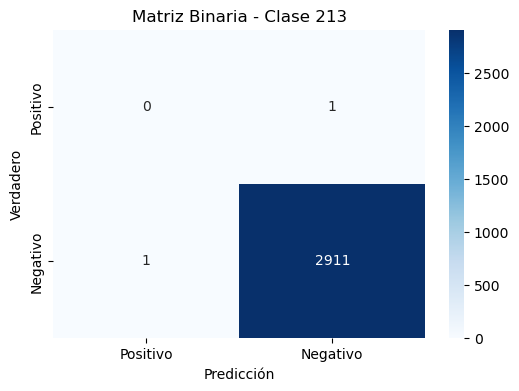

Métricas para la Clase 213:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 214:


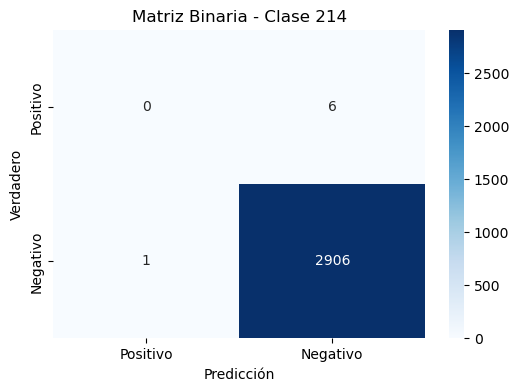

Métricas para la Clase 214:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 215:


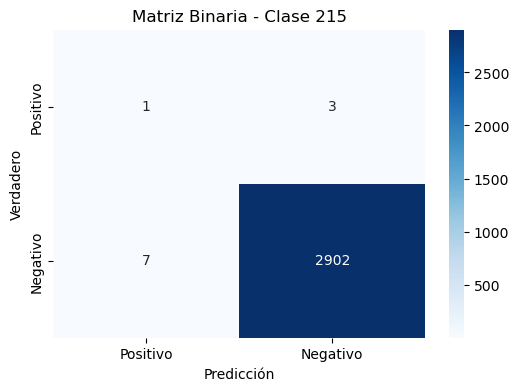

Métricas para la Clase 215:
  Precisión: 0.1250
  Recall: 0.2500
  F1-score: 0.1667
------------------------------
Matriz de Confusión Binaria para la Clase 216:


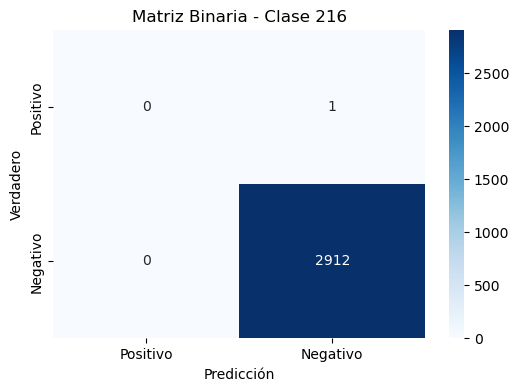

Métricas para la Clase 216:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 217:


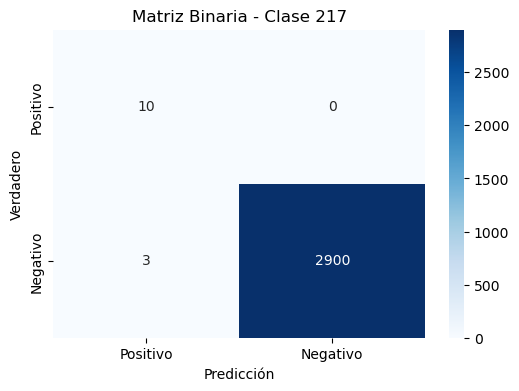

Métricas para la Clase 217:
  Precisión: 0.7692
  Recall: 1.0000
  F1-score: 0.8696
------------------------------
Matriz de Confusión Binaria para la Clase 218:


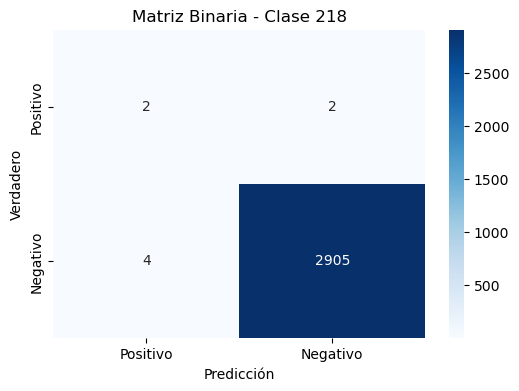

Métricas para la Clase 218:
  Precisión: 0.3333
  Recall: 0.5000
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 219:


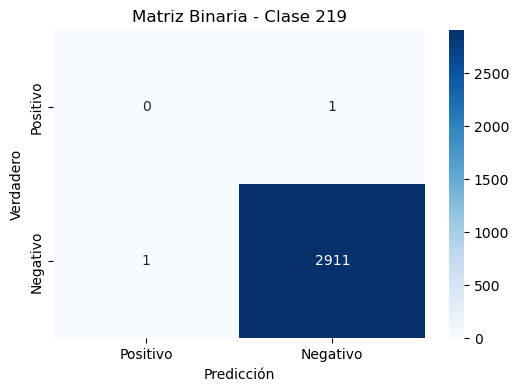

Métricas para la Clase 219:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 220:


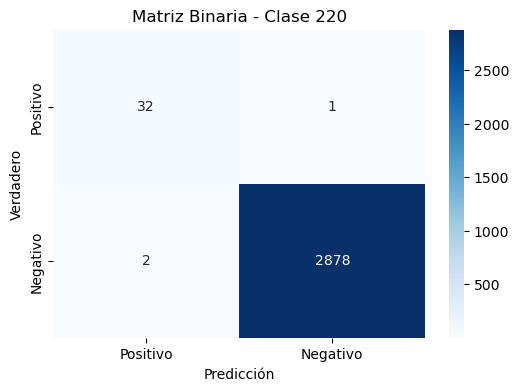

Métricas para la Clase 220:
  Precisión: 0.9412
  Recall: 0.9697
  F1-score: 0.9552
------------------------------
Matriz de Confusión Binaria para la Clase 221:


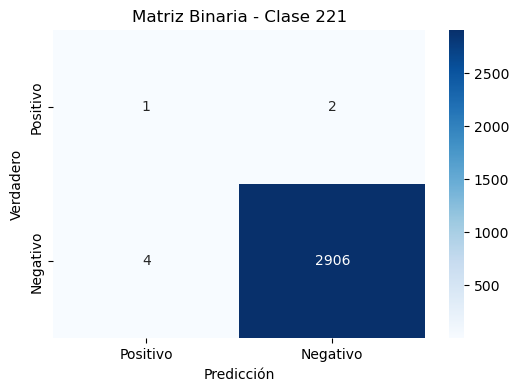

Métricas para la Clase 221:
  Precisión: 0.2000
  Recall: 0.3333
  F1-score: 0.2500
------------------------------
Matriz de Confusión Binaria para la Clase 222:


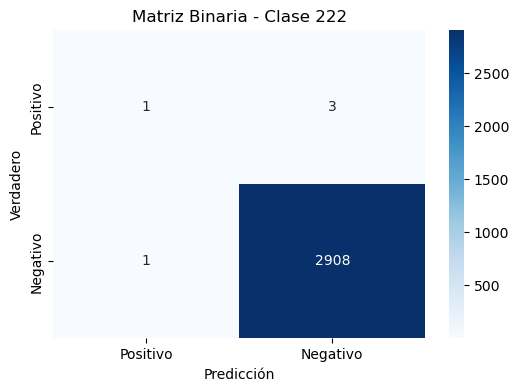

Métricas para la Clase 222:
  Precisión: 0.5000
  Recall: 0.2500
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 223:


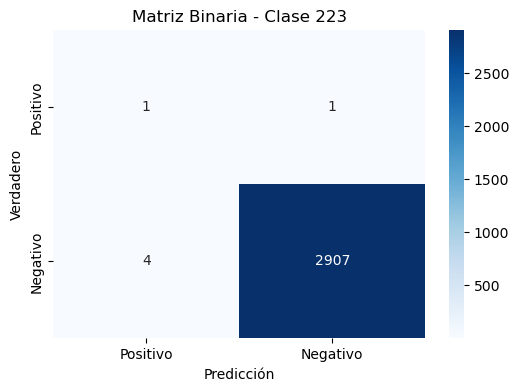

Métricas para la Clase 223:
  Precisión: 0.2000
  Recall: 0.5000
  F1-score: 0.2857
------------------------------
Matriz de Confusión Binaria para la Clase 224:


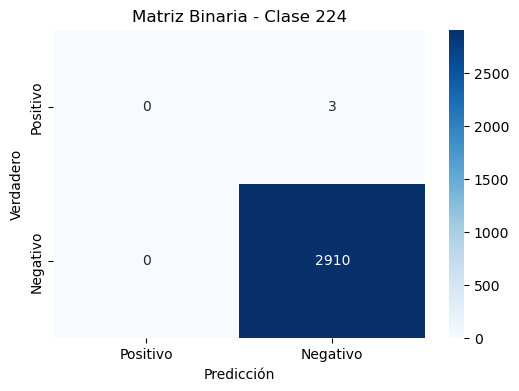

Métricas para la Clase 224:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 225:


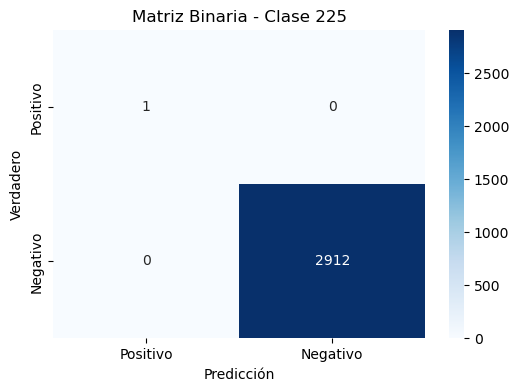

Métricas para la Clase 225:
  Precisión: 1.0000
  Recall: 1.0000
  F1-score: 1.0000
------------------------------
Matriz de Confusión Binaria para la Clase 226:


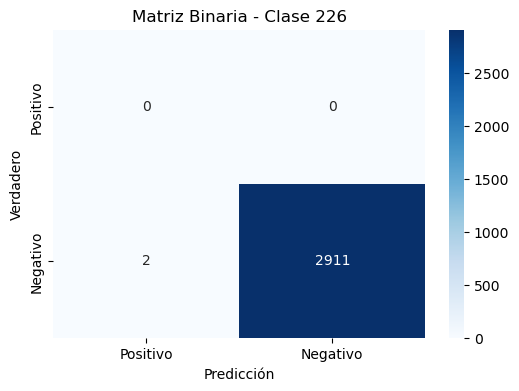

Métricas para la Clase 226:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 227:


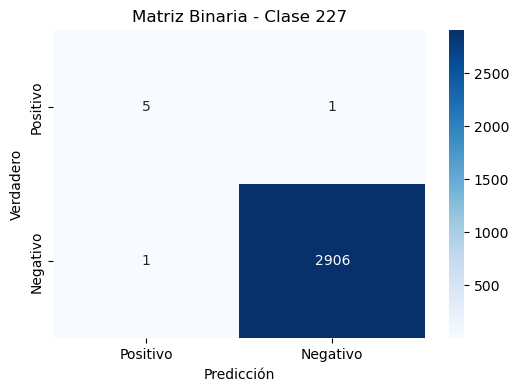

Métricas para la Clase 227:
  Precisión: 0.8333
  Recall: 0.8333
  F1-score: 0.8333
------------------------------
Matriz de Confusión Binaria para la Clase 228:


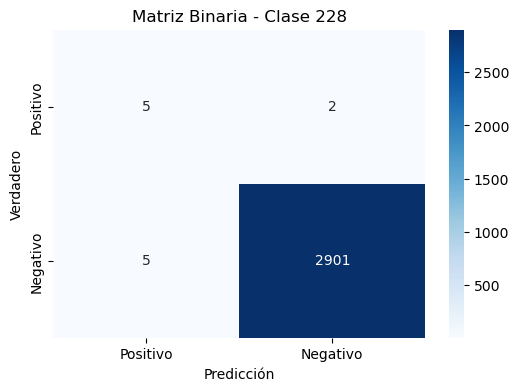

Métricas para la Clase 228:
  Precisión: 0.5000
  Recall: 0.7143
  F1-score: 0.5882
------------------------------
Matriz de Confusión Binaria para la Clase 229:


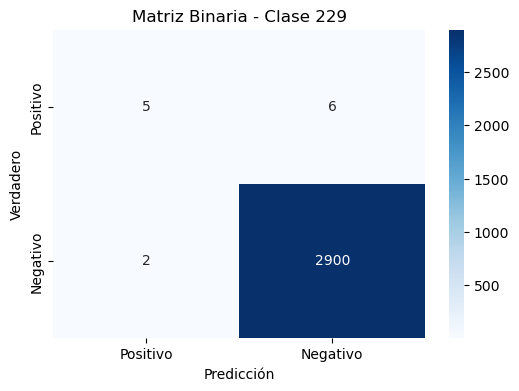

Métricas para la Clase 229:
  Precisión: 0.7143
  Recall: 0.4545
  F1-score: 0.5556
------------------------------
Matriz de Confusión Binaria para la Clase 230:


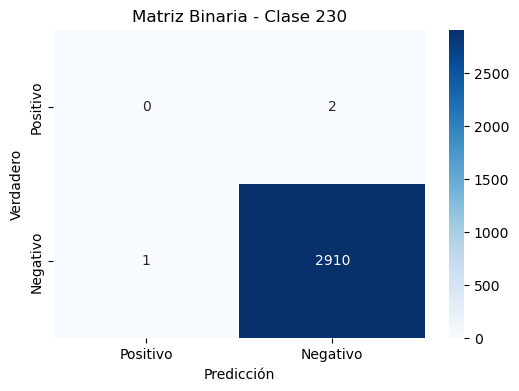

Métricas para la Clase 230:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 231:


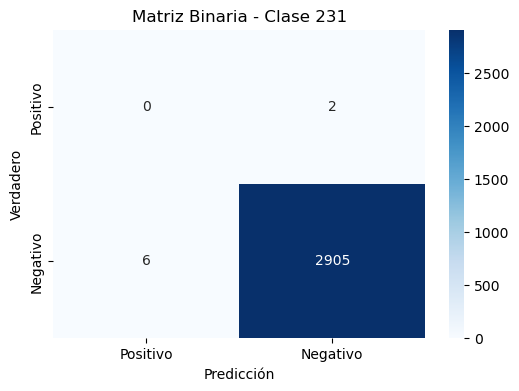

Métricas para la Clase 231:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 232:


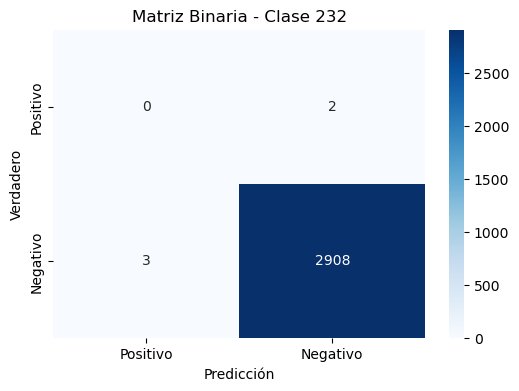

Métricas para la Clase 232:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 233:


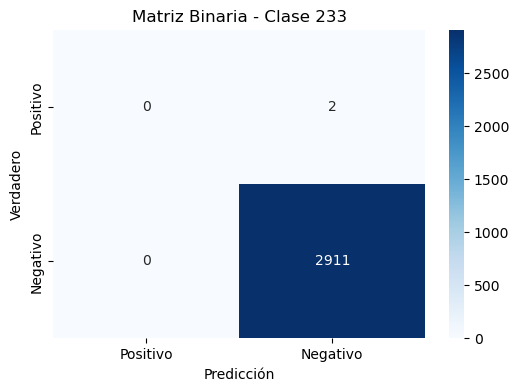

Métricas para la Clase 233:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 234:


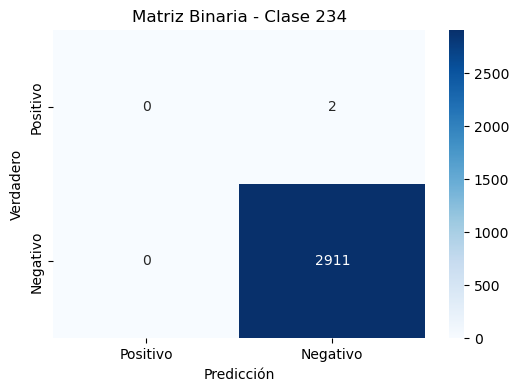

Métricas para la Clase 234:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 235:


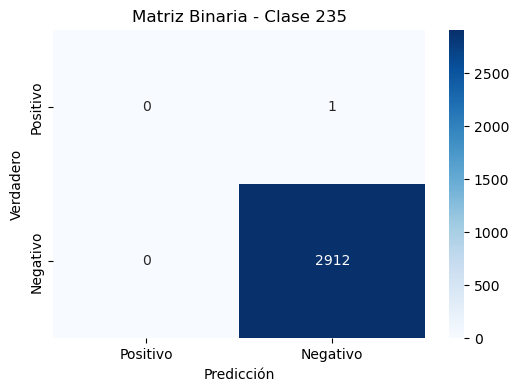

Métricas para la Clase 235:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 236:


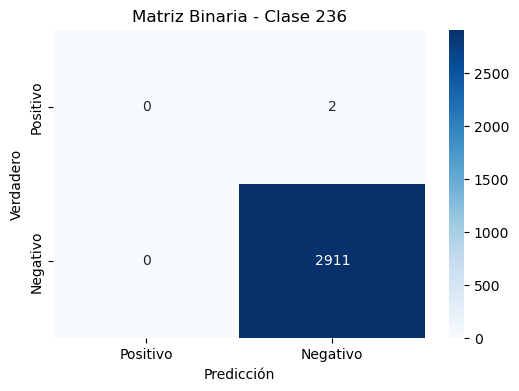

Métricas para la Clase 236:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 237:


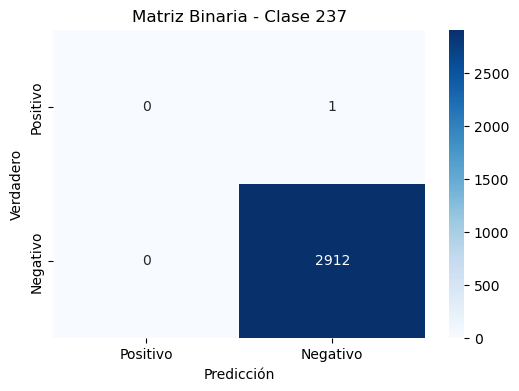

Métricas para la Clase 237:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 238:


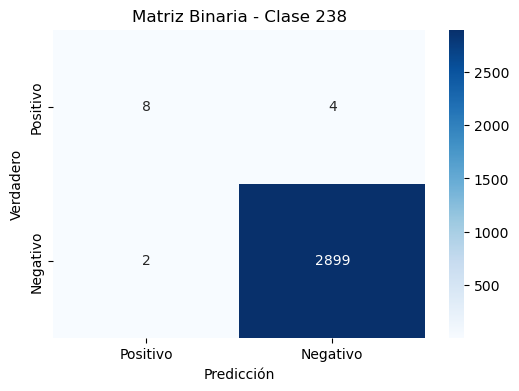

Métricas para la Clase 238:
  Precisión: 0.8000
  Recall: 0.6667
  F1-score: 0.7273
------------------------------
Matriz de Confusión Binaria para la Clase 239:


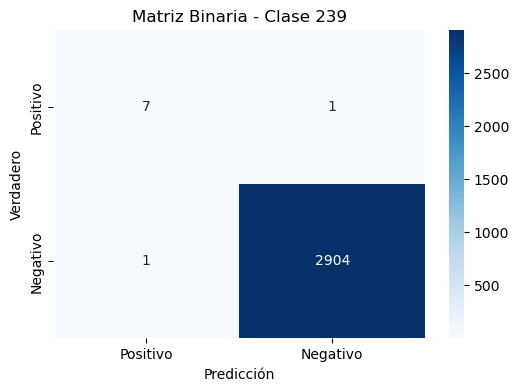

Métricas para la Clase 239:
  Precisión: 0.8750
  Recall: 0.8750
  F1-score: 0.8750
------------------------------
Matriz de Confusión Binaria para la Clase 240:


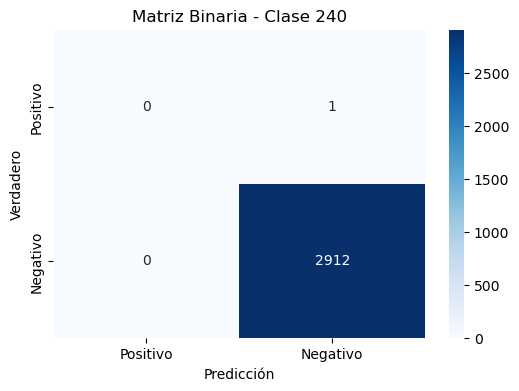

Métricas para la Clase 240:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 241:


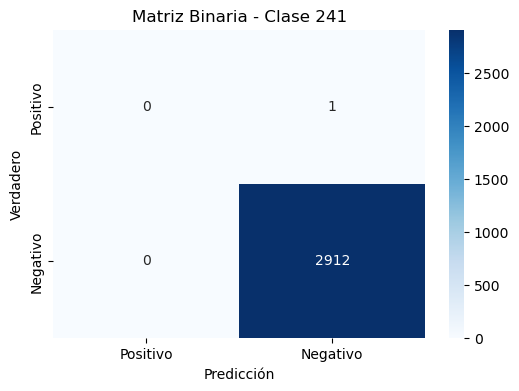

Métricas para la Clase 241:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 242:


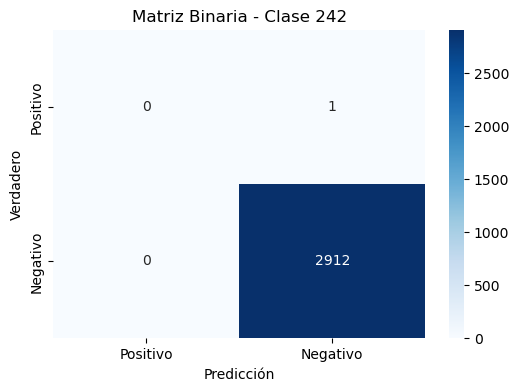

Métricas para la Clase 242:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 243:


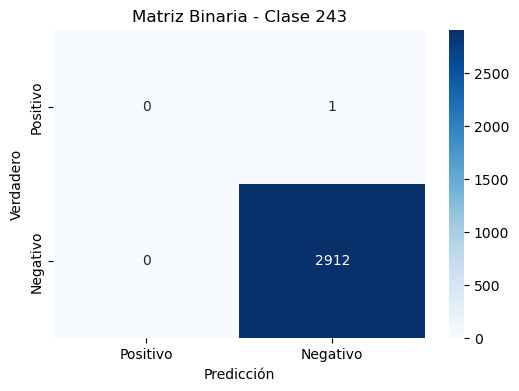

Métricas para la Clase 243:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 244:


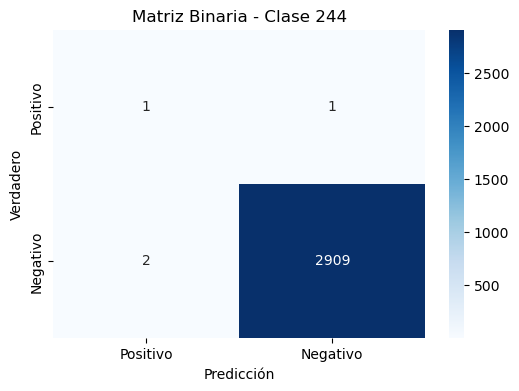

Métricas para la Clase 244:
  Precisión: 0.3333
  Recall: 0.5000
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 245:


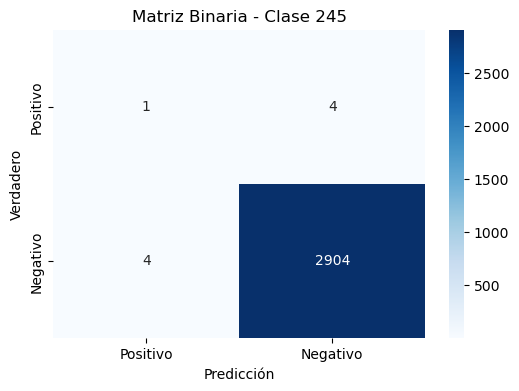

Métricas para la Clase 245:
  Precisión: 0.2000
  Recall: 0.2000
  F1-score: 0.2000
------------------------------
Matriz de Confusión Binaria para la Clase 246:


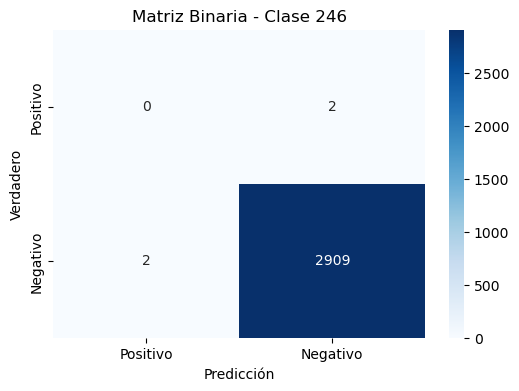

Métricas para la Clase 246:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 247:


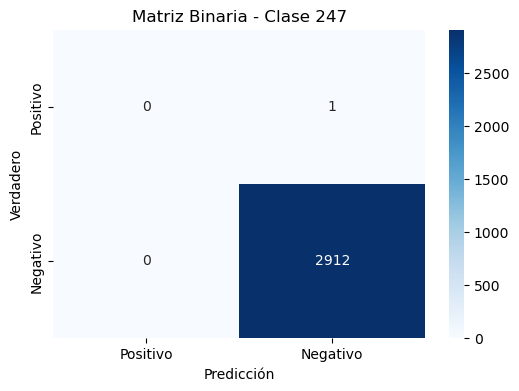

Métricas para la Clase 247:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 248:


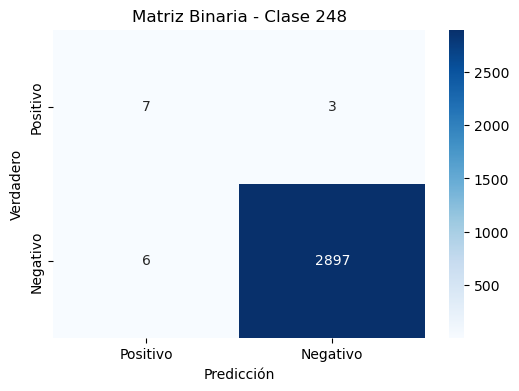

Métricas para la Clase 248:
  Precisión: 0.5385
  Recall: 0.7000
  F1-score: 0.6087
------------------------------
Matriz de Confusión Binaria para la Clase 249:


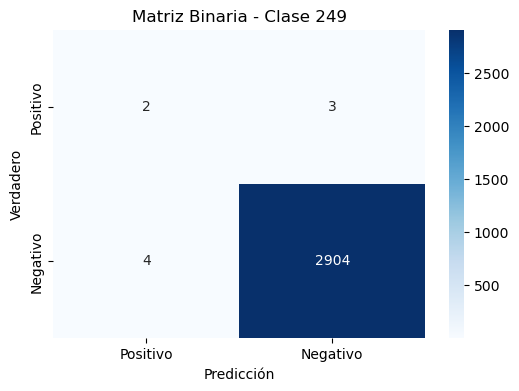

Métricas para la Clase 249:
  Precisión: 0.3333
  Recall: 0.4000
  F1-score: 0.3636
------------------------------
Matriz de Confusión Binaria para la Clase 250:


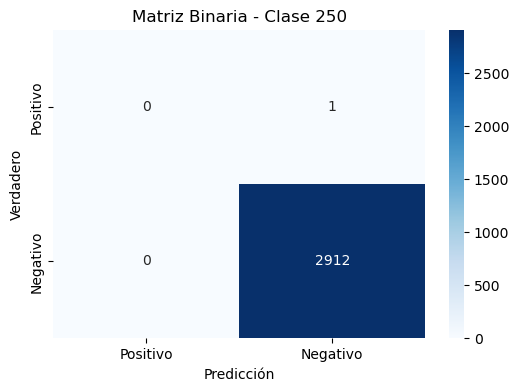

Métricas para la Clase 250:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 251:


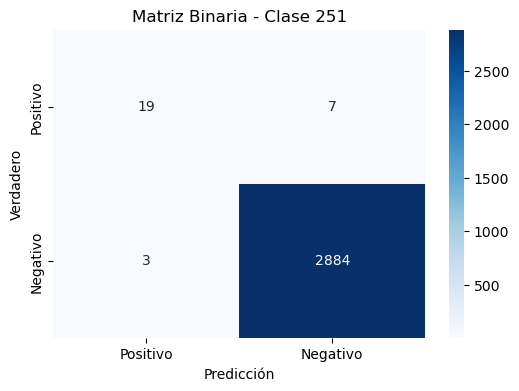

Métricas para la Clase 251:
  Precisión: 0.8636
  Recall: 0.7308
  F1-score: 0.7917
------------------------------
Matriz de Confusión Binaria para la Clase 252:


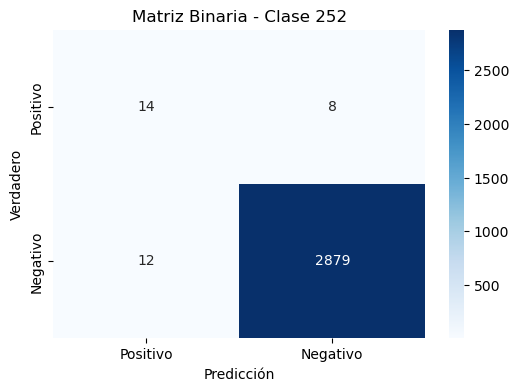

Métricas para la Clase 252:
  Precisión: 0.5385
  Recall: 0.6364
  F1-score: 0.5833
------------------------------
Matriz de Confusión Binaria para la Clase 253:


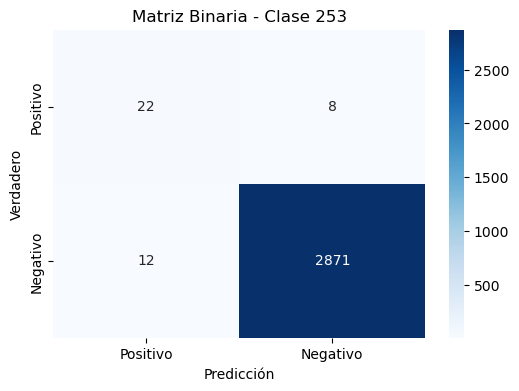

Métricas para la Clase 253:
  Precisión: 0.6471
  Recall: 0.7333
  F1-score: 0.6875
------------------------------
Matriz de Confusión Binaria para la Clase 254:


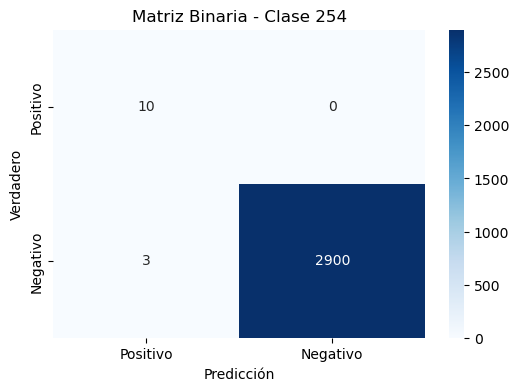

Métricas para la Clase 254:
  Precisión: 0.7692
  Recall: 1.0000
  F1-score: 0.8696
------------------------------
Matriz de Confusión Binaria para la Clase 255:


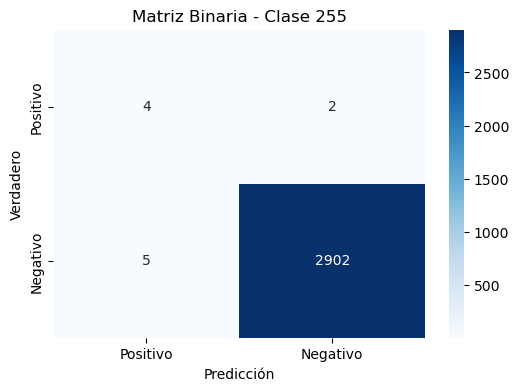

Métricas para la Clase 255:
  Precisión: 0.4444
  Recall: 0.6667
  F1-score: 0.5333
------------------------------
Matriz de Confusión Binaria para la Clase 256:


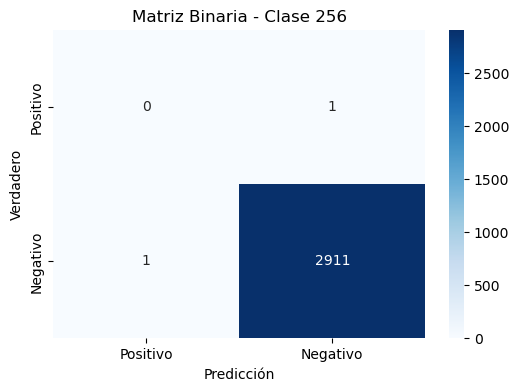

Métricas para la Clase 256:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 257:


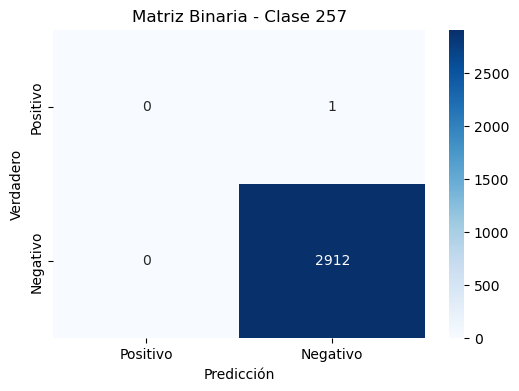

Métricas para la Clase 257:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 258:


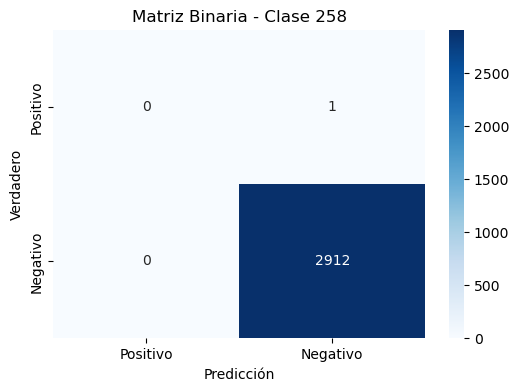

Métricas para la Clase 258:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 259:


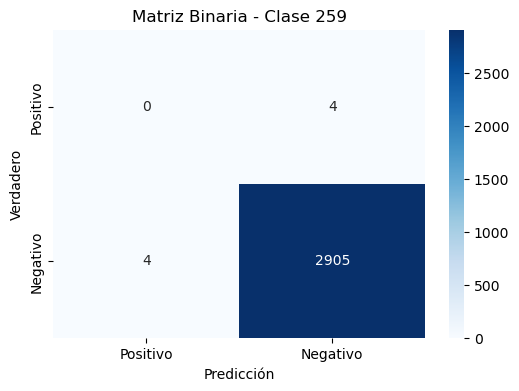

Métricas para la Clase 259:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 260:


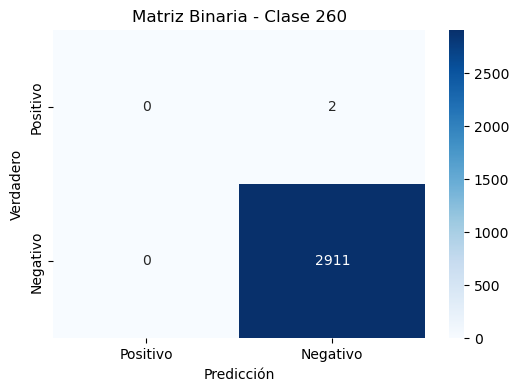

Métricas para la Clase 260:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 261:


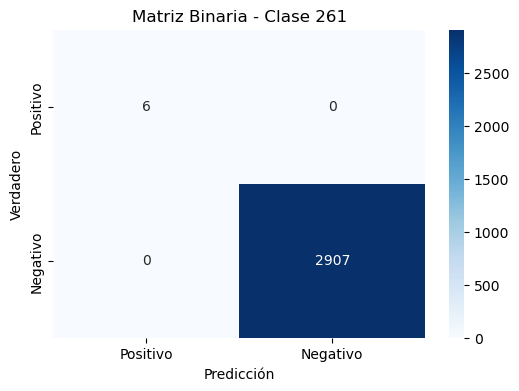

Métricas para la Clase 261:
  Precisión: 1.0000
  Recall: 1.0000
  F1-score: 1.0000
------------------------------
Matriz de Confusión Binaria para la Clase 262:


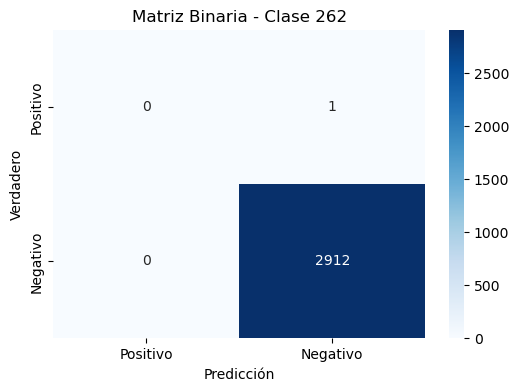

Métricas para la Clase 262:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 263:


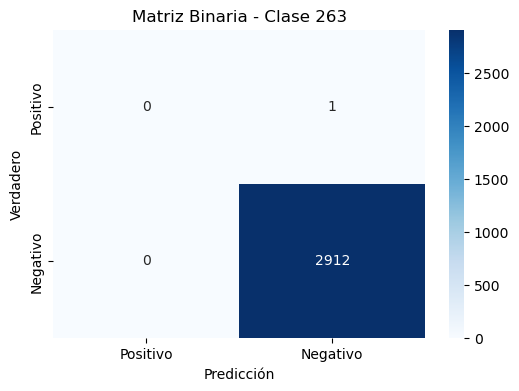

Métricas para la Clase 263:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 264:


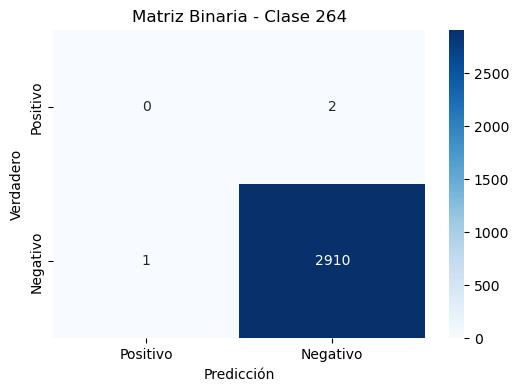

Métricas para la Clase 264:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 265:


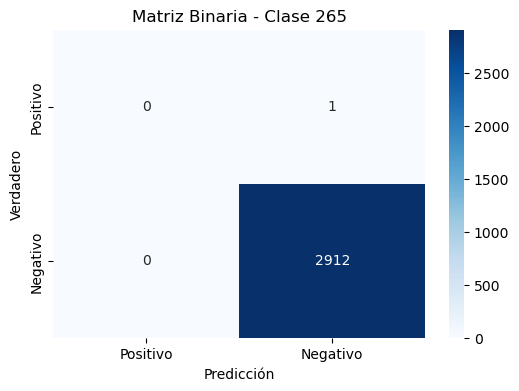

Métricas para la Clase 265:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 266:


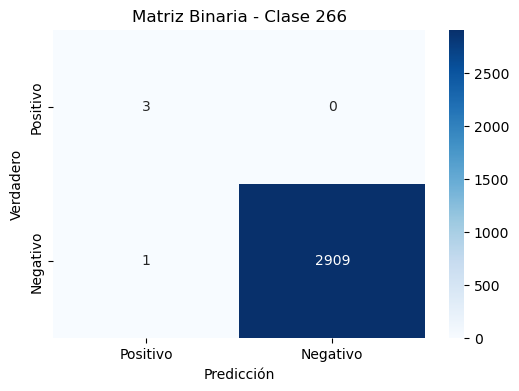

Métricas para la Clase 266:
  Precisión: 0.7500
  Recall: 1.0000
  F1-score: 0.8571
------------------------------
Matriz de Confusión Binaria para la Clase 267:


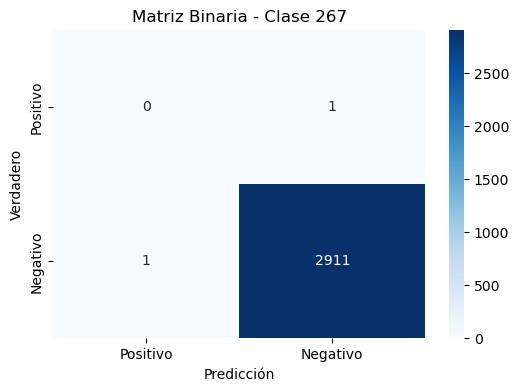

Métricas para la Clase 267:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 268:


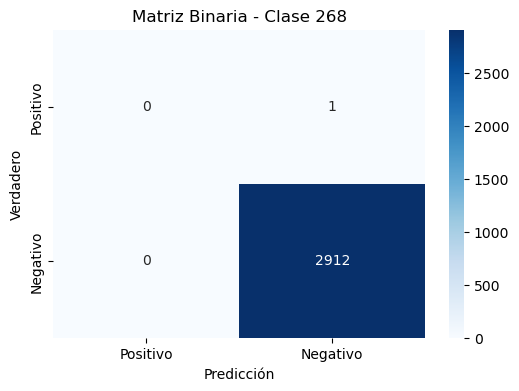

Métricas para la Clase 268:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 269:


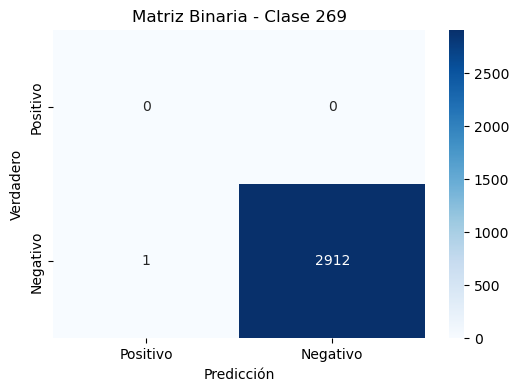

Métricas para la Clase 269:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 270:


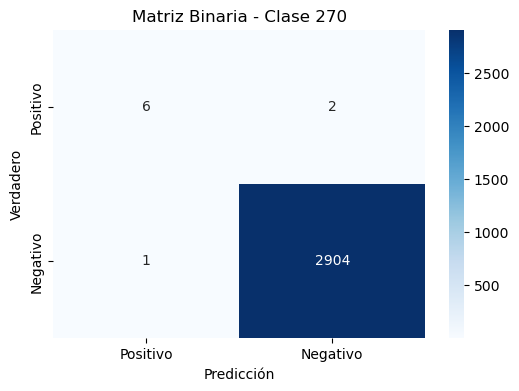

Métricas para la Clase 270:
  Precisión: 0.8571
  Recall: 0.7500
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 271:


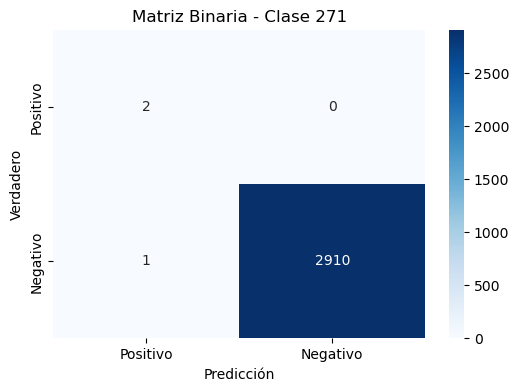

Métricas para la Clase 271:
  Precisión: 0.6667
  Recall: 1.0000
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 272:


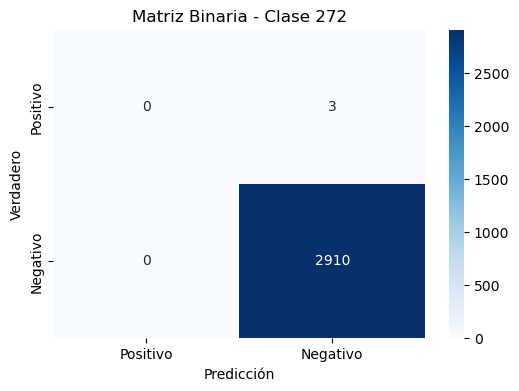

Métricas para la Clase 272:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 273:


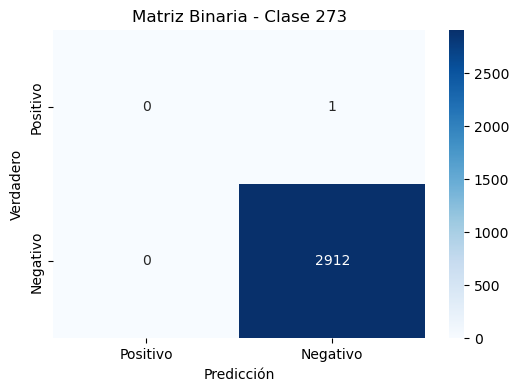

Métricas para la Clase 273:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 274:


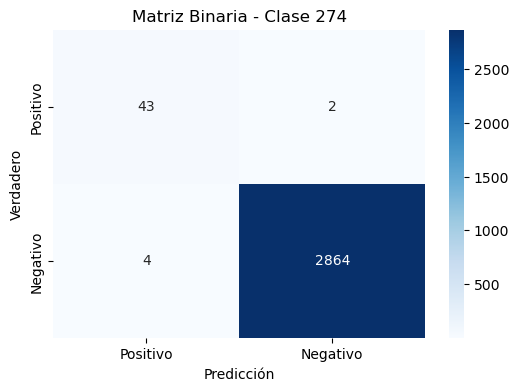

Métricas para la Clase 274:
  Precisión: 0.9149
  Recall: 0.9556
  F1-score: 0.9348
------------------------------
Matriz de Confusión Binaria para la Clase 275:


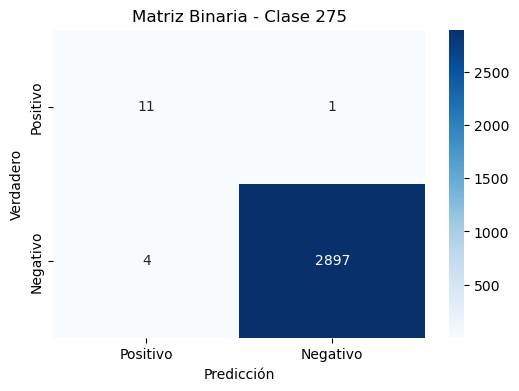

Métricas para la Clase 275:
  Precisión: 0.7333
  Recall: 0.9167
  F1-score: 0.8148
------------------------------
Matriz de Confusión Binaria para la Clase 276:


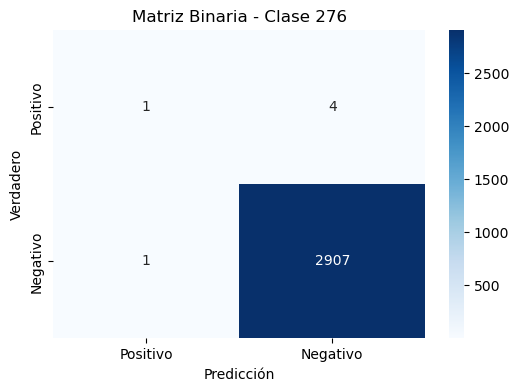

Métricas para la Clase 276:
  Precisión: 0.5000
  Recall: 0.2000
  F1-score: 0.2857
------------------------------
Matriz de Confusión Binaria para la Clase 277:


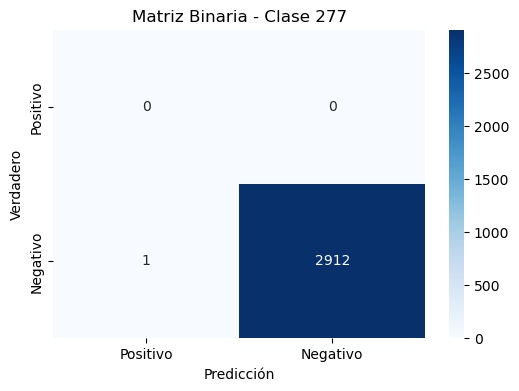

Métricas para la Clase 277:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 278:


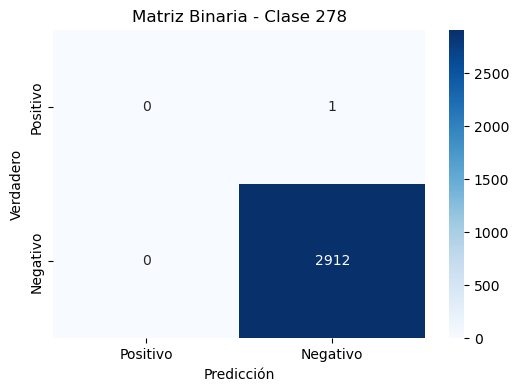

Métricas para la Clase 278:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 279:


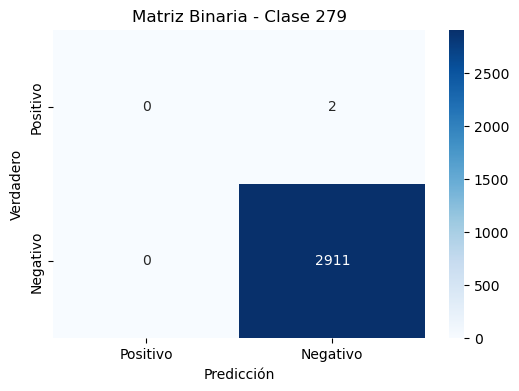

Métricas para la Clase 279:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 280:


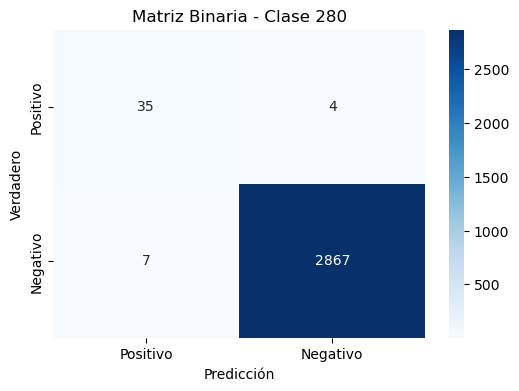

Métricas para la Clase 280:
  Precisión: 0.8333
  Recall: 0.8974
  F1-score: 0.8642
------------------------------
Matriz de Confusión Binaria para la Clase 281:


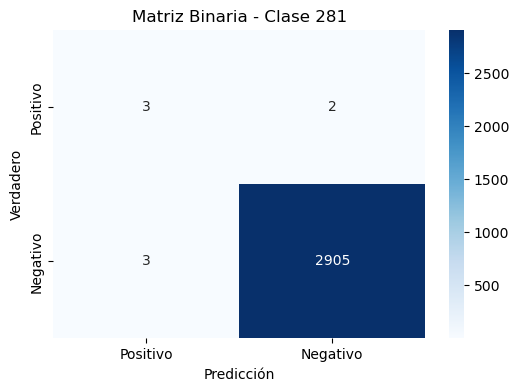

Métricas para la Clase 281:
  Precisión: 0.5000
  Recall: 0.6000
  F1-score: 0.5455
------------------------------
Matriz de Confusión Binaria para la Clase 282:


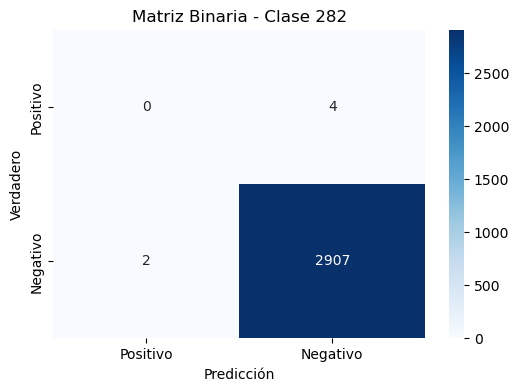

Métricas para la Clase 282:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 283:


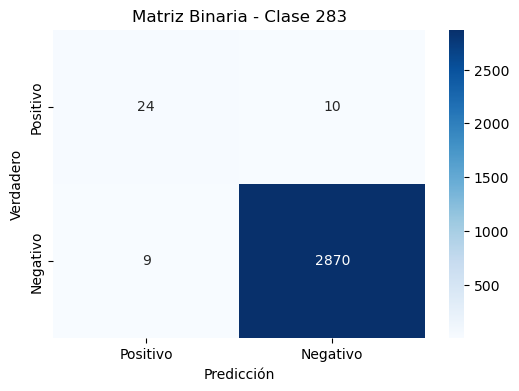

Métricas para la Clase 283:
  Precisión: 0.7273
  Recall: 0.7059
  F1-score: 0.7164
------------------------------
Matriz de Confusión Binaria para la Clase 284:


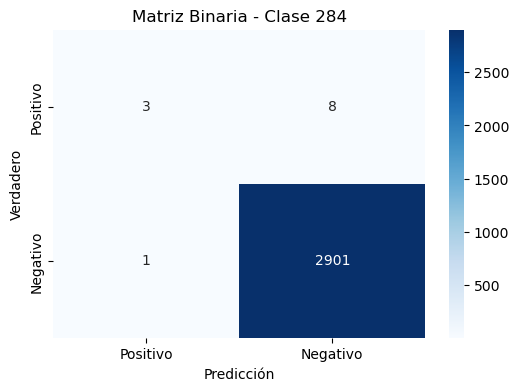

Métricas para la Clase 284:
  Precisión: 0.7500
  Recall: 0.2727
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 285:


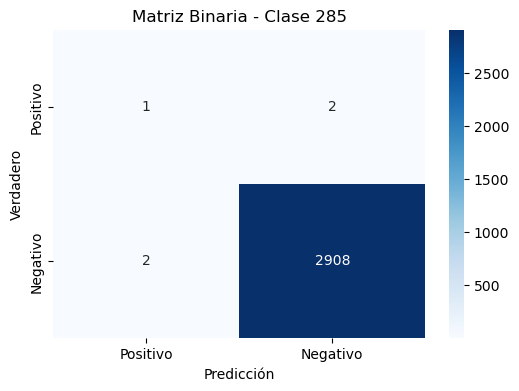

Métricas para la Clase 285:
  Precisión: 0.3333
  Recall: 0.3333
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 286:


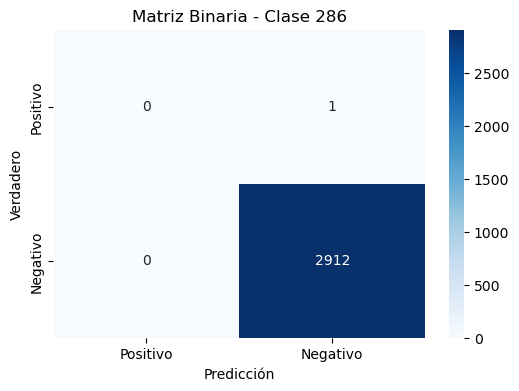

Métricas para la Clase 286:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 287:


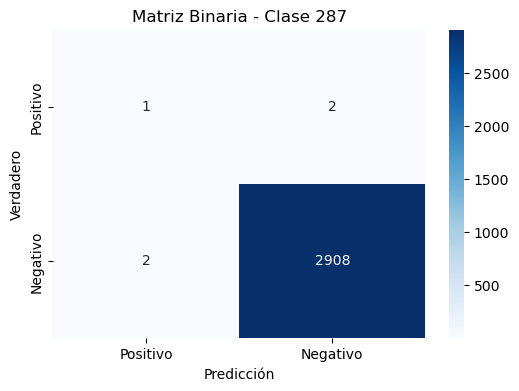

Métricas para la Clase 287:
  Precisión: 0.3333
  Recall: 0.3333
  F1-score: 0.3333
------------------------------
Matriz de Confusión Binaria para la Clase 288:


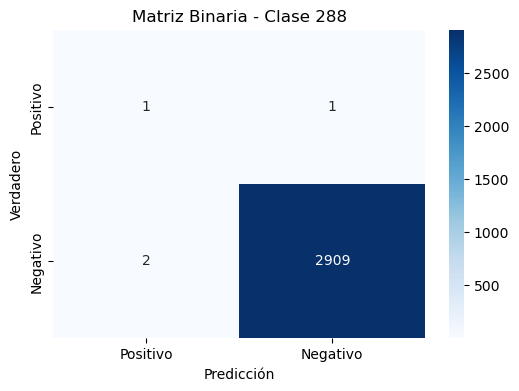

Métricas para la Clase 288:
  Precisión: 0.3333
  Recall: 0.5000
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 289:


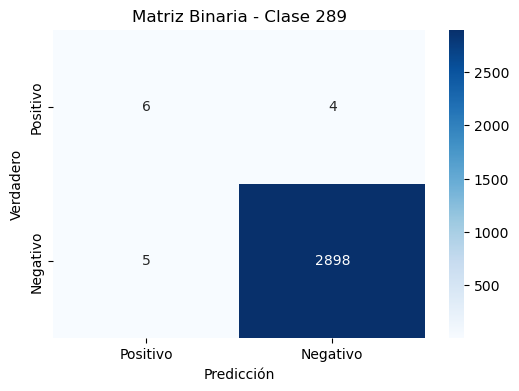

Métricas para la Clase 289:
  Precisión: 0.5455
  Recall: 0.6000
  F1-score: 0.5714
------------------------------
Matriz de Confusión Binaria para la Clase 290:


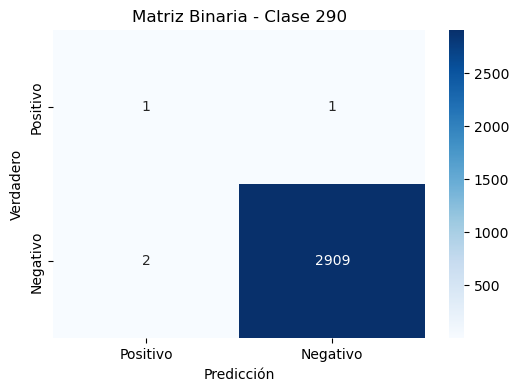

Métricas para la Clase 290:
  Precisión: 0.3333
  Recall: 0.5000
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 291:


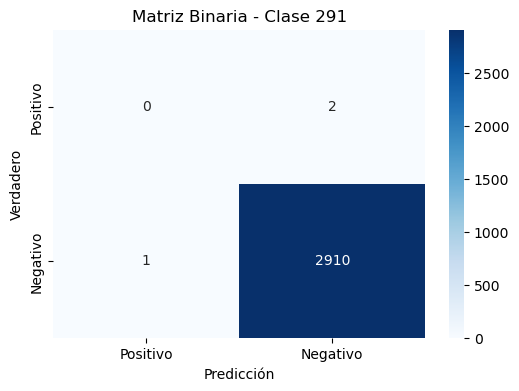

Métricas para la Clase 291:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 292:


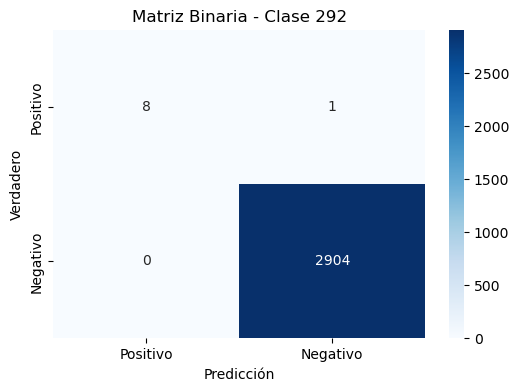

Métricas para la Clase 292:
  Precisión: 1.0000
  Recall: 0.8889
  F1-score: 0.9412
------------------------------
Matriz de Confusión Binaria para la Clase 293:


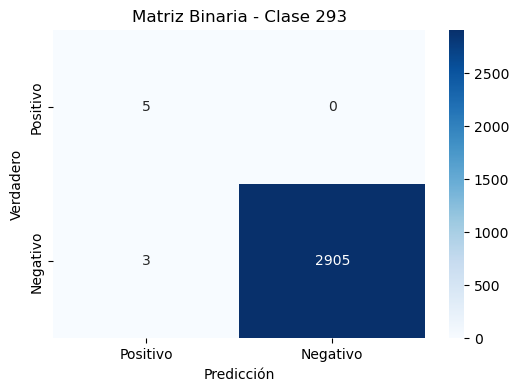

Métricas para la Clase 293:
  Precisión: 0.6250
  Recall: 1.0000
  F1-score: 0.7692
------------------------------
Matriz de Confusión Binaria para la Clase 294:


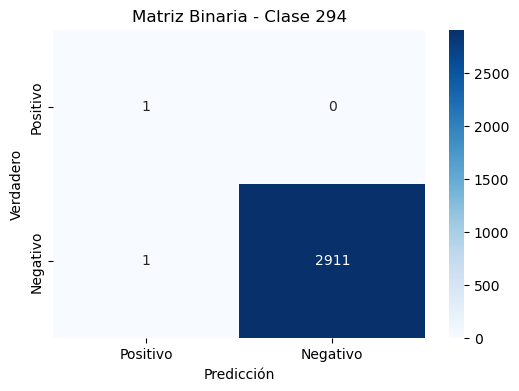

Métricas para la Clase 294:
  Precisión: 0.5000
  Recall: 1.0000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 295:


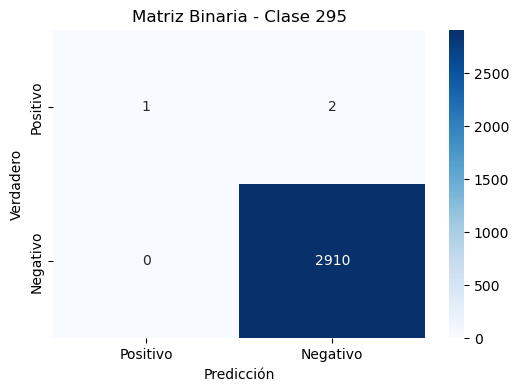

Métricas para la Clase 295:
  Precisión: 1.0000
  Recall: 0.3333
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 296:


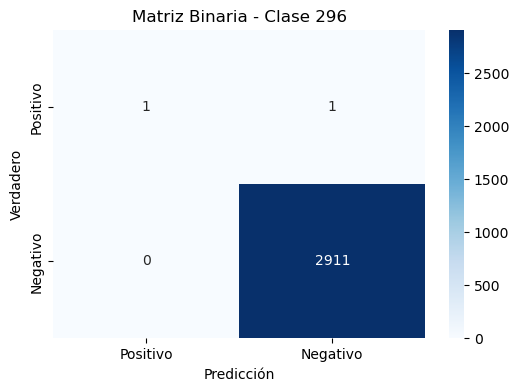

Métricas para la Clase 296:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 297:


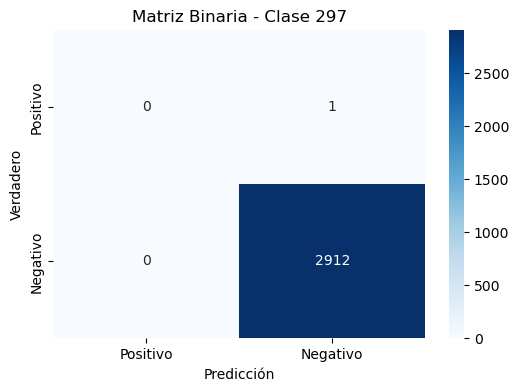

Métricas para la Clase 297:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 298:


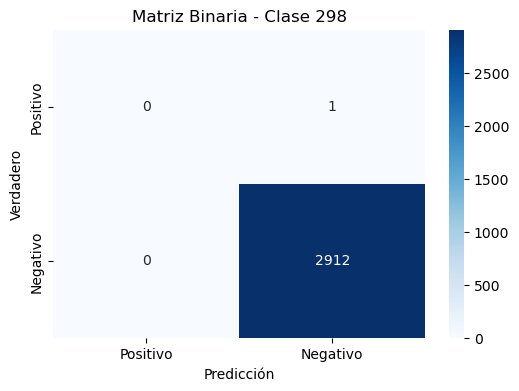

Métricas para la Clase 298:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 299:


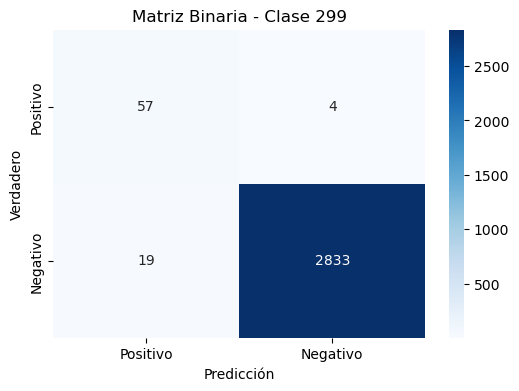

Métricas para la Clase 299:
  Precisión: 0.7500
  Recall: 0.9344
  F1-score: 0.8321
------------------------------
Matriz de Confusión Binaria para la Clase 300:


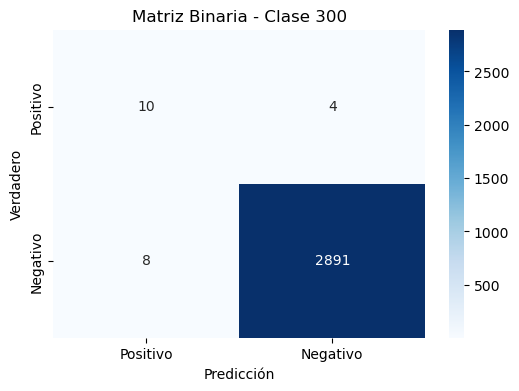

Métricas para la Clase 300:
  Precisión: 0.5556
  Recall: 0.7143
  F1-score: 0.6250
------------------------------
Matriz de Confusión Binaria para la Clase 301:


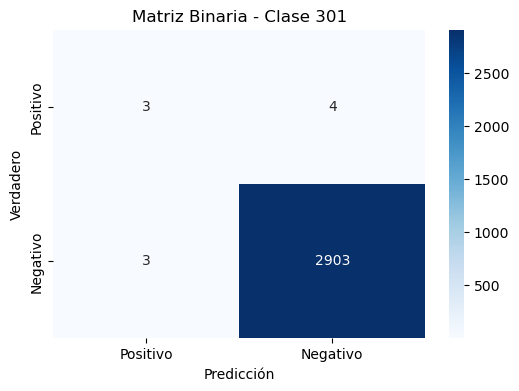

Métricas para la Clase 301:
  Precisión: 0.5000
  Recall: 0.4286
  F1-score: 0.4615
------------------------------
Matriz de Confusión Binaria para la Clase 302:


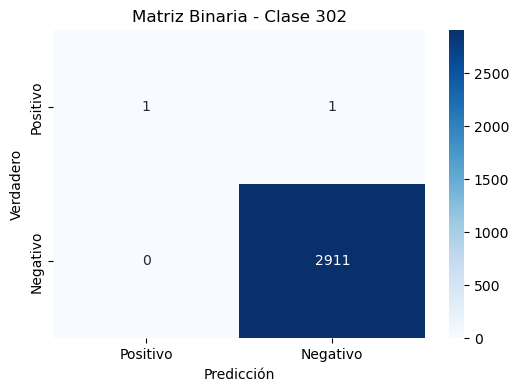

Métricas para la Clase 302:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 303:


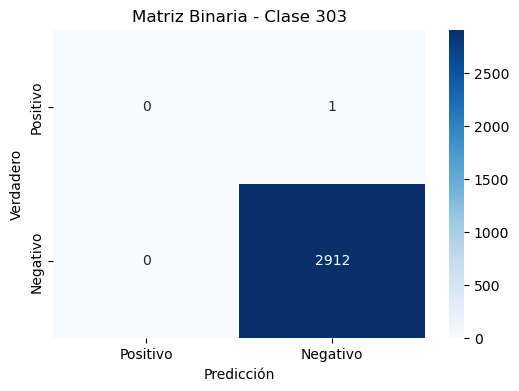

Métricas para la Clase 303:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 304:


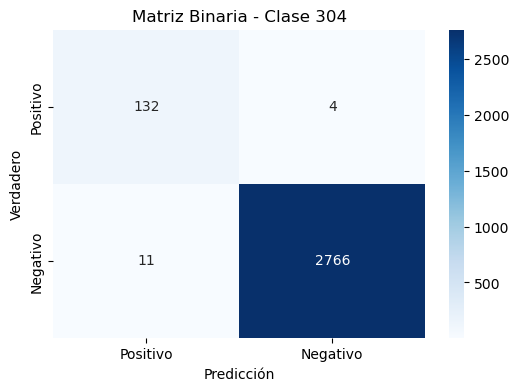

Métricas para la Clase 304:
  Precisión: 0.9231
  Recall: 0.9706
  F1-score: 0.9462
------------------------------
Matriz de Confusión Binaria para la Clase 305:


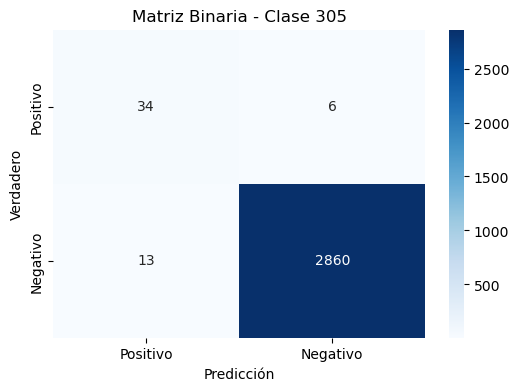

Métricas para la Clase 305:
  Precisión: 0.7234
  Recall: 0.8500
  F1-score: 0.7816
------------------------------
Matriz de Confusión Binaria para la Clase 306:


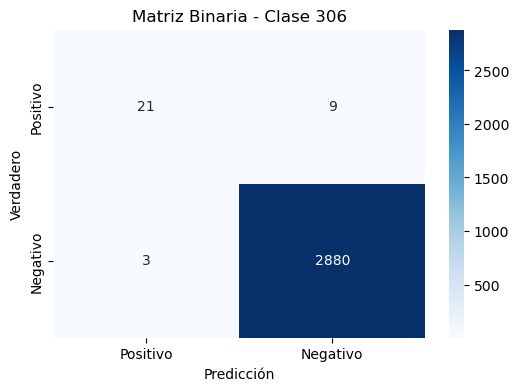

Métricas para la Clase 306:
  Precisión: 0.8750
  Recall: 0.7000
  F1-score: 0.7778
------------------------------
Matriz de Confusión Binaria para la Clase 307:


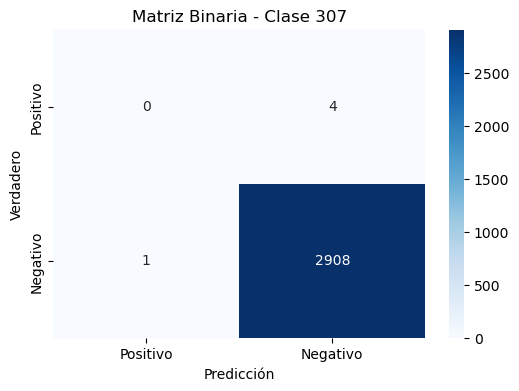

Métricas para la Clase 307:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 308:


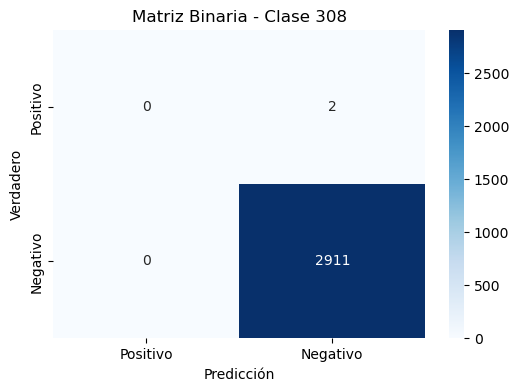

Métricas para la Clase 308:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 309:


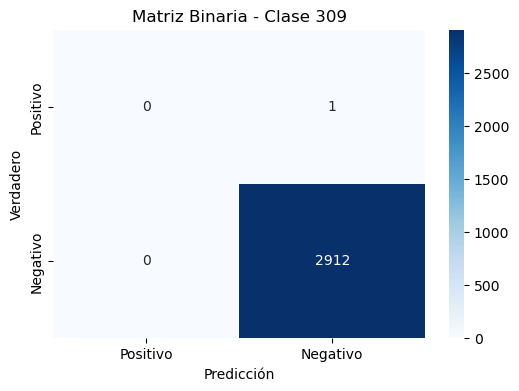

Métricas para la Clase 309:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 310:


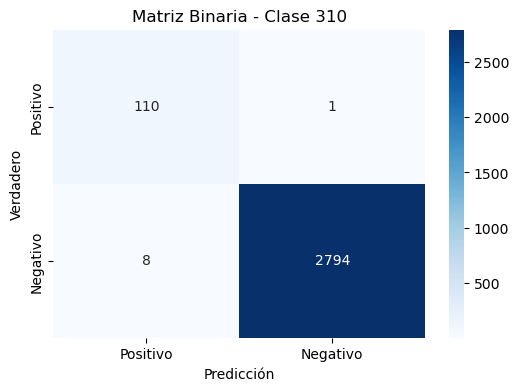

Métricas para la Clase 310:
  Precisión: 0.9322
  Recall: 0.9910
  F1-score: 0.9607
------------------------------
Matriz de Confusión Binaria para la Clase 311:


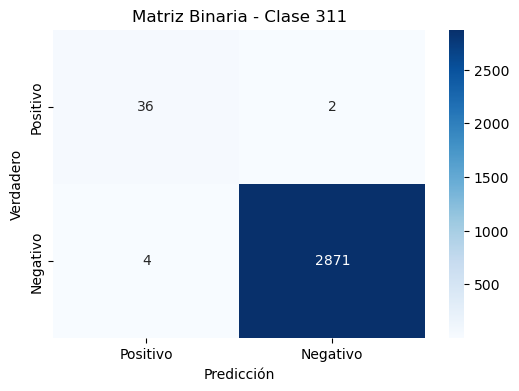

Métricas para la Clase 311:
  Precisión: 0.9000
  Recall: 0.9474
  F1-score: 0.9231
------------------------------
Matriz de Confusión Binaria para la Clase 312:


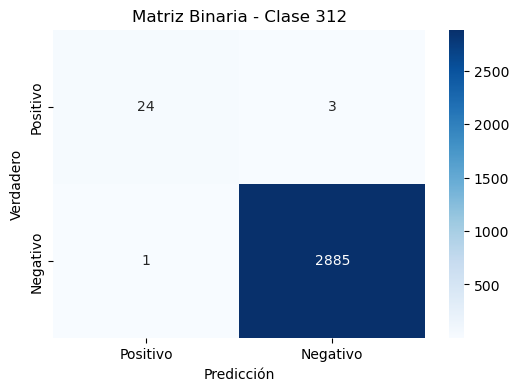

Métricas para la Clase 312:
  Precisión: 0.9600
  Recall: 0.8889
  F1-score: 0.9231
------------------------------
Matriz de Confusión Binaria para la Clase 313:


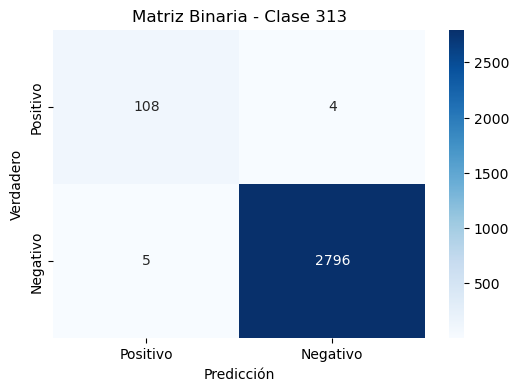

Métricas para la Clase 313:
  Precisión: 0.9558
  Recall: 0.9643
  F1-score: 0.9600
------------------------------
Matriz de Confusión Binaria para la Clase 314:


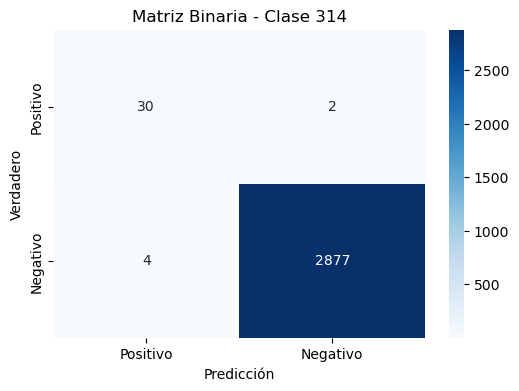

Métricas para la Clase 314:
  Precisión: 0.8824
  Recall: 0.9375
  F1-score: 0.9091
------------------------------
Matriz de Confusión Binaria para la Clase 315:


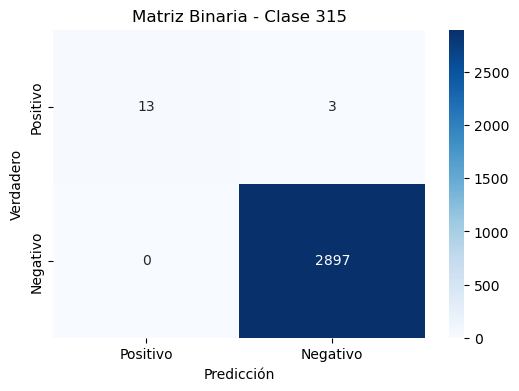

Métricas para la Clase 315:
  Precisión: 1.0000
  Recall: 0.8125
  F1-score: 0.8966
------------------------------
Matriz de Confusión Binaria para la Clase 316:


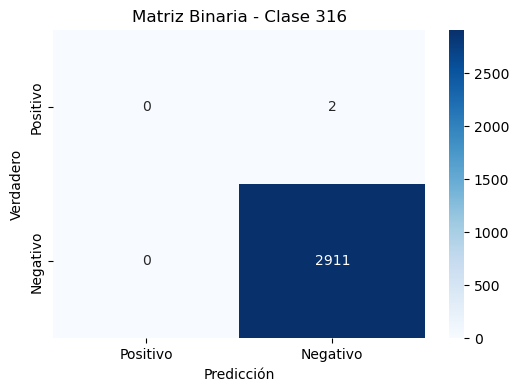

Métricas para la Clase 316:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 317:


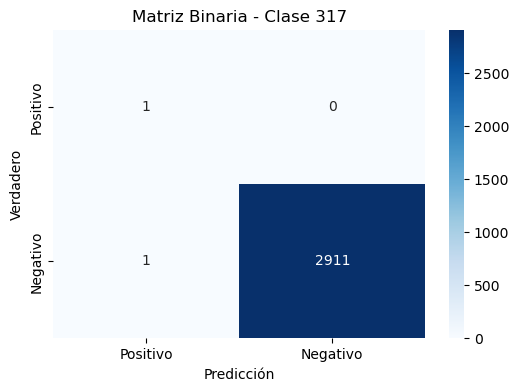

Métricas para la Clase 317:
  Precisión: 0.5000
  Recall: 1.0000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 318:


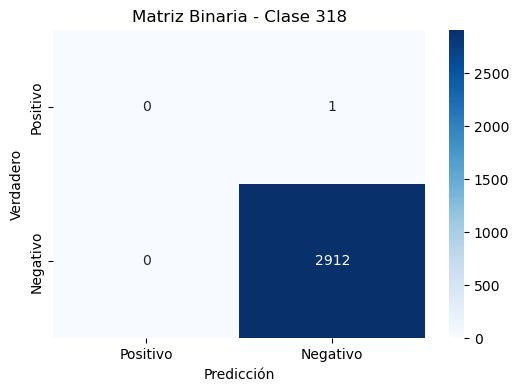

Métricas para la Clase 318:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 319:


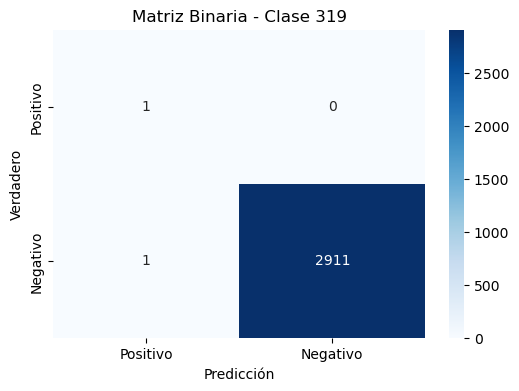

Métricas para la Clase 319:
  Precisión: 0.5000
  Recall: 1.0000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 320:


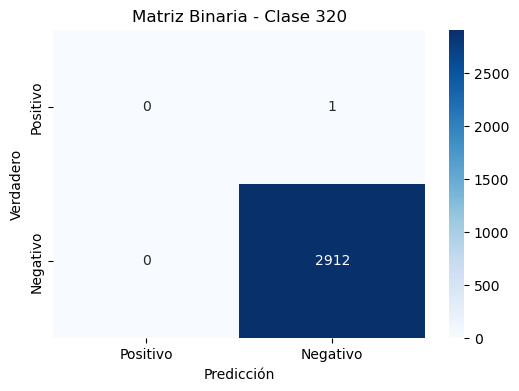

Métricas para la Clase 320:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 321:


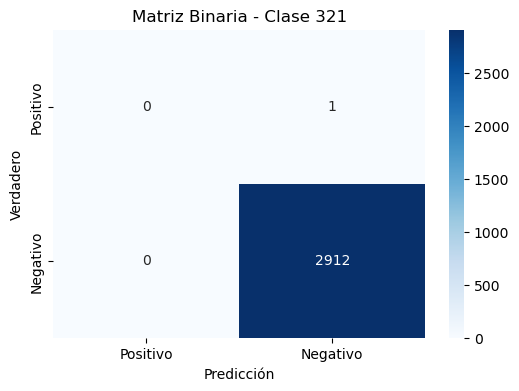

Métricas para la Clase 321:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 322:


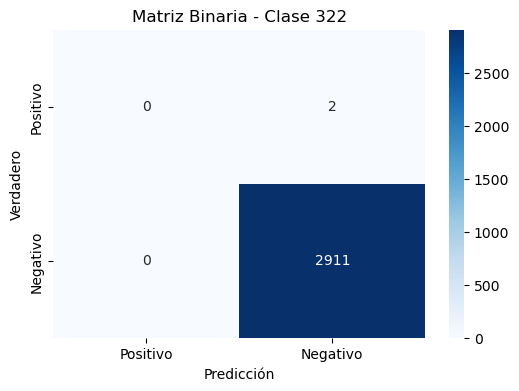

Métricas para la Clase 322:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 323:


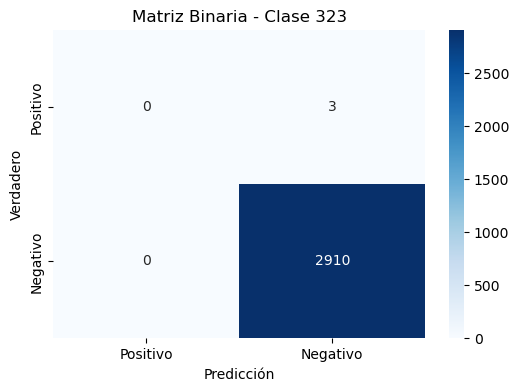

Métricas para la Clase 323:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 324:


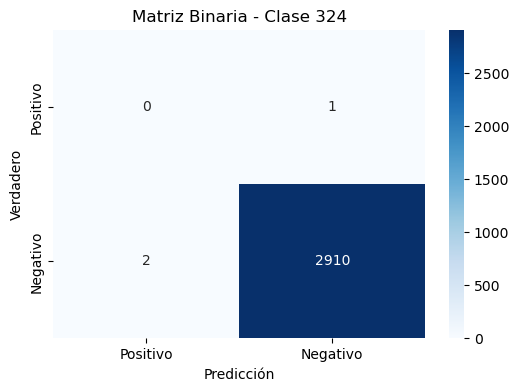

Métricas para la Clase 324:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 325:


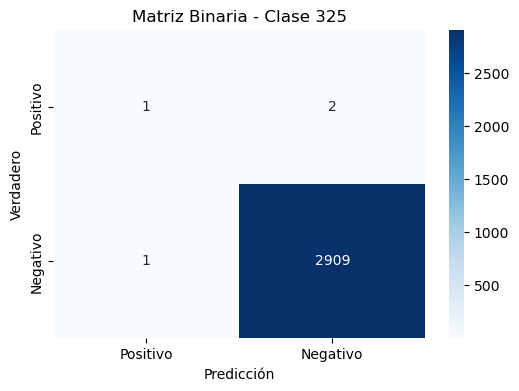

Métricas para la Clase 325:
  Precisión: 0.5000
  Recall: 0.3333
  F1-score: 0.4000
------------------------------
Matriz de Confusión Binaria para la Clase 326:


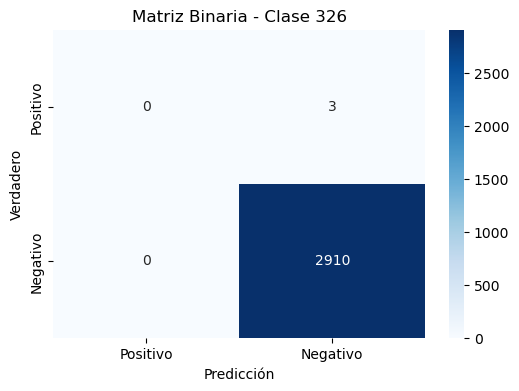

Métricas para la Clase 326:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 327:


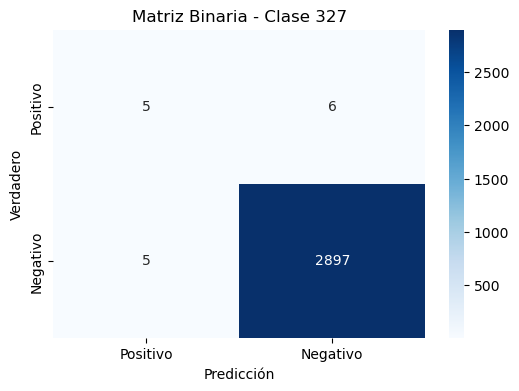

Métricas para la Clase 327:
  Precisión: 0.5000
  Recall: 0.4545
  F1-score: 0.4762
------------------------------
Matriz de Confusión Binaria para la Clase 328:


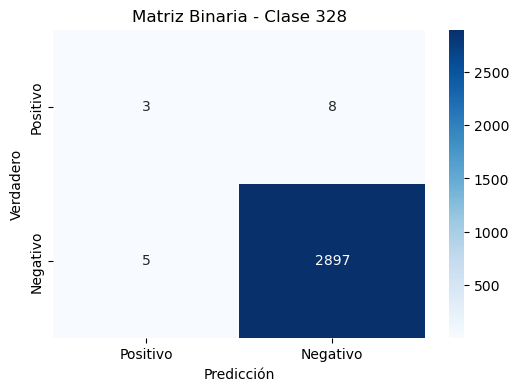

Métricas para la Clase 328:
  Precisión: 0.3750
  Recall: 0.2727
  F1-score: 0.3158
------------------------------
Matriz de Confusión Binaria para la Clase 329:


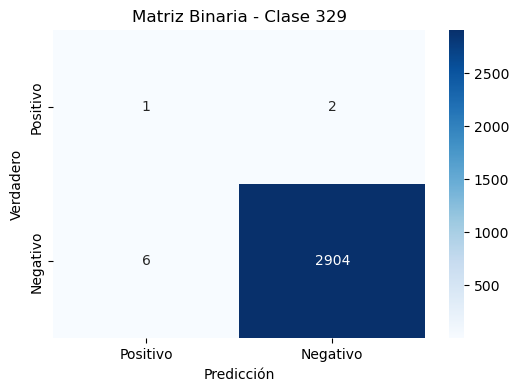

Métricas para la Clase 329:
  Precisión: 0.1429
  Recall: 0.3333
  F1-score: 0.2000
------------------------------
Matriz de Confusión Binaria para la Clase 330:


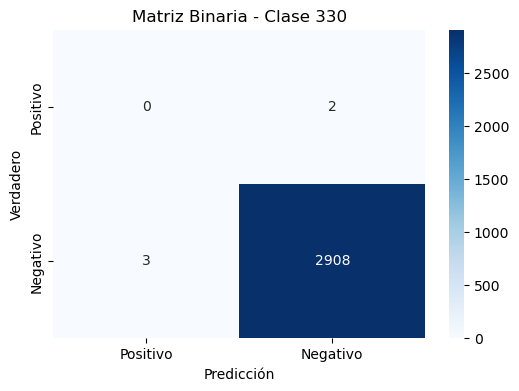

Métricas para la Clase 330:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 331:


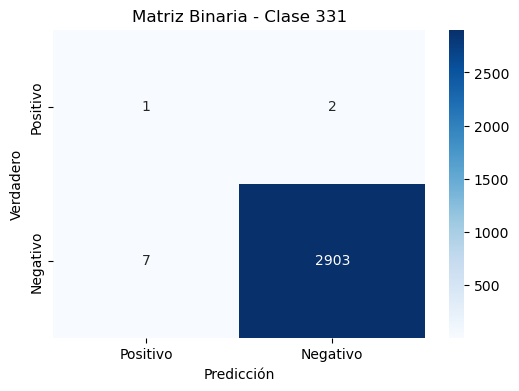

Métricas para la Clase 331:
  Precisión: 0.1250
  Recall: 0.3333
  F1-score: 0.1818
------------------------------
Matriz de Confusión Binaria para la Clase 332:


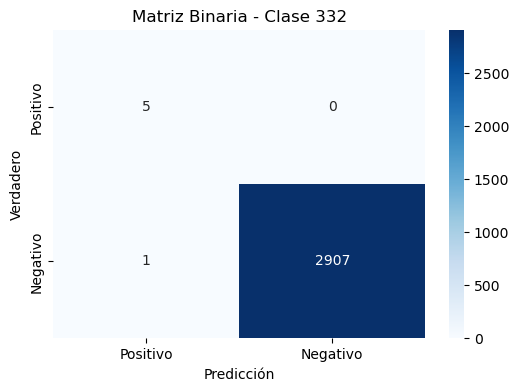

Métricas para la Clase 332:
  Precisión: 0.8333
  Recall: 1.0000
  F1-score: 0.9091
------------------------------
Matriz de Confusión Binaria para la Clase 333:


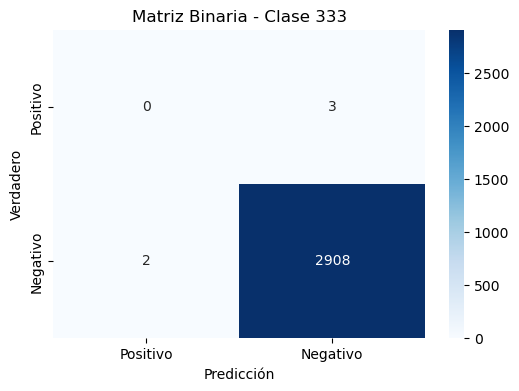

Métricas para la Clase 333:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 334:


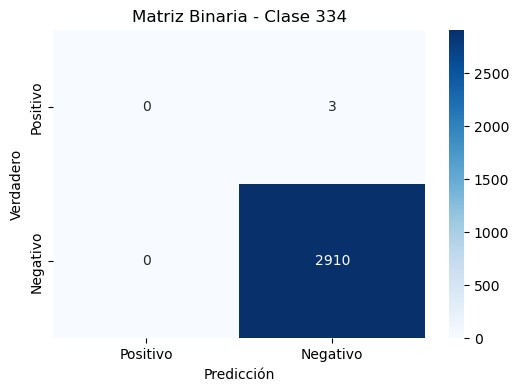

Métricas para la Clase 334:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 335:


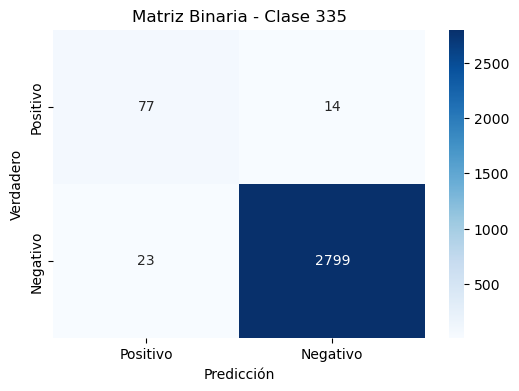

Métricas para la Clase 335:
  Precisión: 0.7700
  Recall: 0.8462
  F1-score: 0.8063
------------------------------
Matriz de Confusión Binaria para la Clase 336:


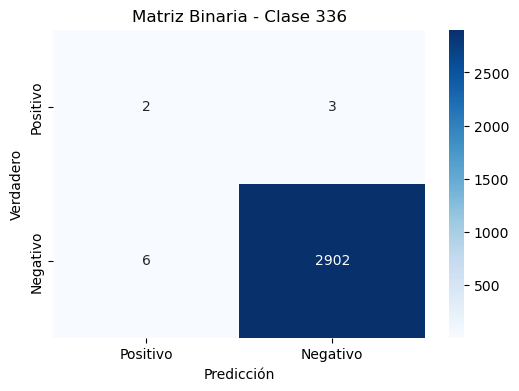

Métricas para la Clase 336:
  Precisión: 0.2500
  Recall: 0.4000
  F1-score: 0.3077
------------------------------
Matriz de Confusión Binaria para la Clase 337:


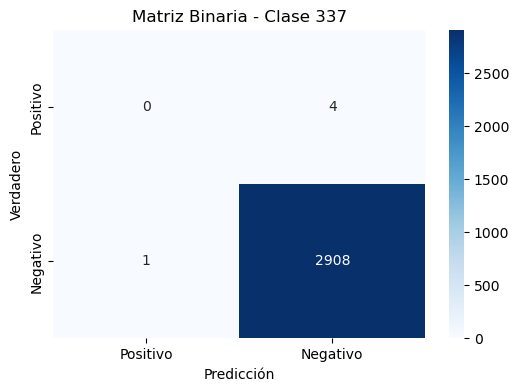

Métricas para la Clase 337:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 338:


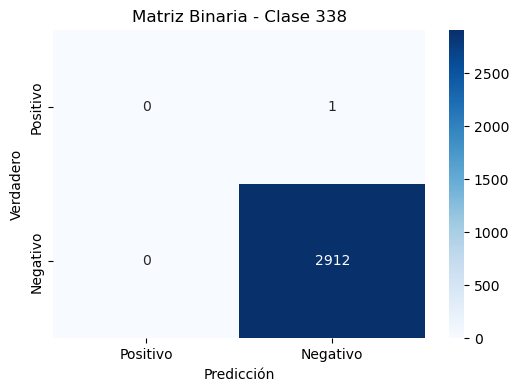

Métricas para la Clase 338:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 339:


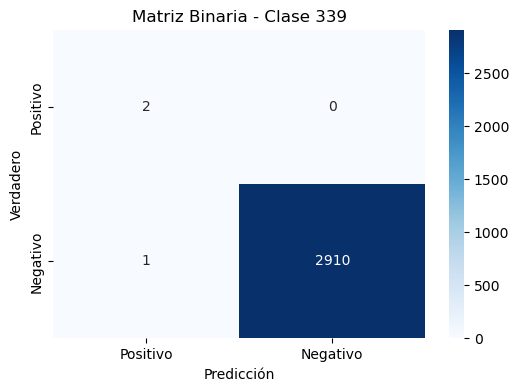

Métricas para la Clase 339:
  Precisión: 0.6667
  Recall: 1.0000
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 340:


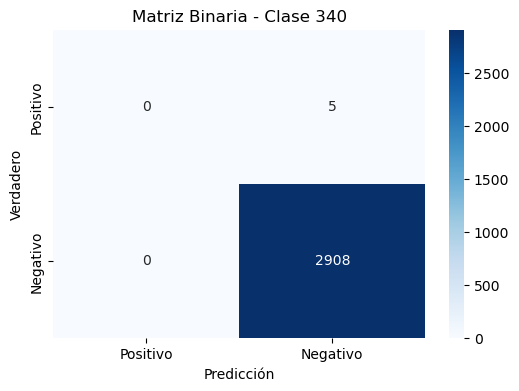

Métricas para la Clase 340:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 341:


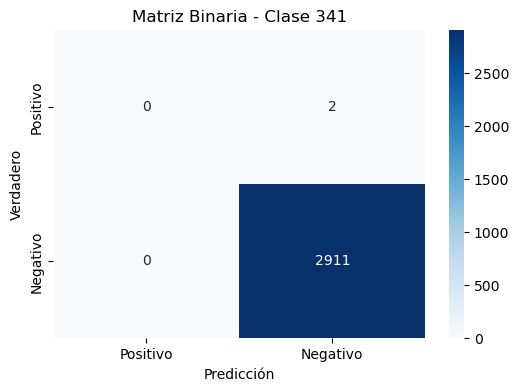

Métricas para la Clase 341:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 342:


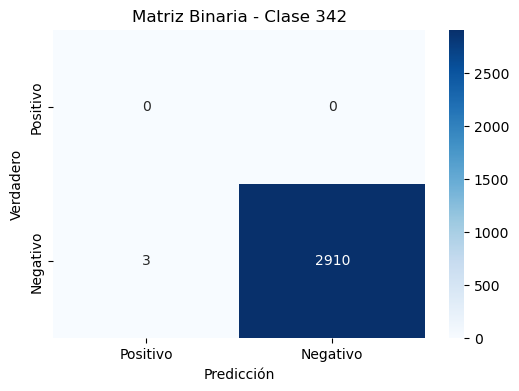

Métricas para la Clase 342:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 343:


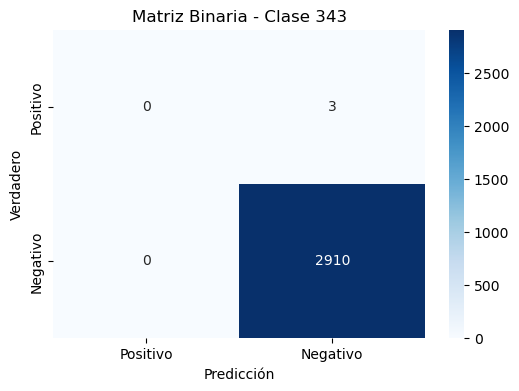

Métricas para la Clase 343:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 344:


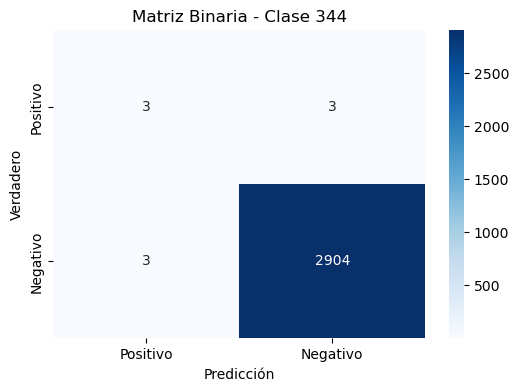

Métricas para la Clase 344:
  Precisión: 0.5000
  Recall: 0.5000
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 345:


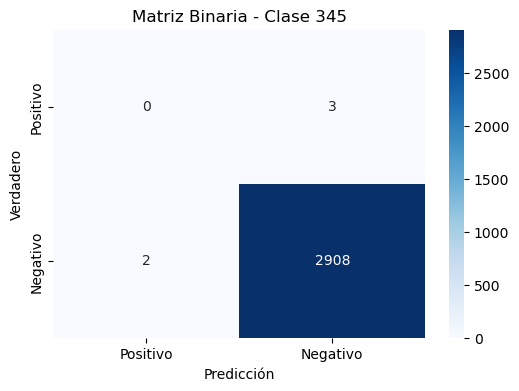

Métricas para la Clase 345:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 346:


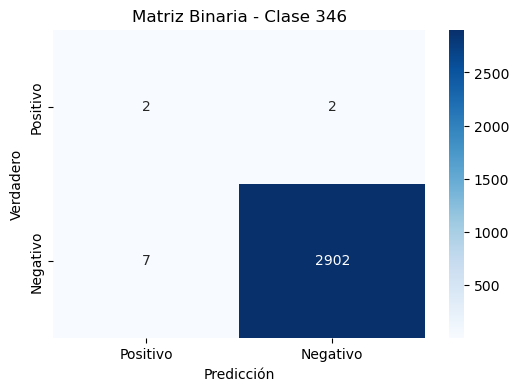

Métricas para la Clase 346:
  Precisión: 0.2222
  Recall: 0.5000
  F1-score: 0.3077
------------------------------
Matriz de Confusión Binaria para la Clase 347:


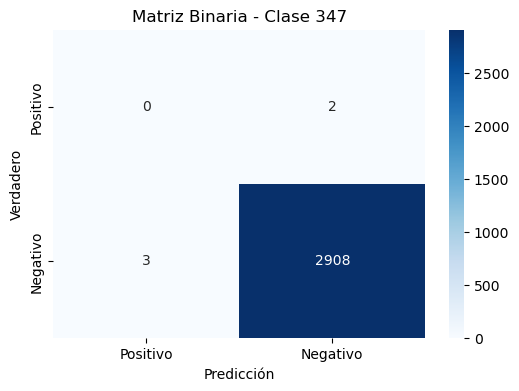

Métricas para la Clase 347:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 348:


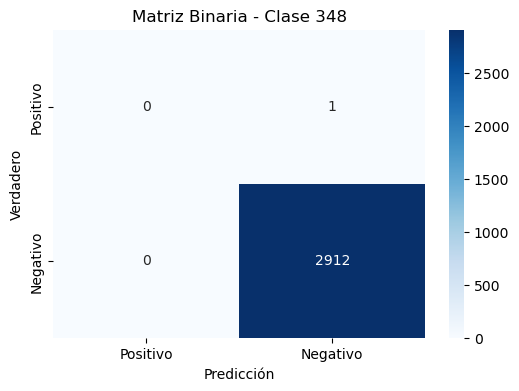

Métricas para la Clase 348:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 349:


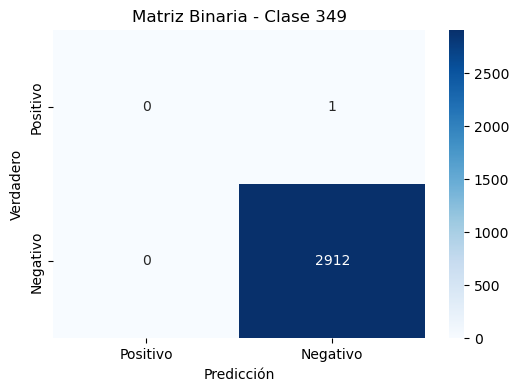

Métricas para la Clase 349:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 350:


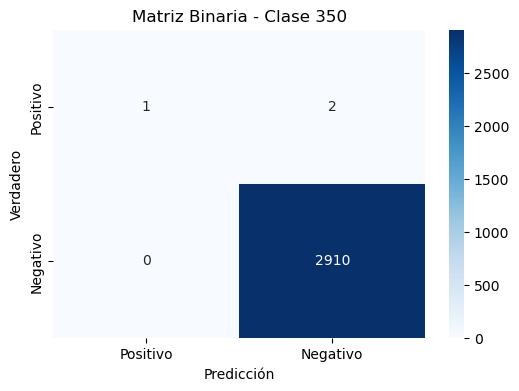

Métricas para la Clase 350:
  Precisión: 1.0000
  Recall: 0.3333
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 351:


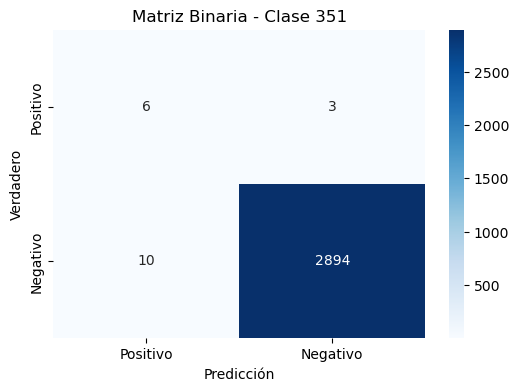

Métricas para la Clase 351:
  Precisión: 0.3750
  Recall: 0.6667
  F1-score: 0.4800
------------------------------
Matriz de Confusión Binaria para la Clase 352:


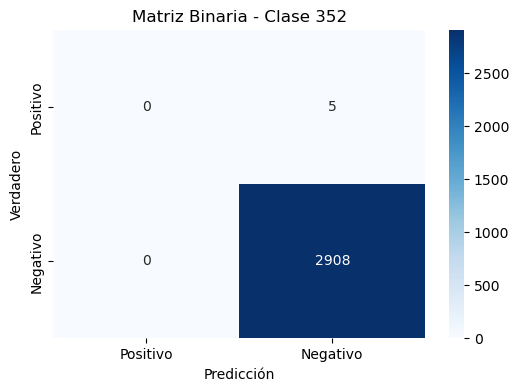

Métricas para la Clase 352:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 353:


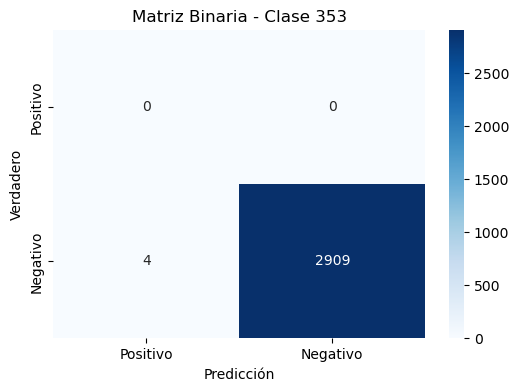

Métricas para la Clase 353:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 354:


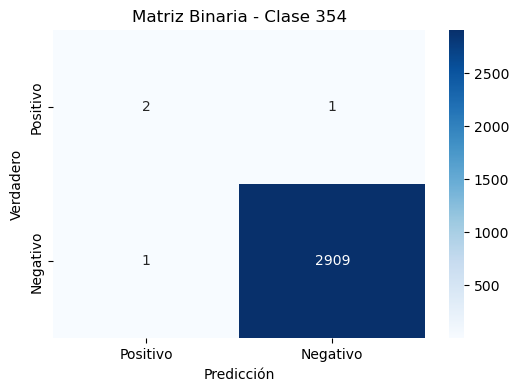

Métricas para la Clase 354:
  Precisión: 0.6667
  Recall: 0.6667
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 355:


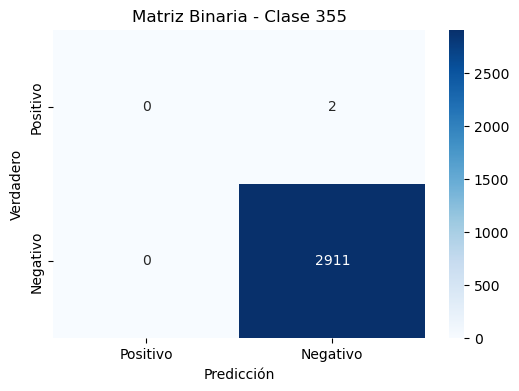

Métricas para la Clase 355:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 356:


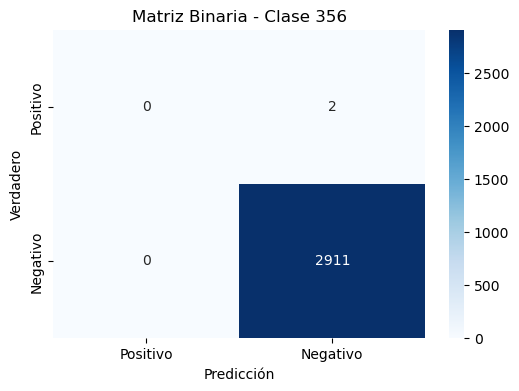

Métricas para la Clase 356:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 357:


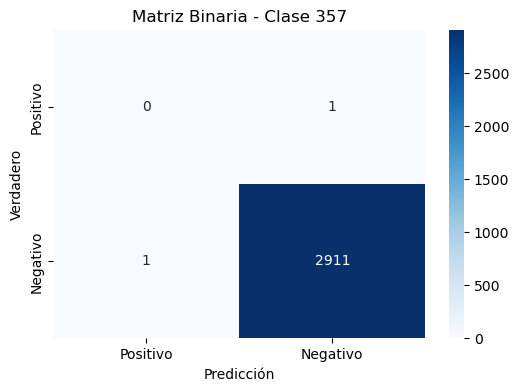

Métricas para la Clase 357:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 358:


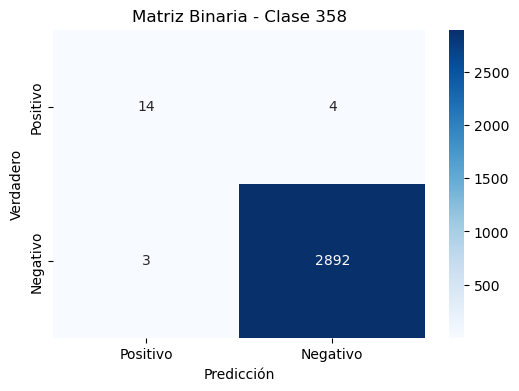

Métricas para la Clase 358:
  Precisión: 0.8235
  Recall: 0.7778
  F1-score: 0.8000
------------------------------
Matriz de Confusión Binaria para la Clase 359:


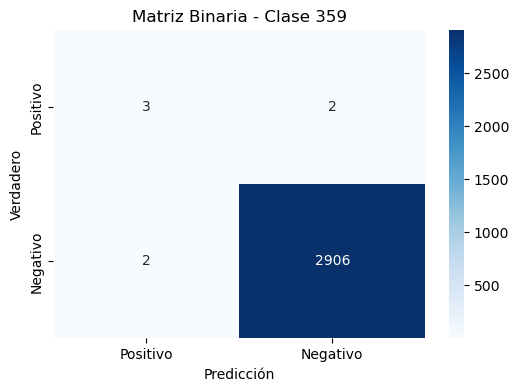

Métricas para la Clase 359:
  Precisión: 0.6000
  Recall: 0.6000
  F1-score: 0.6000
------------------------------
Matriz de Confusión Binaria para la Clase 360:


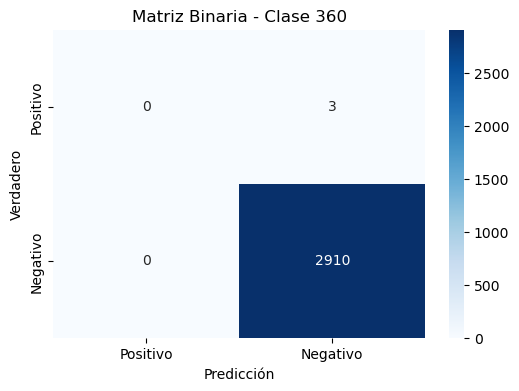

Métricas para la Clase 360:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 361:


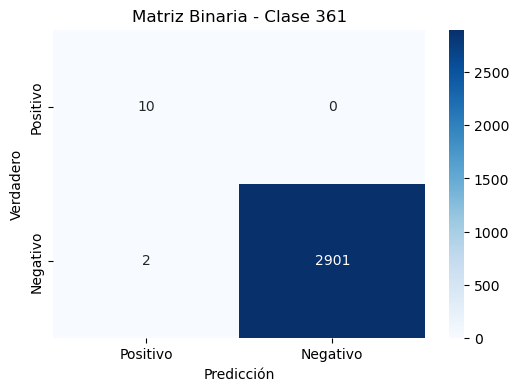

Métricas para la Clase 361:
  Precisión: 0.8333
  Recall: 1.0000
  F1-score: 0.9091
------------------------------
Matriz de Confusión Binaria para la Clase 362:


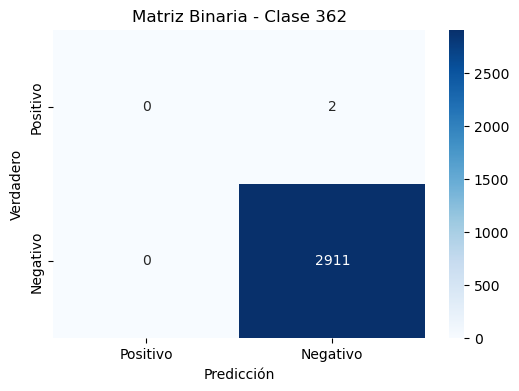

Métricas para la Clase 362:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 363:


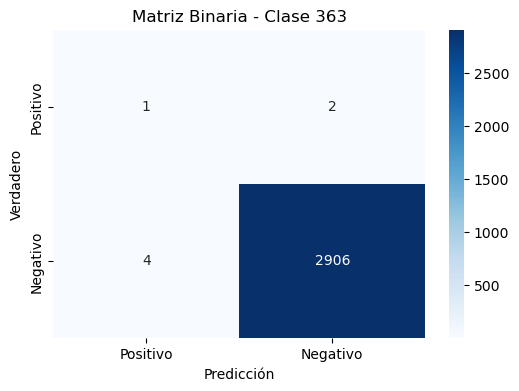

Métricas para la Clase 363:
  Precisión: 0.2000
  Recall: 0.3333
  F1-score: 0.2500
------------------------------
Matriz de Confusión Binaria para la Clase 364:


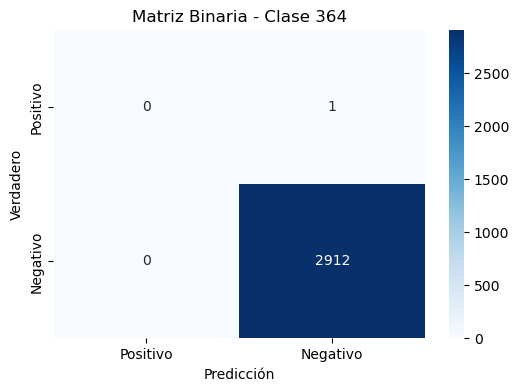

Métricas para la Clase 364:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 365:


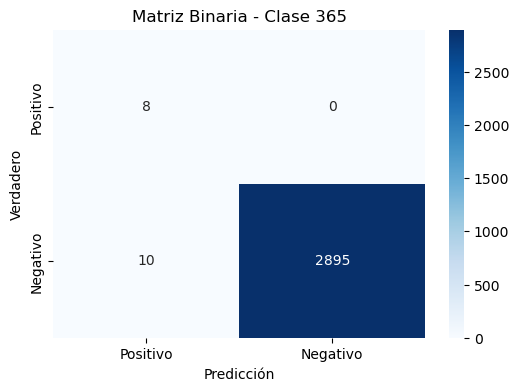

Métricas para la Clase 365:
  Precisión: 0.4444
  Recall: 1.0000
  F1-score: 0.6154
------------------------------
Matriz de Confusión Binaria para la Clase 366:


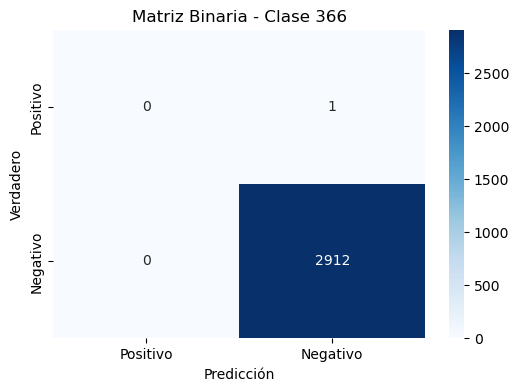

Métricas para la Clase 366:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 367:


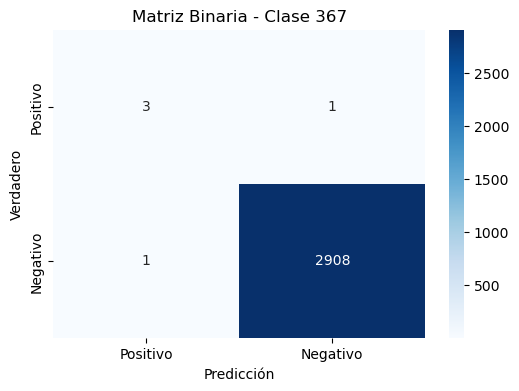

Métricas para la Clase 367:
  Precisión: 0.7500
  Recall: 0.7500
  F1-score: 0.7500
------------------------------
Matriz de Confusión Binaria para la Clase 368:


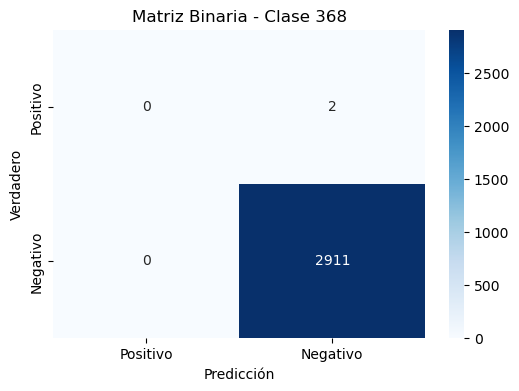

Métricas para la Clase 368:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 369:


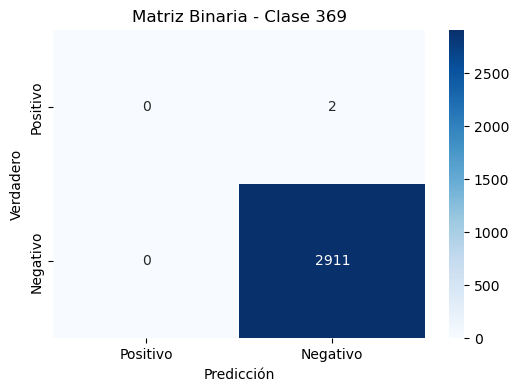

Métricas para la Clase 369:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 370:


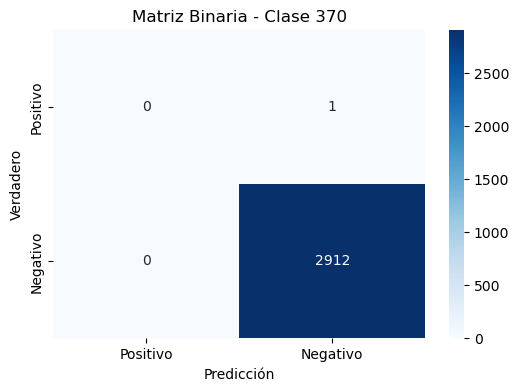

Métricas para la Clase 370:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 371:


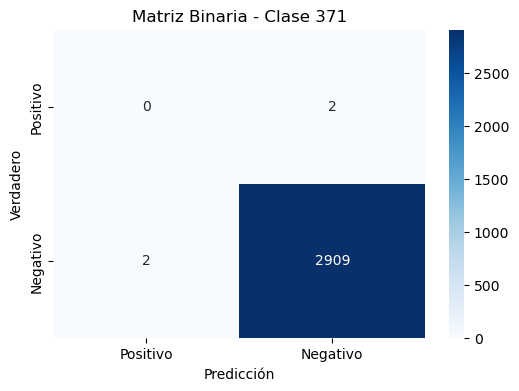

Métricas para la Clase 371:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 372:


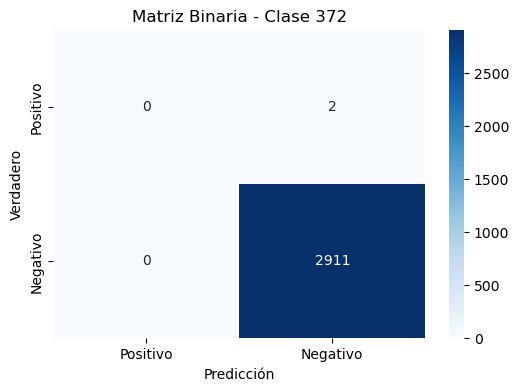

Métricas para la Clase 372:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 373:


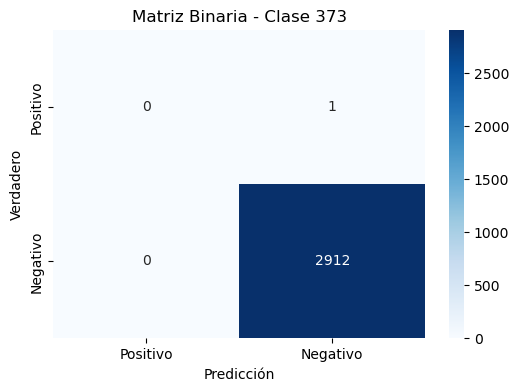

Métricas para la Clase 373:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 374:


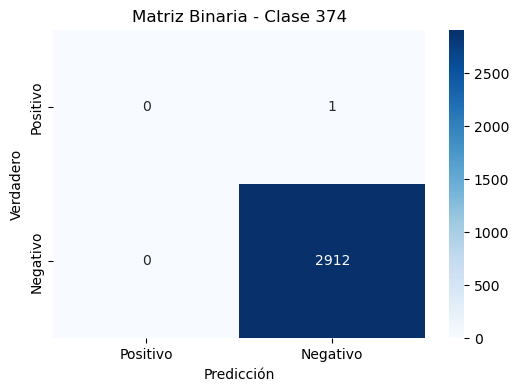

Métricas para la Clase 374:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 375:


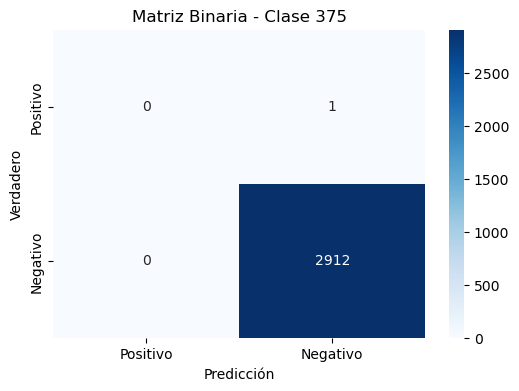

Métricas para la Clase 375:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 376:


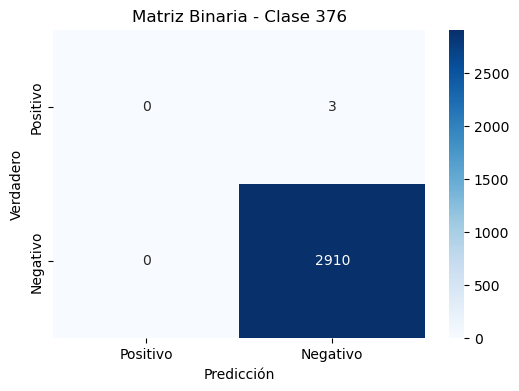

Métricas para la Clase 376:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 377:


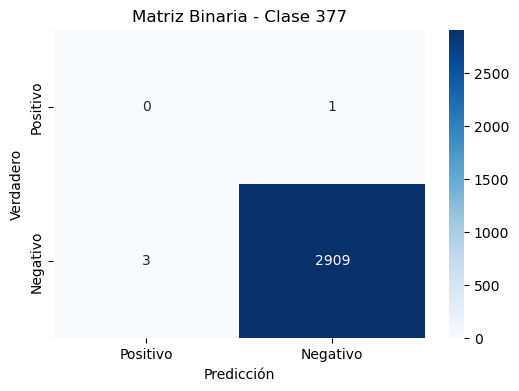

Métricas para la Clase 377:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 378:


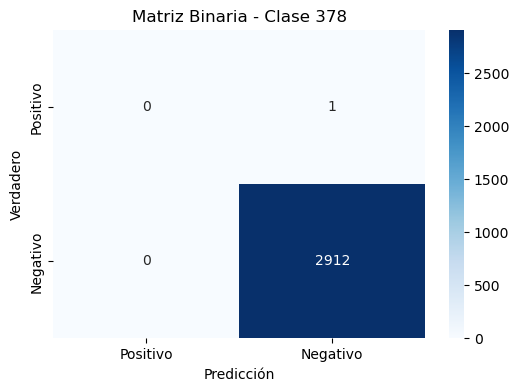

Métricas para la Clase 378:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 379:


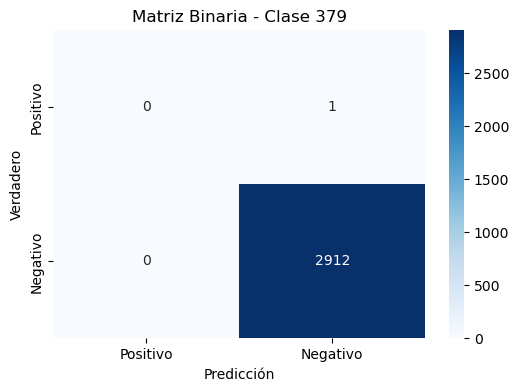

Métricas para la Clase 379:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 380:


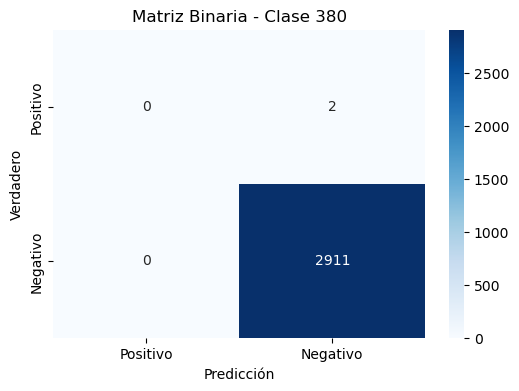

Métricas para la Clase 380:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 381:


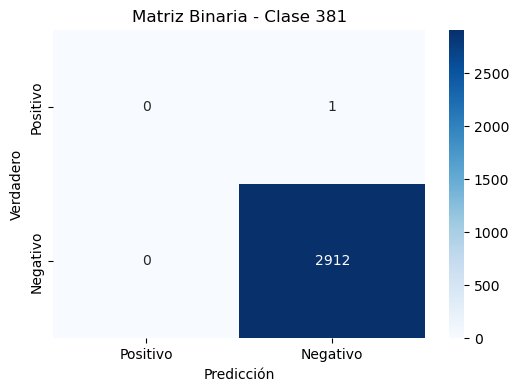

Métricas para la Clase 381:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 382:


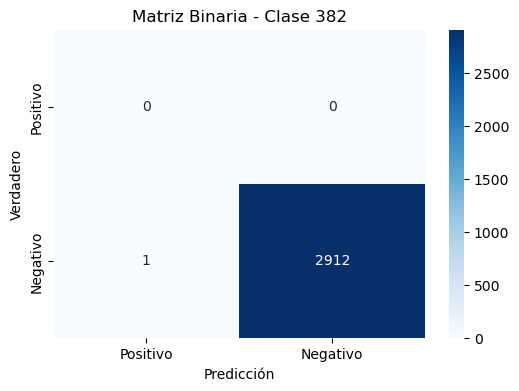

Métricas para la Clase 382:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 383:


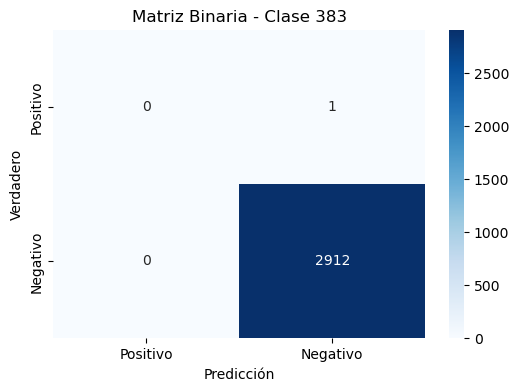

Métricas para la Clase 383:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 384:


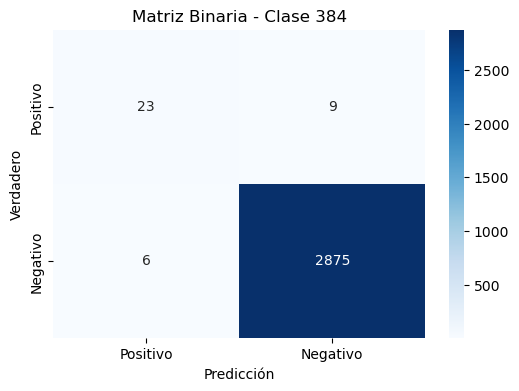

Métricas para la Clase 384:
  Precisión: 0.7931
  Recall: 0.7188
  F1-score: 0.7541
------------------------------
Matriz de Confusión Binaria para la Clase 385:


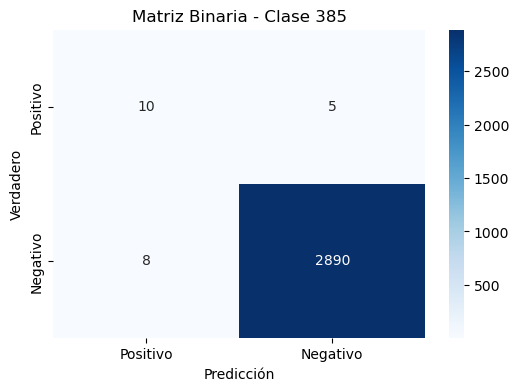

Métricas para la Clase 385:
  Precisión: 0.5556
  Recall: 0.6667
  F1-score: 0.6061
------------------------------
Matriz de Confusión Binaria para la Clase 386:


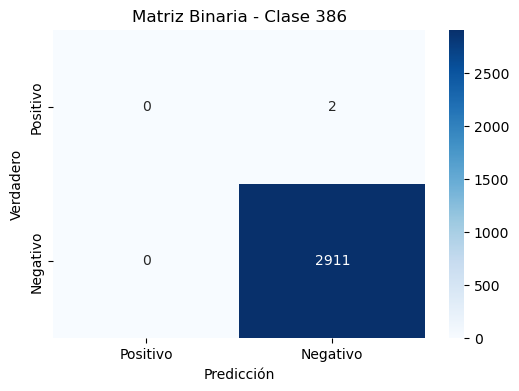

Métricas para la Clase 386:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 387:


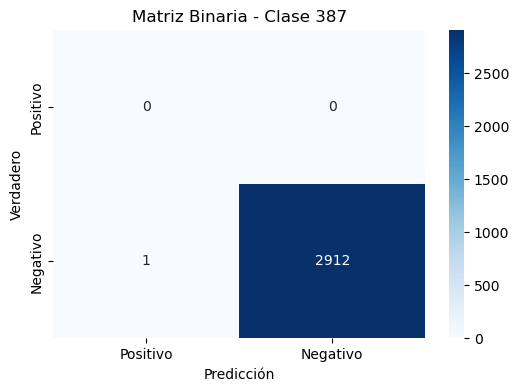

Métricas para la Clase 387:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 388:


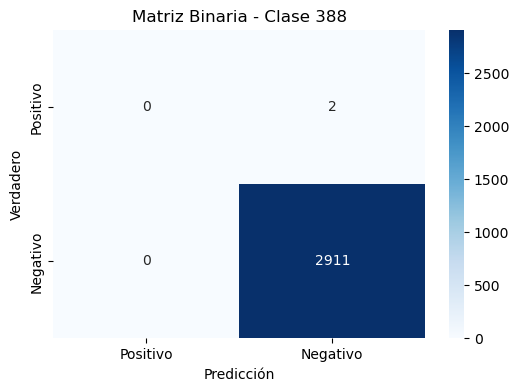

Métricas para la Clase 388:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 389:


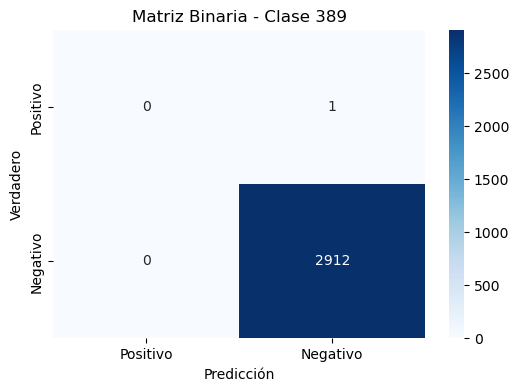

Métricas para la Clase 389:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 390:


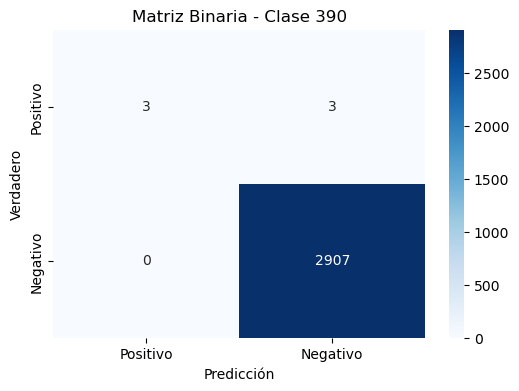

Métricas para la Clase 390:
  Precisión: 1.0000
  Recall: 0.5000
  F1-score: 0.6667
------------------------------
Matriz de Confusión Binaria para la Clase 391:


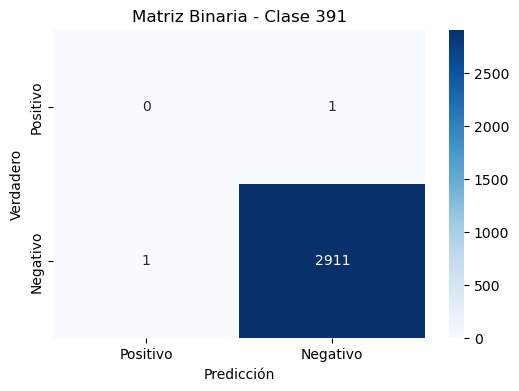

Métricas para la Clase 391:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 392:


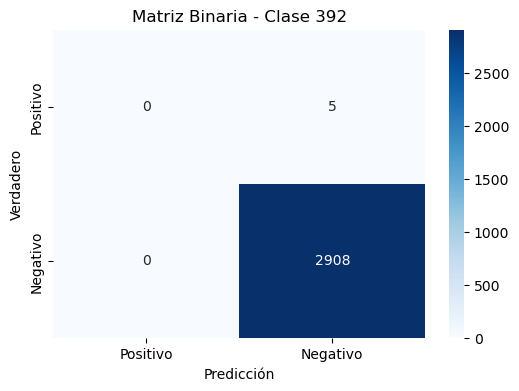

Métricas para la Clase 392:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 393:


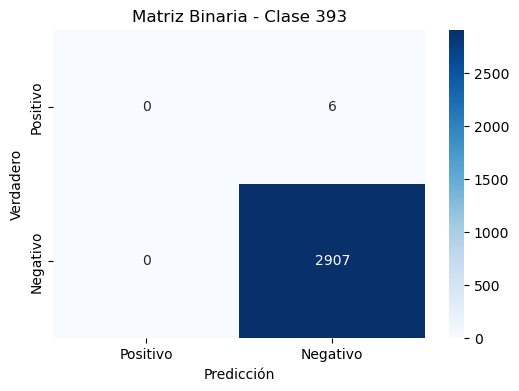

Métricas para la Clase 393:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 394:


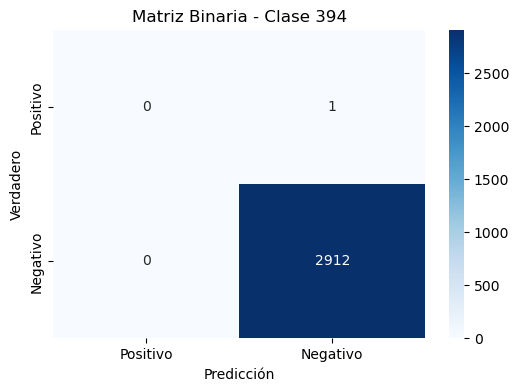

Métricas para la Clase 394:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 395:


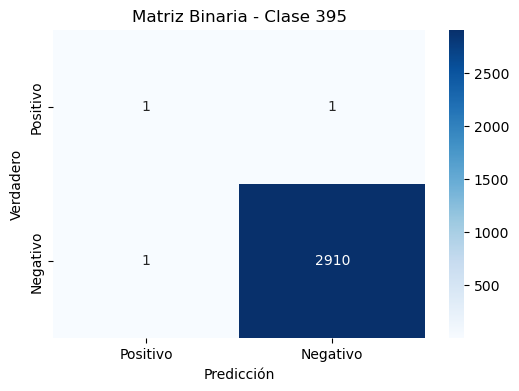

Métricas para la Clase 395:
  Precisión: 0.5000
  Recall: 0.5000
  F1-score: 0.5000
------------------------------
Matriz de Confusión Binaria para la Clase 396:


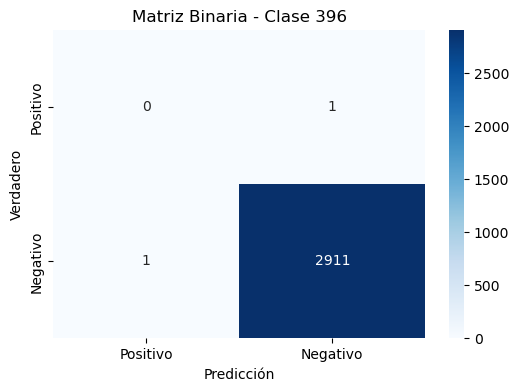

Métricas para la Clase 396:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------
Matriz de Confusión Binaria para la Clase 397:


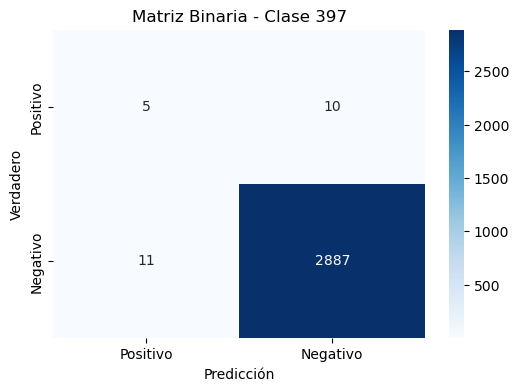

Métricas para la Clase 397:
  Precisión: 0.3125
  Recall: 0.3333
  F1-score: 0.3226
------------------------------
Matriz de Confusión Binaria para la Clase 398:


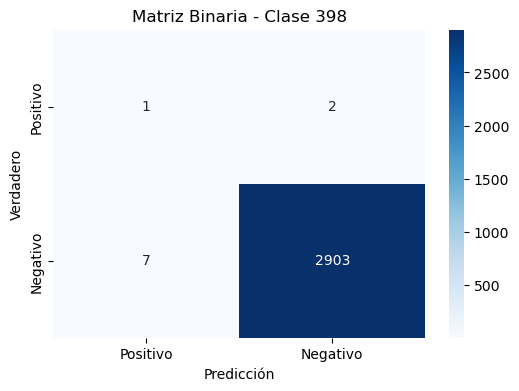

Métricas para la Clase 398:
  Precisión: 0.1250
  Recall: 0.3333
  F1-score: 0.1818
------------------------------
Matriz de Confusión Binaria para la Clase 399:


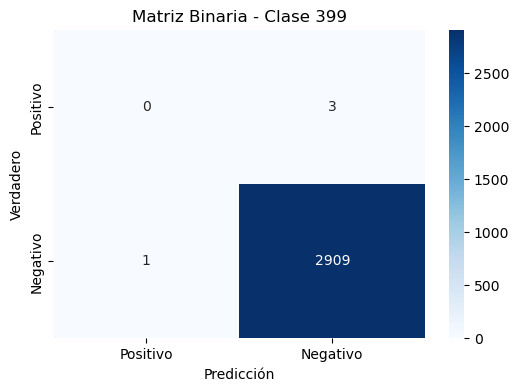

Métricas para la Clase 399:
  Precisión: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
------------------------------


In [19]:
num_clases = cm.shape[0]

for i in range(num_clases):
    # Crear matriz binaria para la clase i
    cm_binario = np.zeros((2, 2), dtype=int)
    cm_binario[0, 0] = cm[i, i]  # Verdaderos Positivos
    cm_binario[0, 1] = np.sum(cm[i, :]) - cm[i, i]  # Falsos Negativos
    cm_binario[1, 0] = np.sum(cm[:, i]) - cm[i, i]  # Falsos Positivos
    cm_binario[1, 1] = np.sum(cm) - cm[i, :].sum() - cm[:, i].sum() + cm[i, i] # Verdaderos Negativos

    print(f"Matriz de Confusión Binaria para la Clase {i}:")

    # Visualizar la matriz de confusión binaria
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm_binario, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Positivo', 'Negativo'],
                yticklabels=['Positivo', 'Negativo'])
    plt.xlabel('Predicción')
    plt.ylabel('Verdadero')
    plt.title(f'Matriz Binaria - Clase {i}')
    plt.show()

    # Calcular precisión, recall y F1-score para la clase i
    tp = cm_binario[0, 0]
    fp = cm_binario[1, 0]
    fn = cm_binario[0, 1]

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    print(f"Métricas para la Clase {i}:")
    print(f"  Precisión: {precision:.4f}")
    print(f"  Recall: {recall:.4f}")
    print(f"  F1-score: {f1:.4f}")
    print("-" * 30)